In [1]:
%matplotlib notebook

In [2]:
import sys
sys.path.append("../../")

import dmp.data.logging as log
import pandas as pd
import gc
import time
import asyncpg
import asyncio
import os
import json
import datetime
import sqlalchemy

from sqlalchemy.ext.asyncio import create_async_engine

In [3]:
_database = "dmp"
try:
    filename = os.path.join(os.environ['HOME'], ".jobqueue.json")
    _data = json.loads(open(filename).read())
    _credentials = _data[_database]
    user = _credentials["user"]
except KeyError as e:
    raise Exception("No credetials for {} found in {}".format(_database, filename))
connection_string = 'postgresql://{user}:{password}@{host}:5432/{database}'.format(**_credentials)
# connection_string = 'postgresql+asyncpg://{user}:{password}@{host}:5432/{database}'.format(**_credentials)
del _credentials['table_name']


In [ ]:
import connectorx as cx
import orjson
from pathos.multiprocessing import Pool
import math
# async def fetch_as_dataframe(con: asyncpg.Connection, query: str, *args):
#     stmt = await con.prepare(query)
#     columns = [a.name for a in stmt.get_attributes()]
#     data = await stmt.fetch(*args)
#     return pandas.DataFrame(data, columns=columns)




def postprocess_dataframe(data_log):
#     print(f'{len(data_log)} records retrieved. Parsing json...')
    datasets = pd.json_normalize(data_log["doc"])
#     datasets = pd.json_normalize(data_log['doc'].map(orjson.loads))
#     print(f'Joining with original dataframe...')
    data_log.drop(['doc'], axis=1)
    datasets = datasets.join(data_log)
#     print(datasets.columns)
    datasets['id'] = datasets.astype({'id': 'str'}).dtypes
    datasets['job'] = datasets.astype({'job': 'str'}).dtypes
    return datasets

def func():

    # log_filename = 'aspect_analysis_datasets.feather'
    log_filename = 'aspect_analysis_datasets.parquet'
    # engine, session = log._connect()



    datasets = None
    min_time =  datetime.datetime.fromisoformat('2000-01-01 00:00:00')
    try:
    #     datasets = pd.read_feather(log_filename)
        datasets = pd.read_parquet(log_filename)
        min_time = datasets['timestamp'].min()
    except:
        print(f'Error reading dataset file, {log_filename}.')

        
    q = 'select count(*) from "log" where "groupname" IN (\'exp00\', \'exp01\') AND "timestamp" > \'%s\'' % min_time
    
    db = sqlalchemy.create_engine(connection_string)
    engine = db.connect()
    num_to_read = db.engine.execute(q).scalar()
    engine.close()
    
    
    loaded = 0
    chunk_size = 64
    max_buffered_chunks = 32
    print(f'Loading records from database since {min_time} with chunk_size {chunk_size}...')

    last_time = time.perf_counter()

    num_readers = min(int(math.ceil(num_to_read / (2*chunk_size))), 12)
    read_size = int(math.ceil(num_to_read / num_readers))

    print(f'reading {num_to_read} new results with read_size {read_size} and {num_readers} readers...')
    def read_chunk(read_number):
        db = sqlalchemy.create_engine(connection_string)
        engine = db.connect()
        
        q = 'select * from "log" where "groupname" IN (\'exp00\', \'exp01\') AND "timestamp" > \'%s\' ORDER BY id DESC LIMIT %s OFFSET %s' % (min_time, read_size, read_size * read_number)
        data_generator = pd.read_sql(
            q,
            engine.execution_options(stream_results=True), coerce_float=False, chunksize=chunk_size,
            params=(min_time, ))
        
        chunks = []
        for chunk in data_generator:
            num_entries = len(chunk)
#             print(f'Processing chunk size {num_entries} from database...')
            chunk = postprocess_dataframe(chunk)
            chunks.append(chunk)
            if len(chunks) >= max_buffered_chunks:
                chunks = [ pd.concat(chunks) ]
                gc.collect()
        
        results = pd.concat(chunks)
        print(f'Read {read_number} complete, read {len(results)} results.')
        return results

    data_load = []
    with Pool(num_readers) as p:
        data_load = p.map(read_chunk, range(0, num_readers))
    
    gc.collect()
    datasets = pd.concat(data_load)
    t = time.perf_counter()
    num_entries = len(datasets)
    print(f'Processed {num_entries} entries in {t - last_time}s at a rate of {num_entries/(t-last_time)} entries / second.')

    if loaded > 0:
        print(f'Loaded {len(datasets)} entries from the database. Saving dataframe to disk...')
        datasets.to_parquet(log_filename)
        print(f'Write complete.')

    

    print(f'A total of {len(datasets)} records loaded.')

    data_log = None
    additional_datasets = None
    additional_data_log = None
    # log._close(engine, session)

    gc.collect()

func()

Error reading dataset file, aspect_analysis_datasets.parquet.
Loading records from database since 2000-01-01 00:00:00 with chunk_size 64...
reading 443159 new results with read_size 36930 and 12 readers...
Read 9 complete, read 36930 results.
Read 4 complete, read 36930 results.
Read 10 complete, read 36930 results.
Read 7 complete, read 36930 results.
Read 6 complete, read 36930 results.
Read 5 complete, read 36930 results.
Read 2 complete, read 36930 results.
Read 11 complete, read 36929 results.


In [12]:
# from concurrent.futures import ThreadPoolExecutor
import connectorx as cx

# db = sqlalchemy.create_engine(connection_string)
# engine = db.connect()

min_time =  datetime.datetime.fromisoformat('2000-01-01 00:00:00')

q = 'select doc from "log" where "groupname" IN (\'exp00\', \'exp01\') AND "timestamp" > \'%s\' ORDER BY id DESC LIMIT 10' % min_time

print(q)

result = cx.read_sql(
    connection_string,
    q, 
    return_type = "pandas",
    protocol = "binary", 
    partition_on = None, 
    partition_range = None,
    partition_num = None,
    )

print(list(result.columns))

# def extract(table):
#     try:
#         df = pd.DataFrame()
#         df = pd.concat(
#               [chunk for chunk in
#                   pd.read_sql(sql,
#                               con=conn,
#                               chunksize=10**5)]
#                     )
#     except Exception as e:
#         raise e
#     else:
#         return df

# frames = []
# with ThreadPoolExecutor() as executor:
#     frames = list(executor.map(extract, all_tables))
    
    
# async def async_main():
#     engine = create_async_engine(
#         connection_string, echo=True,
#     )

#     async with engine.execution_options(stream_results=True).connect() as conn:

#         # select a Result, which will be delivered with buffered
#         # results
#         chunksize = 128
#         min_time =  datetime.datetime.fromisoformat('2000-01-01 00:00:00')
# #         result = await conn.execute('select doc from "log" where "groupname" IN (\'exp00\', \'exp01\') AND "timestamp" > %s ORDER BY id DESC LIMIT 10' % min_time)
#         result = await pd.read_sql(
#             'select doc from "log" where "groupname" IN (\'exp00\', \'exp01\') AND "timestamp" > %s ORDER BY id DESC LIMIT 10', 
#             conn, coerce_float=False, chunksize=chunksize,
#             params=(min_time, ))
# #         result = await conn.execute(select(t1).where(t1.c.name == "some name 1"))

#         print(result.fetchall())


# # asyncio.run(async_main())
# await async_main()


select doc from "log" where "groupname" IN ('exp00', 'exp01') AND "timestamp" > '2000-01-01 00:00:00' ORDER BY id DESC LIMIT 10
['doc']


In [21]:
# async def fetch_as_dataframe(con: asyncpg.Connection, query: str, *args):
#     stmt = await con.prepare(query)
#     columns = [a.name for a in stmt.get_attributes()]
#     data = await stmt.fetch(*args)
#     return pandas.DataFrame(data, columns=columns)




def postprocess_dataframe(data_log):
    print(f'{len(data_log)} records retrieved. Parsing json...')
    datasets = pd.json_normalize(data_log["doc"])
#     print(f'Joining with original dataframe...')
#     data_log.drop(['doc'], axis=1)
#     datasets = datasets.join(data_log)
#     print(datasets.columns)
#     datasets['id'] = datasets.astype({'id': 'str'}).dtypes
#     datasets['job'] = datasets.astype({'job': 'str'}).dtypes
    return datasets

def func():

    # log_filename = 'aspect_analysis_datasets.feather'
    log_filename = 'aspect_analysis_datasets.parquet'
    # engine, session = log._connect()



    datasets = None
    min_time =  datetime.datetime.fromisoformat('2000-01-01 00:00:00')
    try:
    #     datasets = pd.read_feather(log_filename)
        datasets = pd.read_parquet(log_filename)
        min_time = datasets['timestamp'].min()
    except:
        print(f'Error reading dataset file, {log_filename}.')

    loaded = 0
    chunksize = 64
    print(f'Loading records from database since {min_time} with chunksize {chunksize}...')

    db = sqlalchemy.create_engine(connection_string)
    engine = db.connect()

    data_generator = pd.read_sql(
        'select doc from "log" where "groupname" IN (\'exp00\', \'exp01\') AND "timestamp" > %s ORDER BY id DESC', 
        engine.execution_options(stream_results=True), coerce_float=False, chunksize=chunksize,
        params=(min_time, ))



    # con = await asyncpg.connect(**_credentials)
    # data_generator = [await fetch_as_dataframe(con, "select doc from log where groupname IN ($1, $2) AND timestamp > $3 ORDER BY id DESC", 'exp00', 'exp01', min_time)]
    print('Created generator. Reading...')
    # await conn.close()

    last_time = time.perf_counter()
    for chunk in data_generator:
        num_entries = len(chunk)
        print(f'Processing chunk size {num_entries} from database...')
        loaded += len(chunk)
        chunk = postprocess_dataframe(chunk)

        print('Accumulating chunk...')
        if datasets is None:
            datasets = chunk
        else:
            datasets.append(chunk)
        del chunk
        t = time.perf_counter()
        print(f'Processed {num_entries} entries in {t - last_time}s at a rate of {num_entries/(t-last_time)} entries / second.')
        last_time = t

    if loaded > 0:
        print(f'Loaded {loaded} entries from the database. Saving dataframe to disk...')
        datasets.to_parquet(log_filename)
        print(f'Write complete.')

    engine.close()

    # blocksize = 10 * 1000
    # print(f'Loading records from database since {min_time} with blocksize {blocksize}...')
    # additional_data = postprocess_dataframe(pd.read_sql_query(
    #     'select * from "log" where "groupname" IN (\'exp00\', \'exp01\') AND "timestamp" > %s ORDER BY id DESC LIMIT %s', 
    #     session.bind, params=(min_time, blocksize,)))

    # if datasets is None:
    #     datasets = additional_data
    # else:
    #     datasets.append(additional_data)

    # while True:
    #     if len(additional_data) > 0:
    #         print(f'Saving dataframe to disk...')
    #         datasets.to_parquet(log_filename)
    #         print(f'Write complete.')
    #     del additional_data
    #     gc.collect()
    #     print(f'Loading next block from database... {blocksize}')
    #     min_id = float(datasets['id'].min())
    #     additional_data = postprocess_dataframe(pd.read_sql_query(
    #         'select * from "log" where "groupname" IN (\'exp00\', \'exp01\') AND timestamp > %s AND id < %s ORDER BY id DESC LIMIT %s', 
    #         session.bind, params=(min_time, min_id, blocksize)))
    #     num_records = len(additional_data)
    #     datasets.append(additional_data)

    #     if num_records == 0:
    #         break

    print(f'A total of {len(datasets)} records loaded.')


    data_log = None
    additional_datasets = None
    additional_data_log = None
    # log._close(engine, session)

    gc.collect()

# = pd.read_sql_query('select * from "Stat_Table"',con=engine)

# asyncio.run(func())
func()

Error reading dataset file, aspect_analysis_datasets.parquet.
Loading records from database since 2000-01-01 00:00:00 with chunksize 64...
Created generator. Reading...
Processing chunk size 64 from database...
64 records retrieved. Parsing json...
Accumulating chunk...
Processed 64 entries in 1.6205069569405168s at a rate of 39.49381378826701 entries / second.
Processing chunk size 64 from database...
64 records retrieved. Parsing json...
Accumulating chunk...
Processed 64 entries in 0.26676609099376947s at a rate of 239.91055145571246 entries / second.
Processing chunk size 64 from database...
64 records retrieved. Parsing json...
Accumulating chunk...
Processed 64 entries in 1.0536712720058858s at a rate of 60.74000658494037 entries / second.
Processing chunk size 64 from database...
64 records retrieved. Parsing json...
Accumulating chunk...
Processed 64 entries in 1.4739932960364968s at a rate of 43.41946477782035 entries / second.
Processing chunk size 64 from database...
64 reco

KeyboardInterrupt: 

Error reading dataset file, aspect_analysis_datasets.parquet.
Loading records from database since 2000-01-01 00:00:00 with chunksize 64...


MissingGreenlet: greenlet_spawn has not been called; can't call await_() here. Was IO attempted in an unexpected place? (Background on this error at: http://sqlalche.me/e/14/xd2s)

In [228]:
# patch datasets
datasets = datasets[datasets['config.budget'] >= 1024].copy() # filter out these budgets
datasets['topology'] = datasets['config.topology'] + ('' if datasets['config.residual_mode'] is None else ' ' + datasets['config.residual_mode'])


In [229]:

from os import listdir
from os.path import isfile, join
import json
import tensorflow
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import re
from matplotlib.lines import Line2D
from pprint import pprint
from matplotlib import colors
# import seaborn
# sns.set_theme()
np.set_printoptions(threshold=10000)
plt.rcParams['figure.figsize'] = 10, 8

# import seaborn
# sns.set_theme()

In [230]:
print(datasets.columns)
print(pd.unique(datasets['config.dataset']))

# sbatch -n1 -t18:00:00 --gres=gpu:1 ./srundmp.sh dmp.experiment.aspect_test.py "{'dataset': 'mnist','budgets':[1024, 2048, 4096, 8192, 16384, 32768, 65536, 131072], 'topologies' : [ 'rectangle' ]}

Index(['endpoint', 'iterations', 'loss', 'num_classes', 'num_features',
       'num_inputs', 'num_observations', 'num_outputs', 'num_weights',
       'run_name', 'task', 'test_loss', 'val_loss', 'config.activation',
       'config.budget', 'config.budgets', 'config.dataset', 'config.datasets',
       'config.depth', 'config.depths', 'config.early_stopping.baseline',
       'config.early_stopping.min_delta', 'config.early_stopping.mode',
       'config.early_stopping.monitor', 'config.early_stopping.patience',
       'config.early_stopping.restore_best_weights',
       'config.early_stopping.verbose', 'config.jq_module', 'config.jq_uuid',
       'config.log', 'config.mode', 'config.name', 'config.num_hidden',
       'config.optimizer.class_name', 'config.optimizer.config.learning_rate',
       'config.rep', 'config.reps', 'config.residual_mode',
       'config.residual_modes', 'config.run_config.batch_size',
       'config.run_config.epochs', 'config.run_config.shuffle',
       'config.

In [231]:
def generateColors(numColors, colormapName='tab20'):
    cm = plt.get_cmap(colormapName)
    return [cm(i) for i in range(numColors)]
    
def splitDataframeIntoGroups(df, cols):
    grouped = df.groupby(cols) #, as_index=False)
    return [grouped.get_group(group) for group in grouped.groups], list(grouped.groups.keys())
    
def distStats(vals):
    return vals.mean(), vals.median(), vals.quantile(.25), vals.quantile(.75)

def getSeriesStack(aggregationGroups, extractor):
    stats = []
    for aggregationGroup in aggregationGroups:
            stats.append(distStats(extractor(aggregationGroup)))
    return np.vstack(stats)

def plotEach(
    datasets,
    groups,
    xlabel,
    ylabel,
#     seriesColumns = ['config.budget'],
    aggregationColumns = ['config.depth'],
    xFunction=lambda dataset : dataset['config.depth'], 
    yFunction=lambda dataset : dataset['config.depth'],
    legendFunction= lambda groupName : '{}'.format(groupName),
#     plotFunction=lambda x, y, code, color : plt.semilogy(x,y,code, color=color),
    legend=None,
    show=True,
    yScale = 'linear',
    xScale = 'linear',
    alpha = .05,
    ):
    
    fig = plt.figure()
    ax = fig.add_subplot(1, 1, 1)
    ax.set_yscale(yScale)
    ax.set_xscale(xScale)
    
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    
    series, groupNames = splitDataframeIntoGroups(datasets, groups)
    legend = list(map(legendFunction, groupNames))
    colors = generateColors(len(series))
#     colors = [plt.cm.tab20(i) for i in range(0,20,2)]
    for i, series in enumerate(series):
        aggregationGroups, _ = splitDataframeIntoGroups(series, aggregationColumns)
        
        x = getSeriesStack(aggregationGroups, xFunction)
        y = getSeriesStack(aggregationGroups, yFunction)
        
        color = colors[i]
#         pyplot.plot(x[:,0], y[:,0], 'x--', color=colors[i])
        plt.plot(x[:,1], y[:,1], 'x--', color=color)
        plt.plot(x[:,0], y[:,0], '+', color=color)
        plt.fill_between(x[:,1], y[:,2], y[:,3], color=color, alpha=alpha)
#         plotFunction(xValues, yValues, 'x--', color=colors[i])
    
    if legend is not None:
        lines = [Line2D([0], [0], color=color, lw=2) for color in colors]
        plt.legend(lines, legend)
    if show:
        plt.show()
        
    return fig, ax

def plot_colored_grid(data, xlabel, ylabel):
#     ax.imshow(gradient, aspect='auto', cmap=plt.get_cmap(name))
    cmap = plt.get_cmap('viridis')
    norm = colors.Normalize(np.min(data), np.max(data), cmap.N)

    fig, ax = plt.subplots()
    ax.imshow(data, cmap=cmap, norm=norm)

    # draw gridlines
    ax.grid(which='major', axis='both', linestyle='-', color='k', linewidth=2)
    ax.set_xticks(np.arange(-.5, 10, 1));
    ax.set_yticks(np.arange(-.5, 10, 1));

    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    
    plt.show()
    return ax

In [232]:
def plot_datasets(datasets, groups):
    plotEach(datasets, groups,
        'depth',
        'validation loss',
        yFunction=lambda dataset: dataset['val_loss'], 
        yScale='log'
        )
#     plotEach(datasets, groups,
#         'depth',
#         'iterations',
#         yFunction=lambda dataset: dataset['iterations'],
#         )
#      plotEach(datasets, groups,
#          '# parameters',
#          'validation loss',
#          xFunction=lambda dataset: dataset['num_weights'], 
#          yFunction=lambda dataset: dataset['val_loss'], 
#          yScale='log',
#          xScale='log'
#          )
#     plotEach(datasets, 
#          'depth',
#          '# weights',
#          xFunction=lambda dataset: dataset['config.depth'],
#          yFunction=lambda dataset: dataset['num_weights'], 
#          )
#     plotEach(datasets, 
#          'width',
#          '# weights',
#          xFunction=lambda dataset: dataset['config.width'],
#          yFunction=lambda dataset: dataset['num_weights'], 
#          )
#     plotEach(datasets, groups,
#         'depth',
#         'training loss',
#         yFunction=lambda dataset: dataset['loss'], 
#         yScale='log'
#         )
#     plotEach(datasets, 
#              'width',
#              'validation loss',
#              xFunction=lambda dataset: dataset['width'], 
#              yFunction=lambda dataset: dataset['val_loss'], 
#              yScale='log',
#              xScale='log'
#              )
#     plotEach(datasets, 
#              'width',
#              'training loss',
#              xFunction=lambda dataset: dataset['width'], 
#              yFunction=lambda dataset: dataset['loss'], 
#              yScale='log',
#              xScale='log'
#              )
#     plotEach(datasets, 
#              '# parameters',
#              'training loss',
#              xFunction=lambda dataset: dataset['num_weights'], 
#              yFunction=lambda dataset: dataset['loss'], 
#              yScale='log'
#              )

def plot_for_each(datasets, columns, groups, values):
    if len(columns) == 0:
        print(values)
        plot_datasets(datasets, groups)
    else:
        column = columns[0]
        for value in pd.unique(datasets[column]):
            values[column] = value
            plot_for_each(datasets[datasets[column] == value], columns[1:], groups, values)


In [9]:
#plot_for_each_topology(datasets[datasets['config.dataset'] == 'wine_quality_white'])
plot_for_each(datasets[datasets['config.dataset'] == '537_houses'], ['config.topology', 'config.residual_mode'], ['config.budget'], {})

NameError: name 'plot_for_each' is not defined

{'config.topology': 'rectangle', 'config.residual_mode': 'none'}


<IPython.core.display.Javascript object>


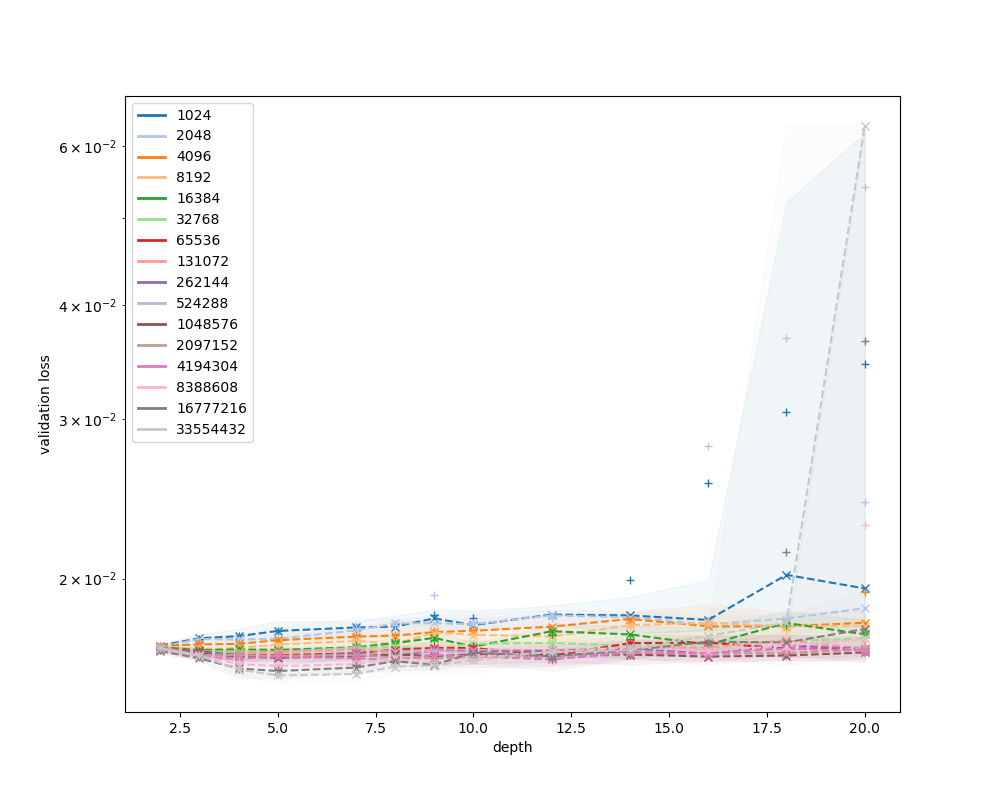

{'config.topology': 'rectangle', 'config.residual_mode': 'full'}


<IPython.core.display.Javascript object>


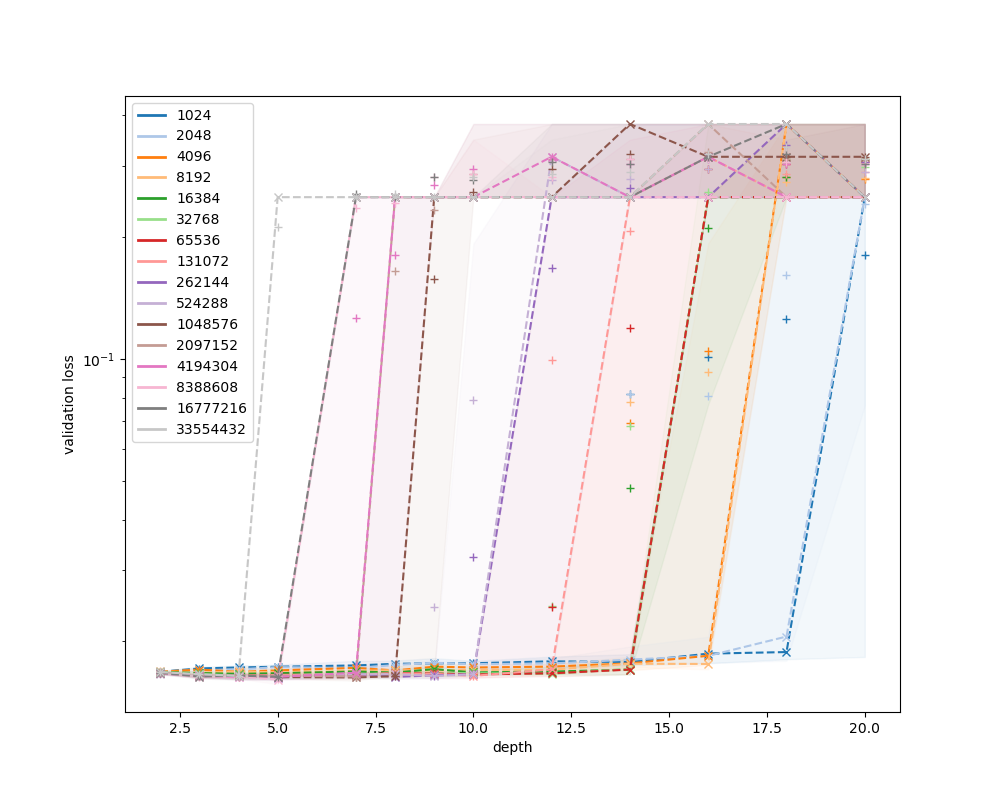

{'config.topology': 'trapezoid', 'config.residual_mode': 'none'}


<IPython.core.display.Javascript object>


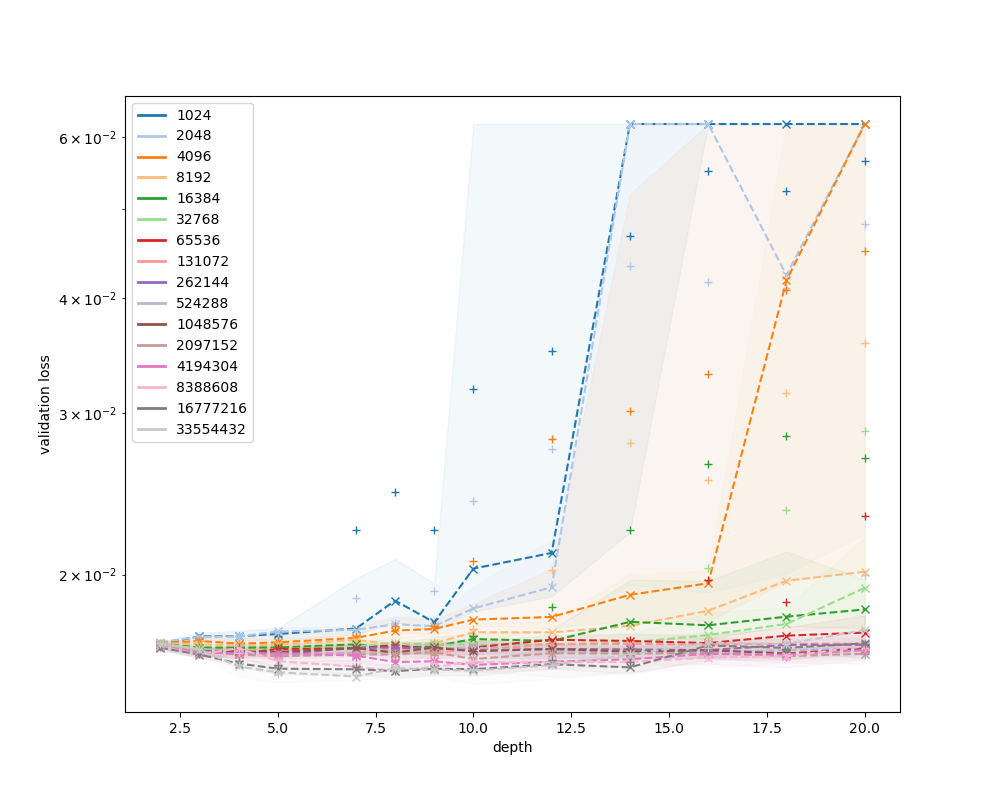

{'config.topology': 'exponential', 'config.residual_mode': 'none'}


<IPython.core.display.Javascript object>


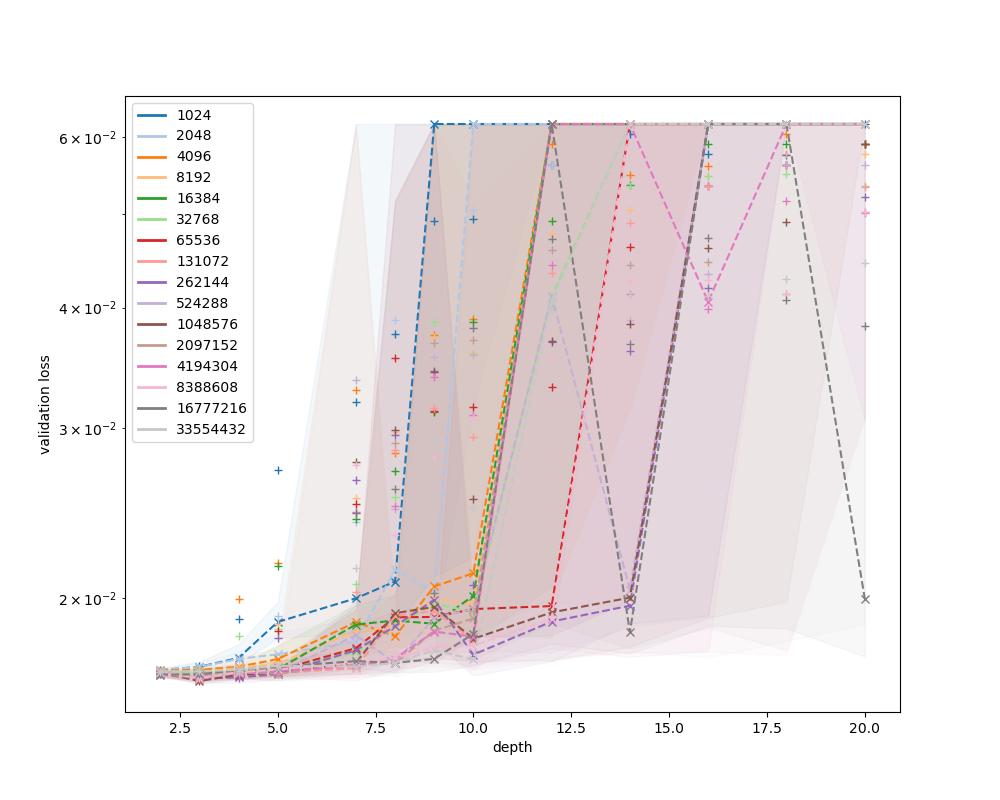

{'config.topology': 'wide_first', 'config.residual_mode': 'none'}


<IPython.core.display.Javascript object>


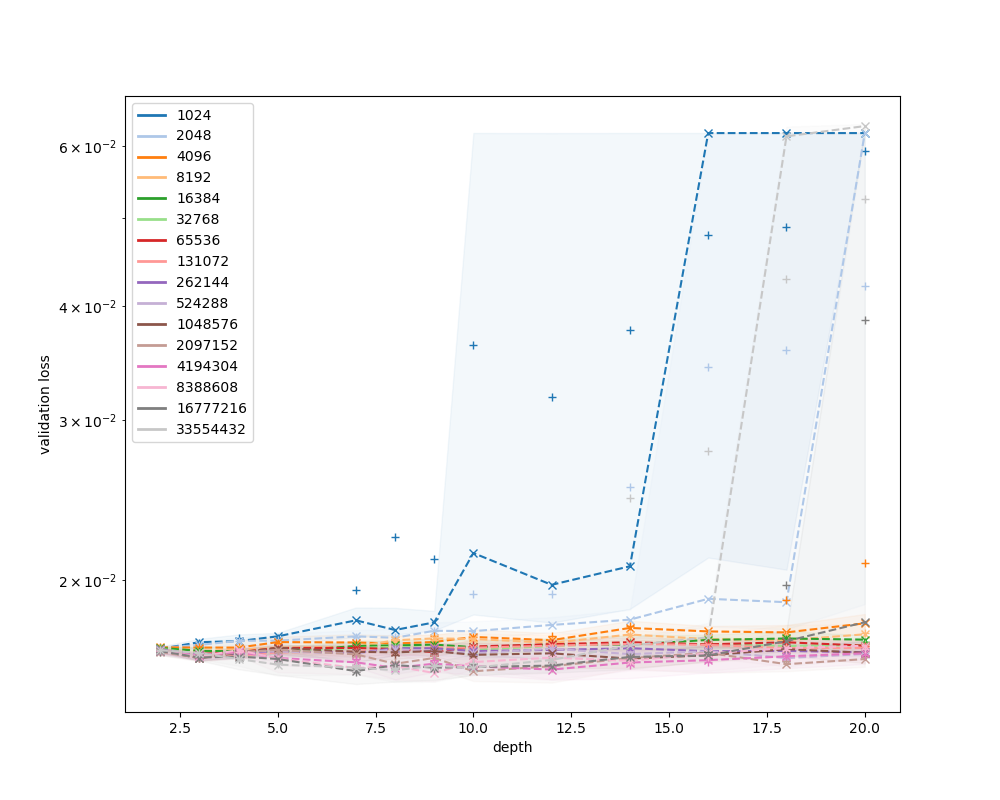

{'config.topology': 'wide_first', 'config.residual_mode': 'full'}


<IPython.core.display.Javascript object>


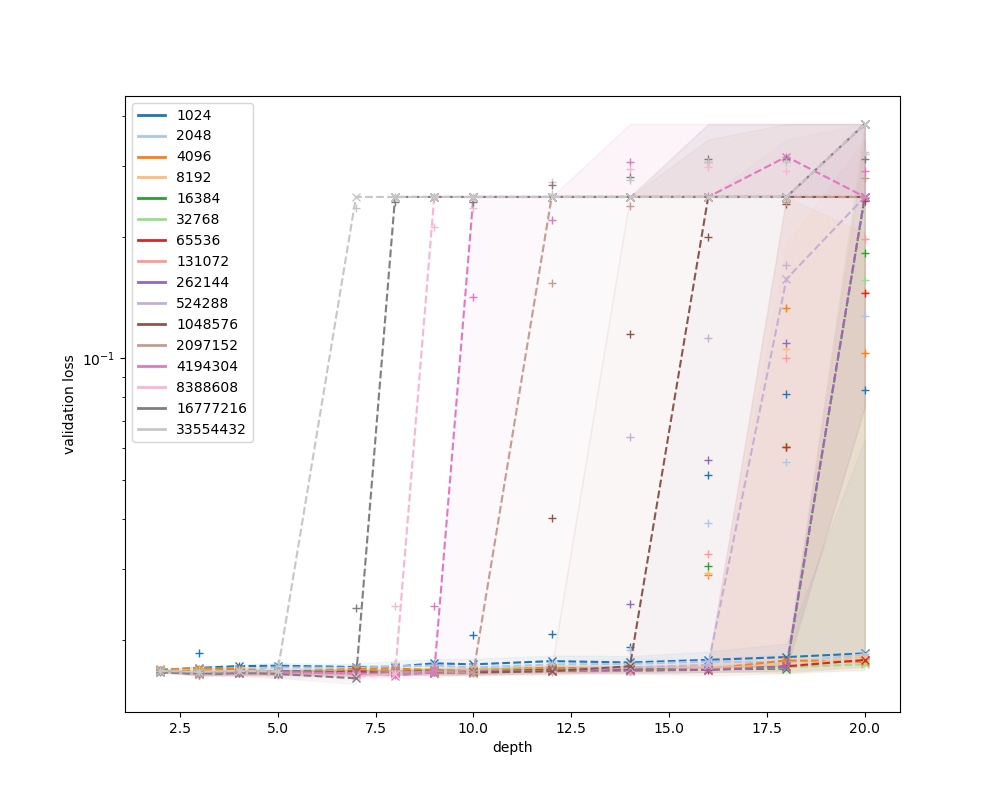

In [130]:
plot_for_each(datasets[datasets['config.dataset'] == '537_houses'], ['config.topology', 'config.residual_mode'], ['config.budget'], {})

{'config.budget': 1024}


<IPython.core.display.Javascript object>


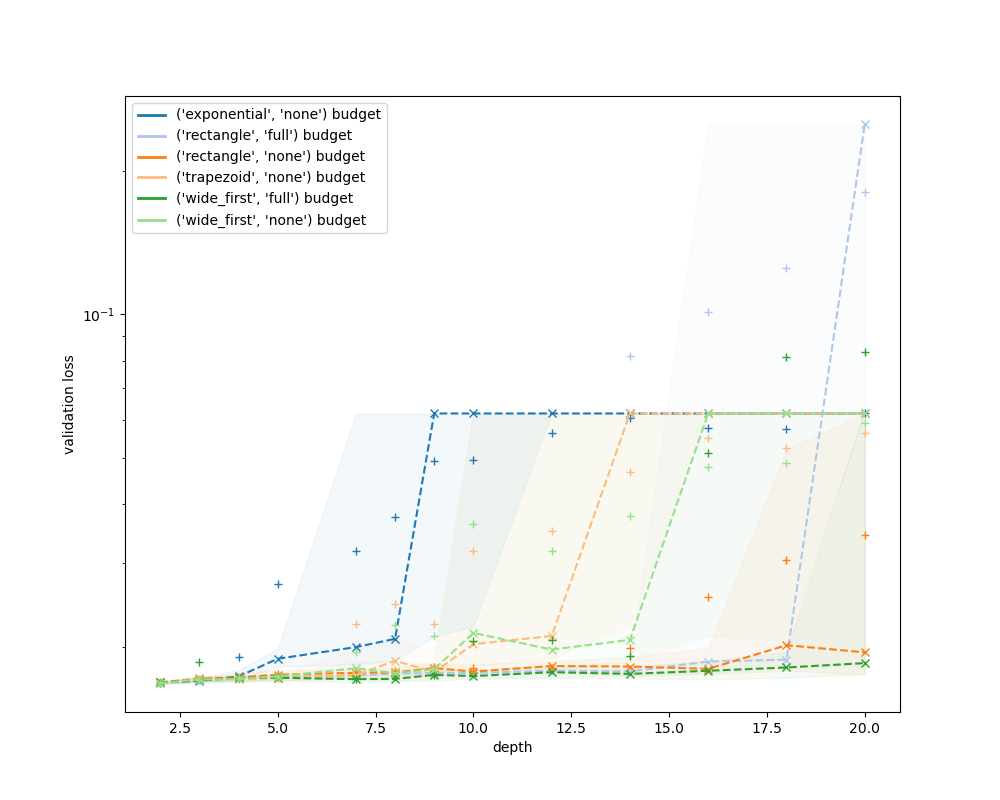

<IPython.core.display.Javascript object>


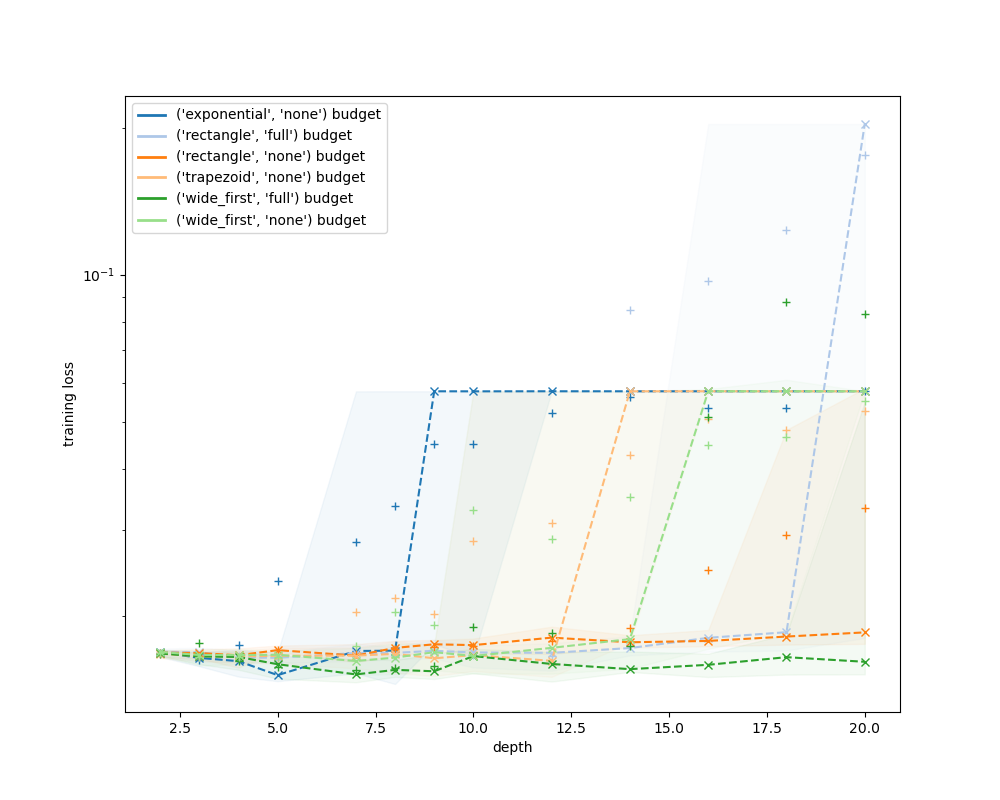

<IPython.core.display.Javascript object>


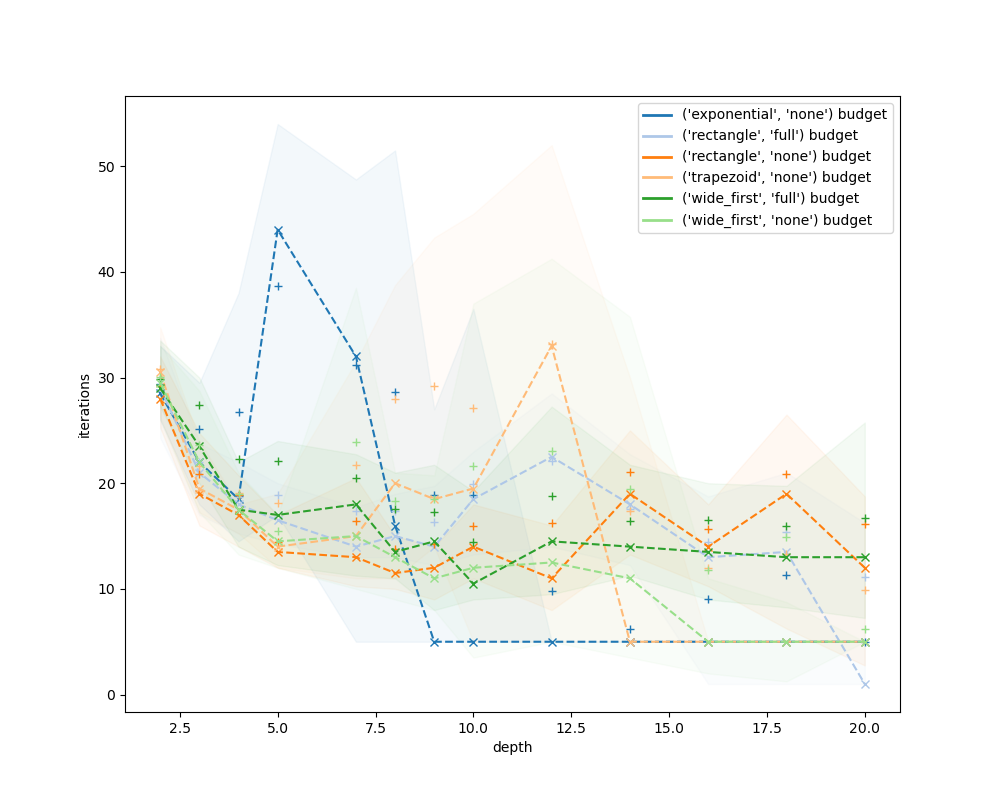

<IPython.core.display.Javascript object>


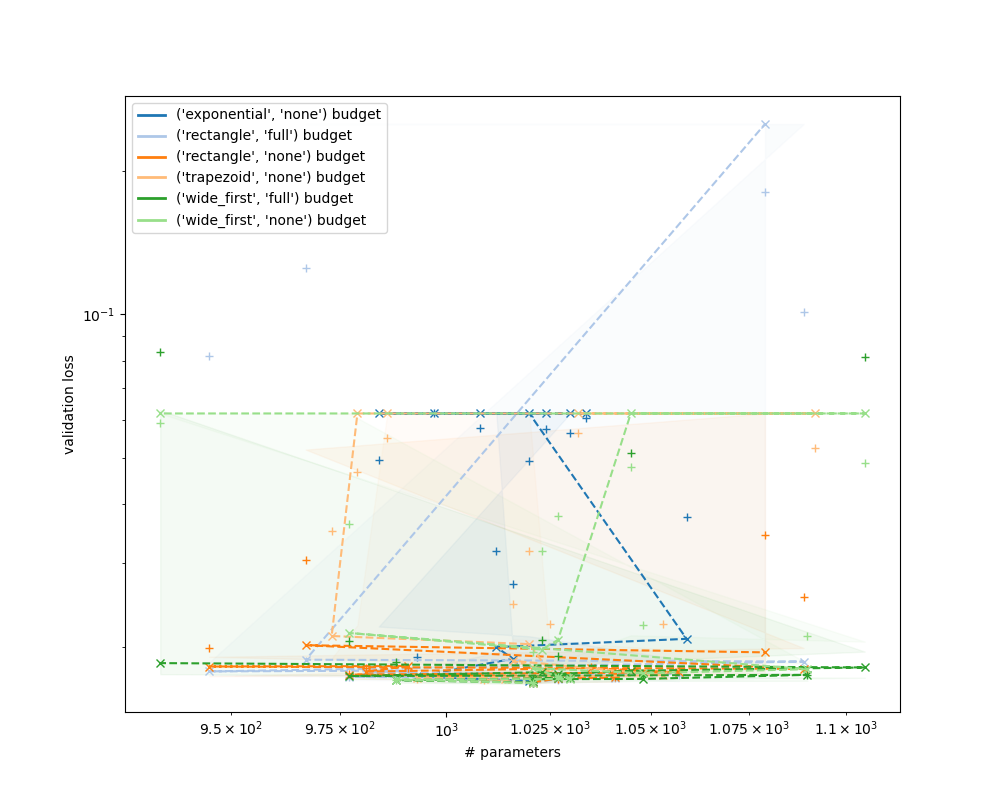

{'config.budget': 2048}


<ipython-input-121-8f9cbb7ea0f1>:36: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = pyplot.figure()


<IPython.core.display.Javascript object>


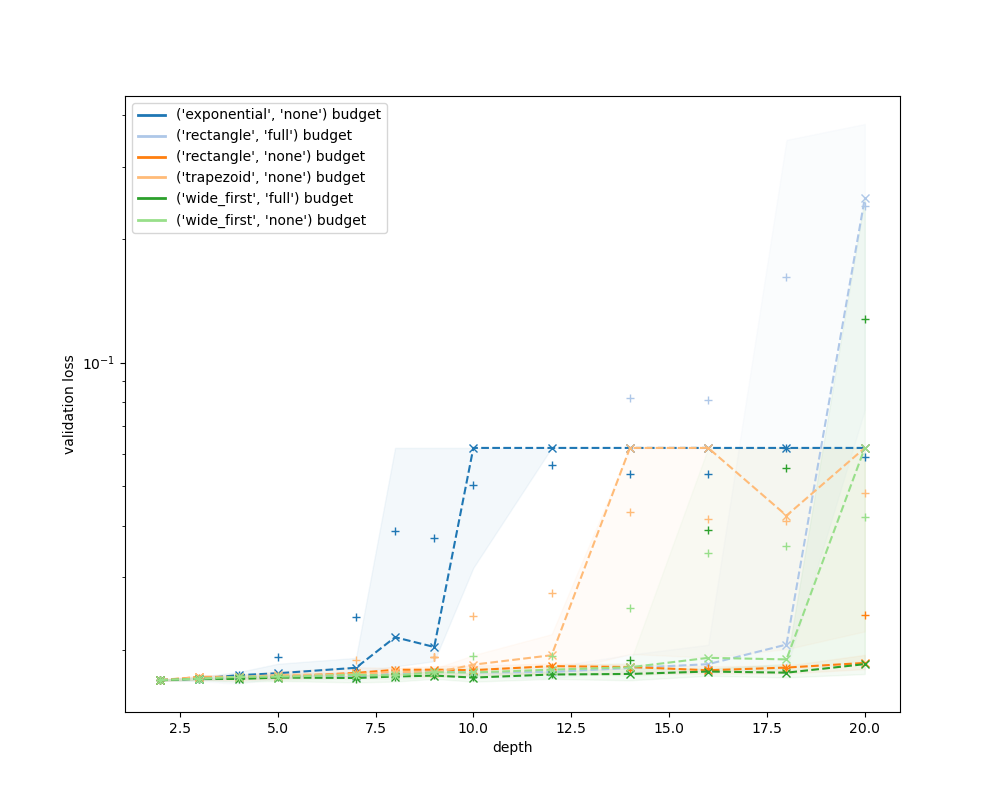

<IPython.core.display.Javascript object>


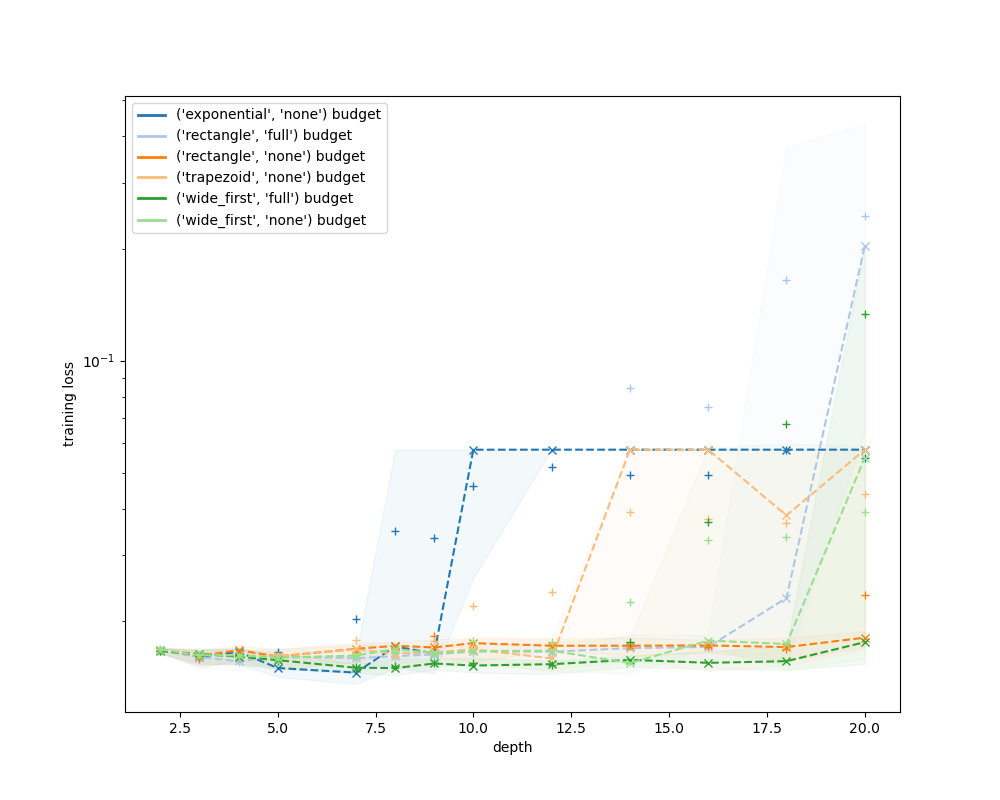

<IPython.core.display.Javascript object>


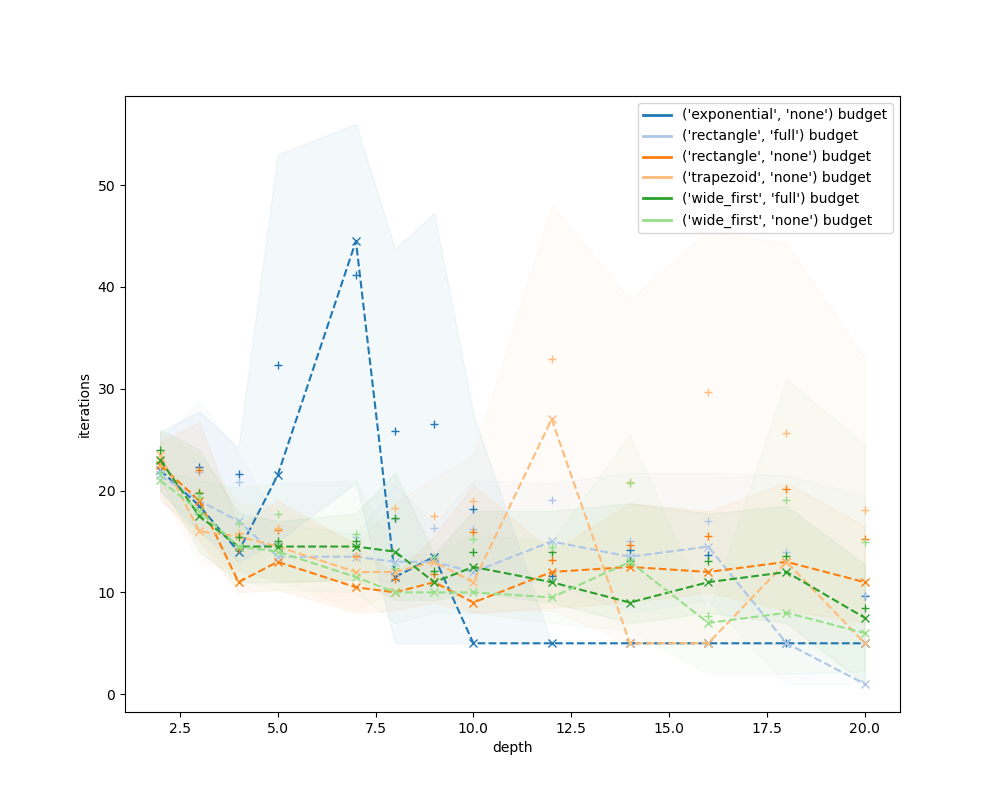

<IPython.core.display.Javascript object>


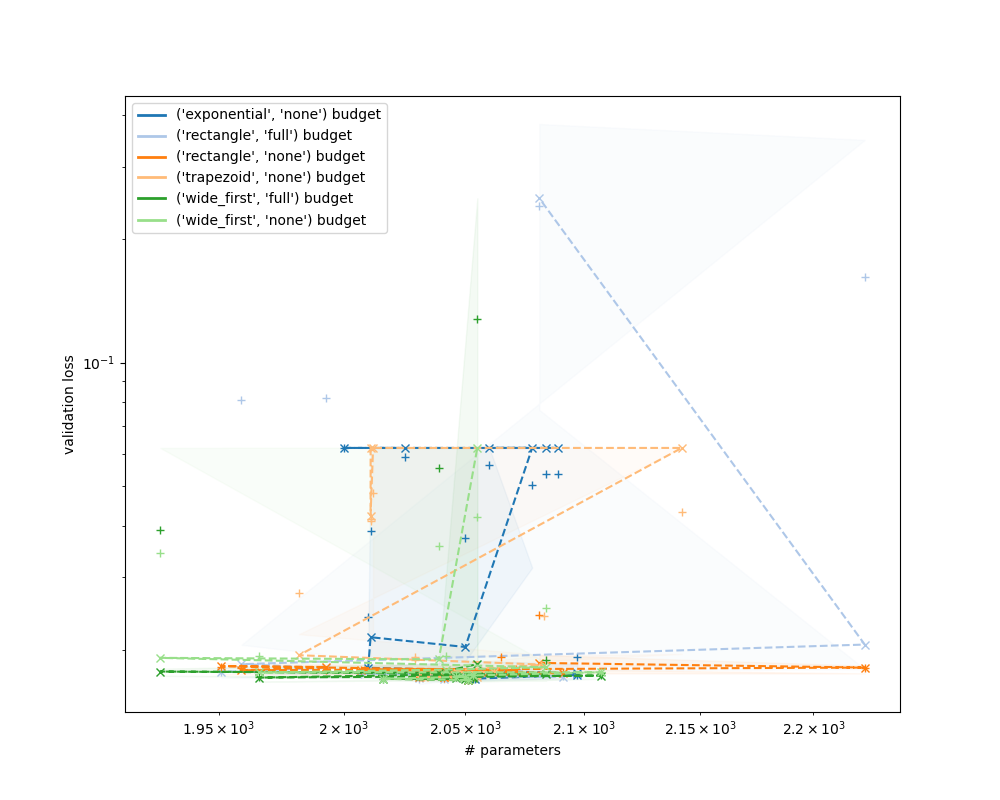

{'config.budget': 4096}


<IPython.core.display.Javascript object>


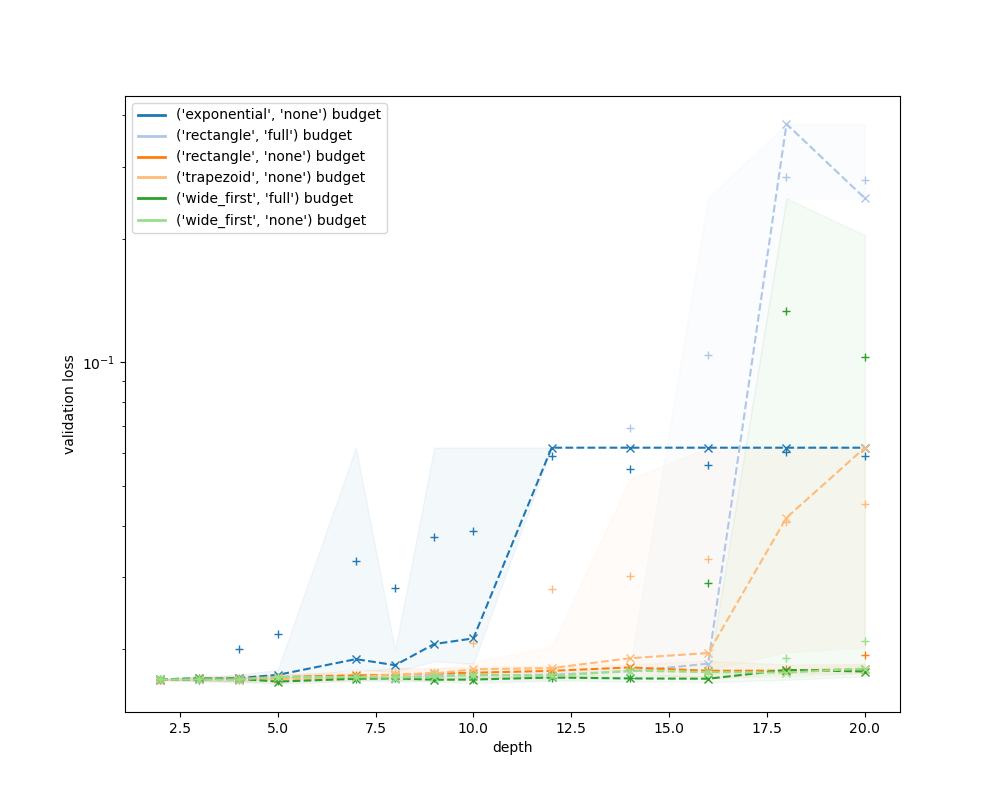

<IPython.core.display.Javascript object>


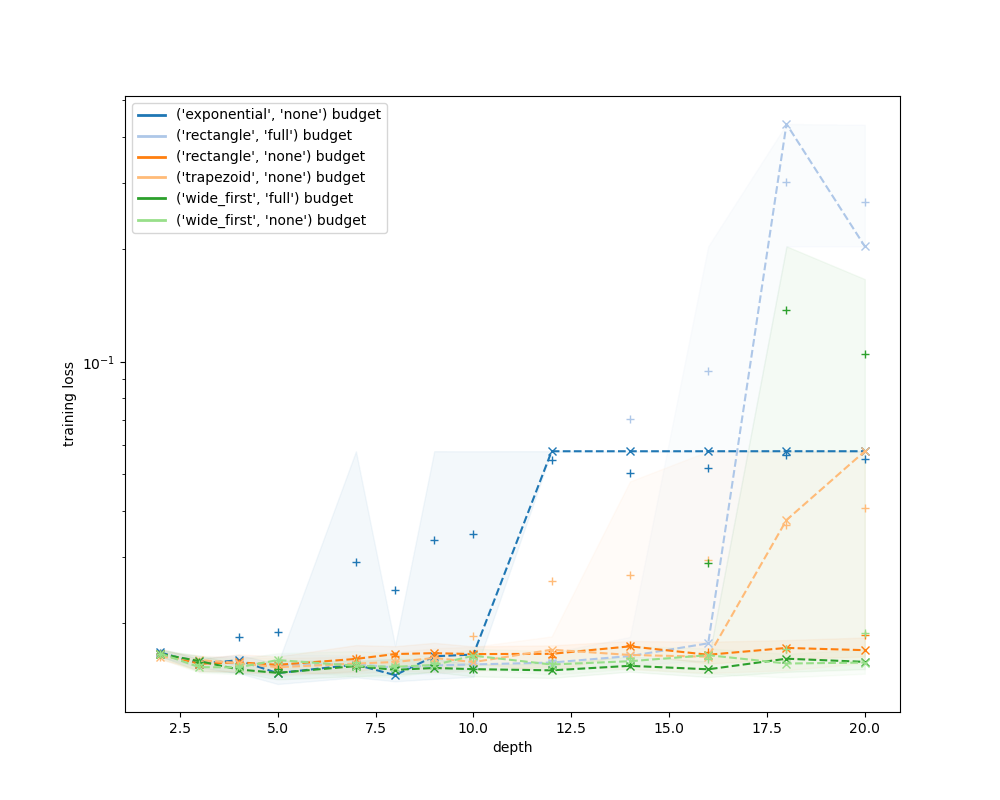

<IPython.core.display.Javascript object>


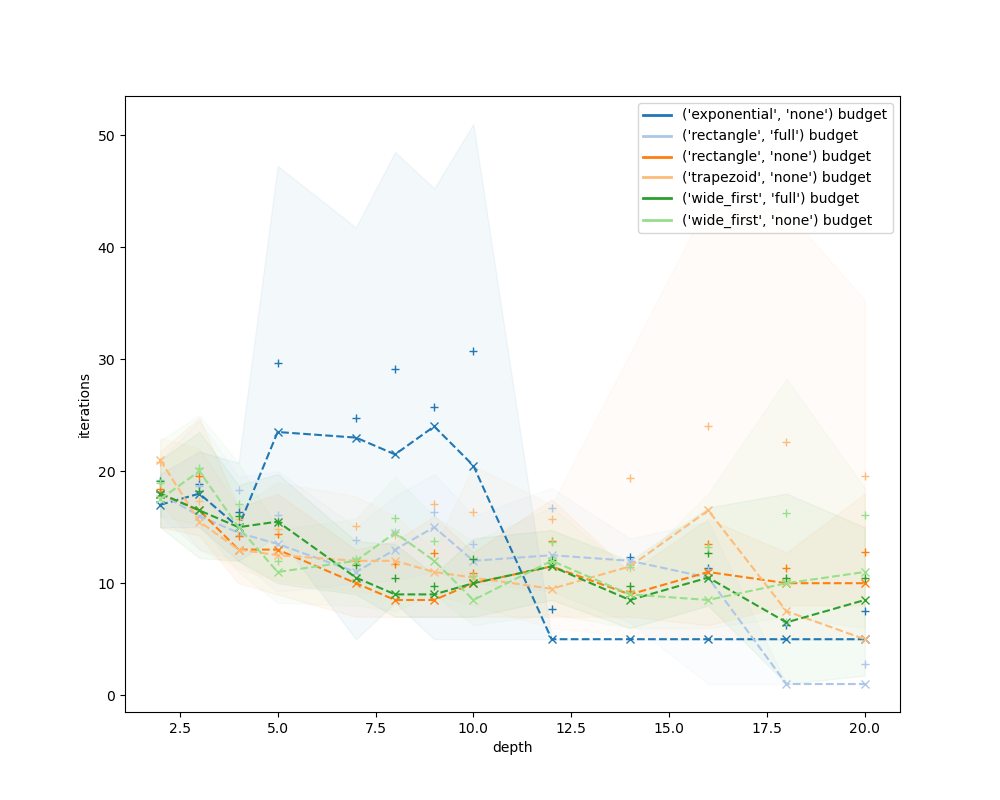

<IPython.core.display.Javascript object>


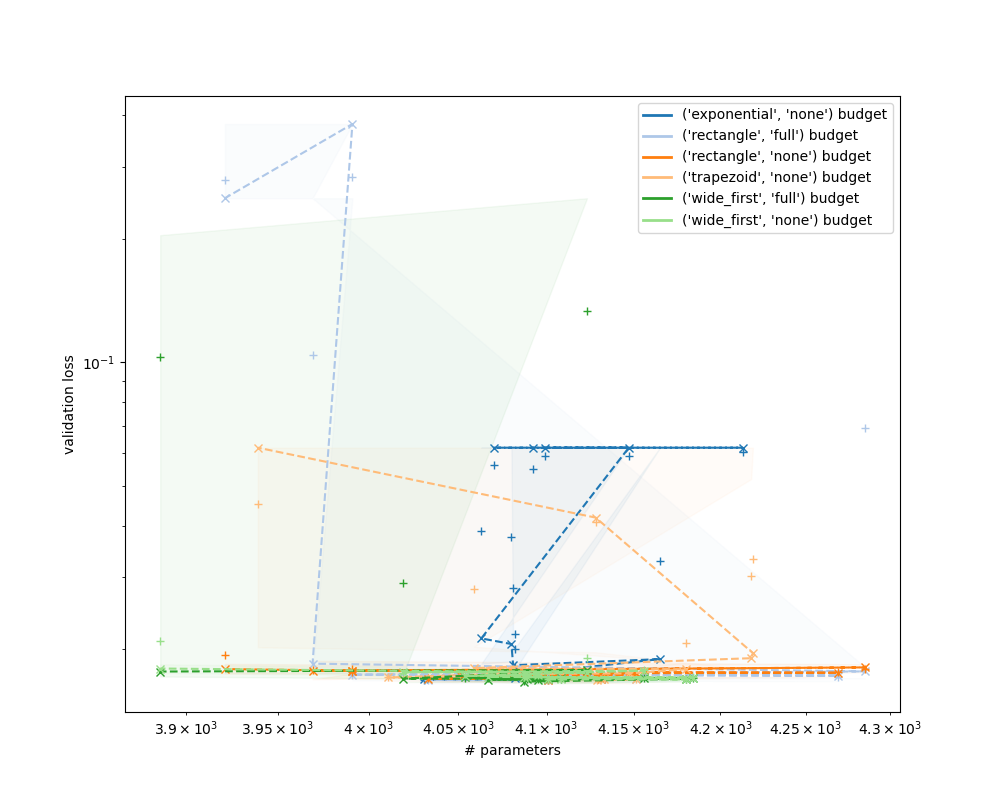

{'config.budget': 8192}


<IPython.core.display.Javascript object>


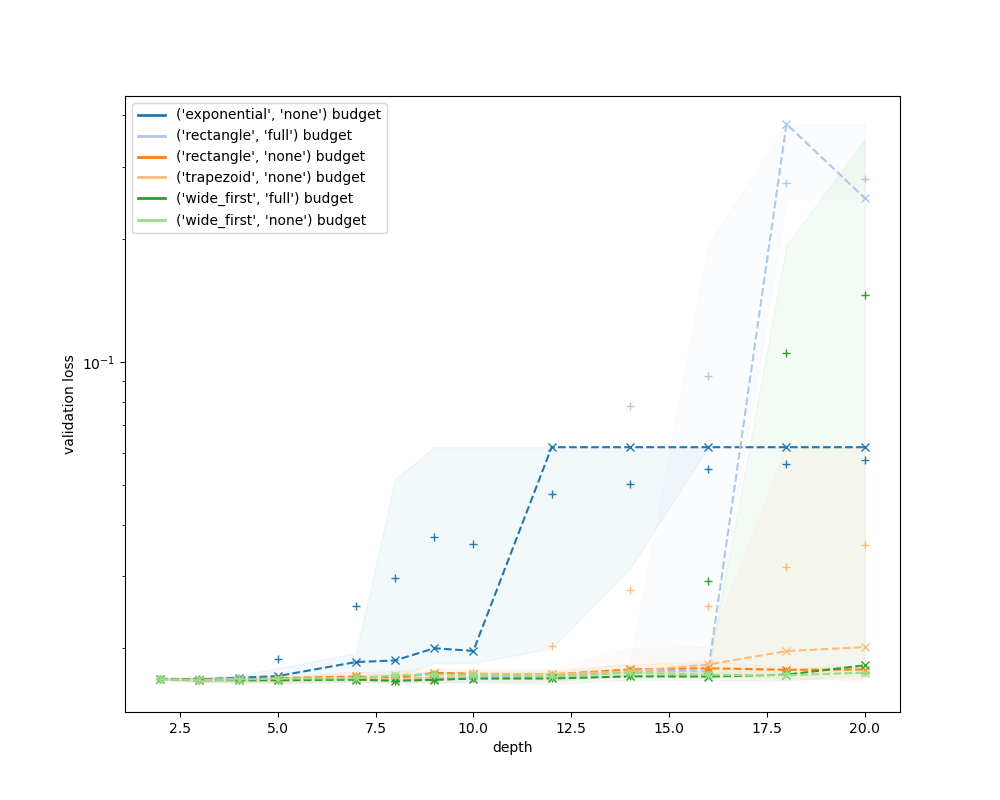

<IPython.core.display.Javascript object>


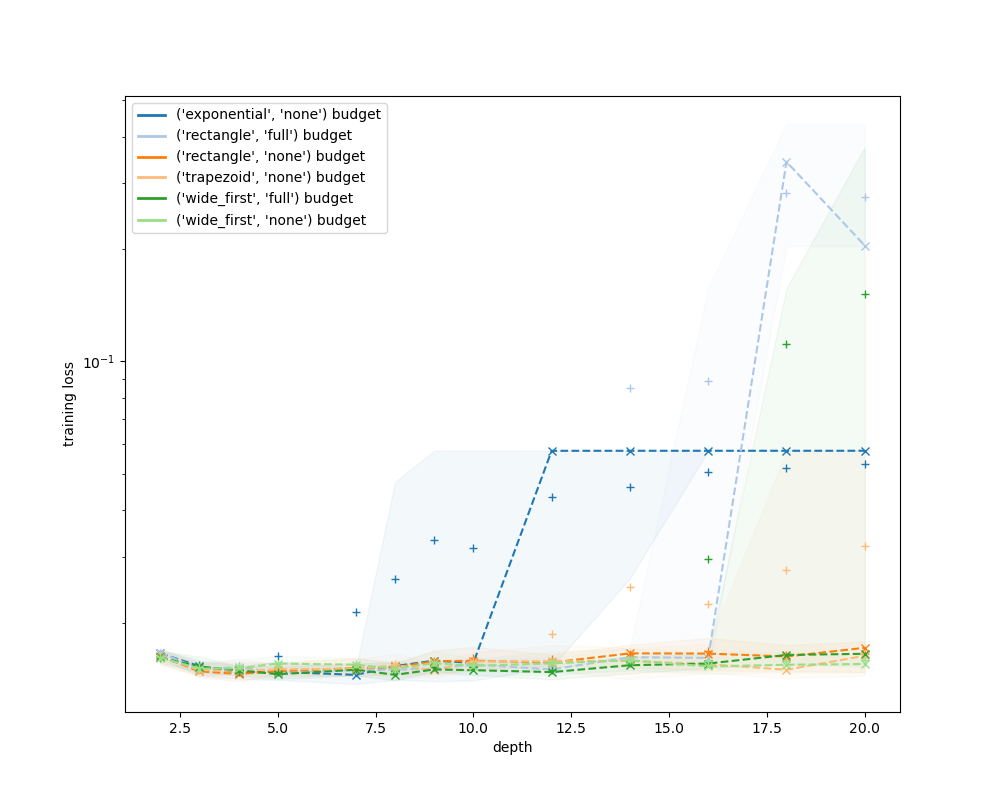

<IPython.core.display.Javascript object>


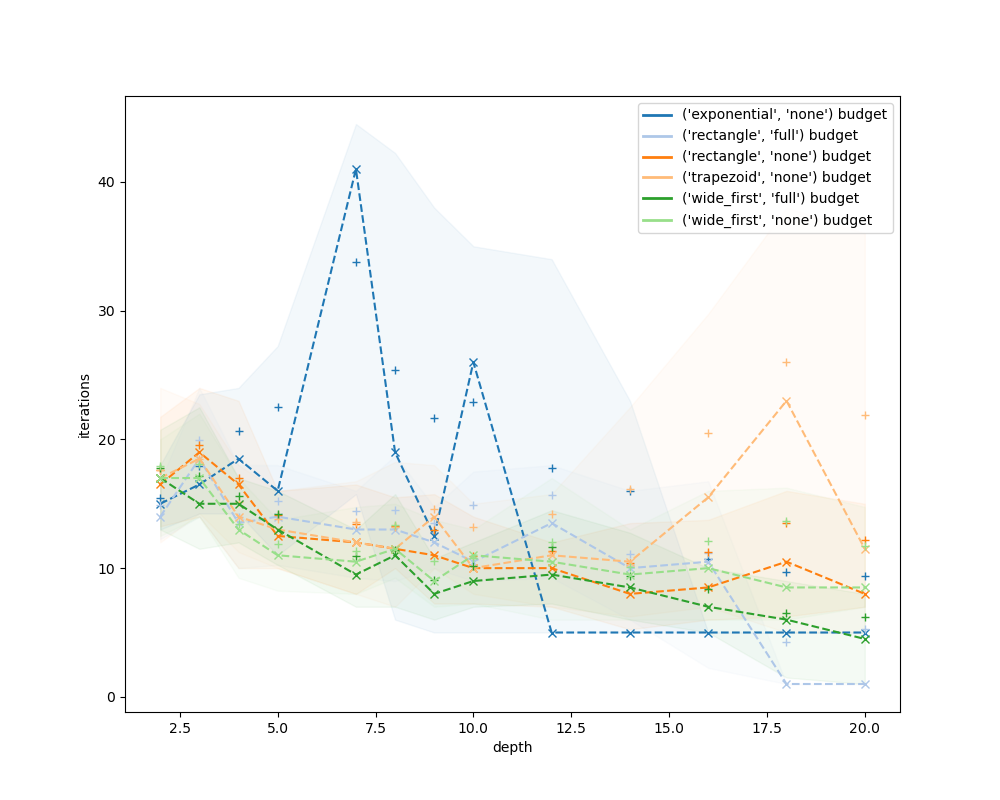

<IPython.core.display.Javascript object>


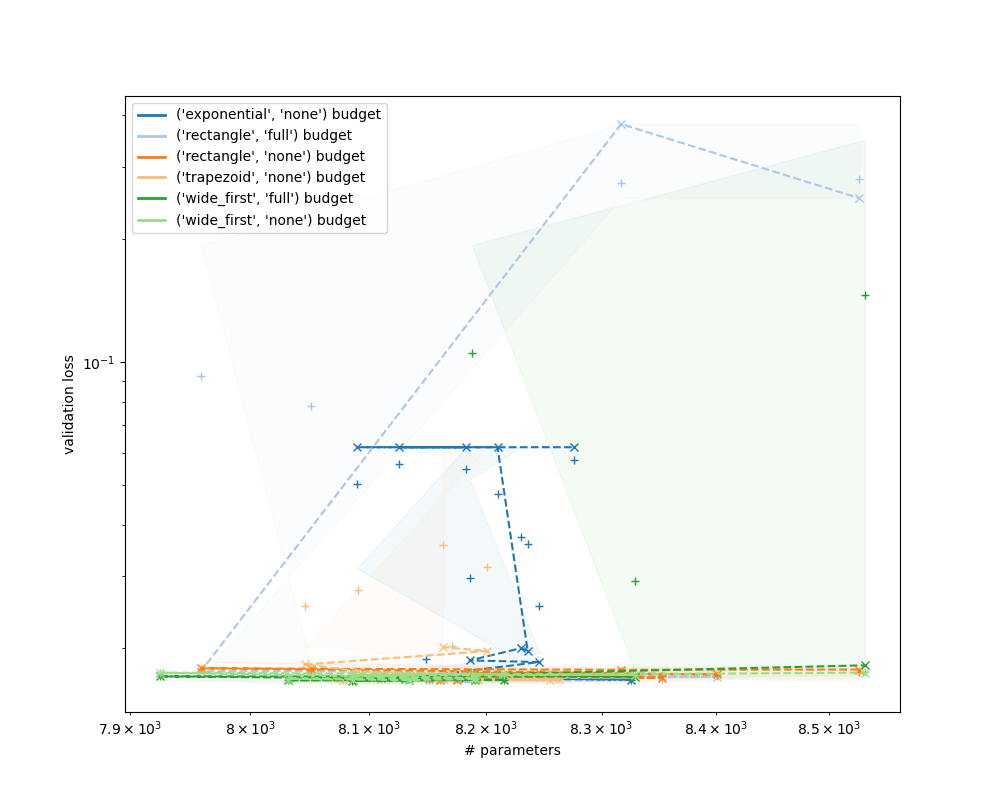

{'config.budget': 16384}


<IPython.core.display.Javascript object>


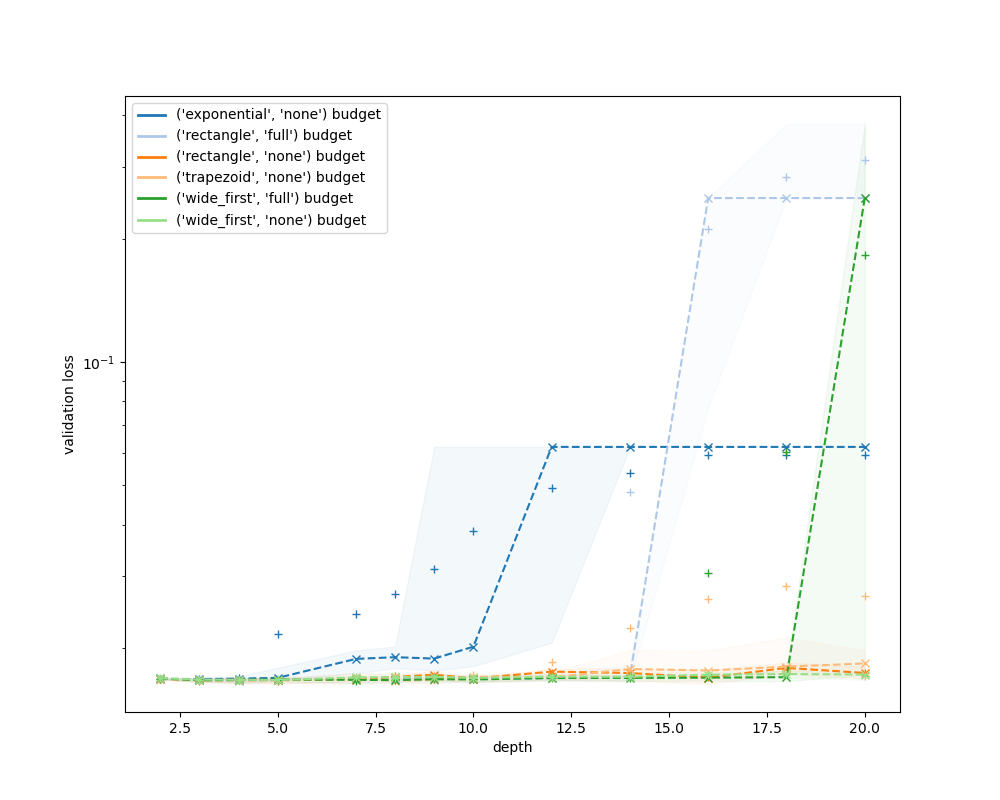

<IPython.core.display.Javascript object>


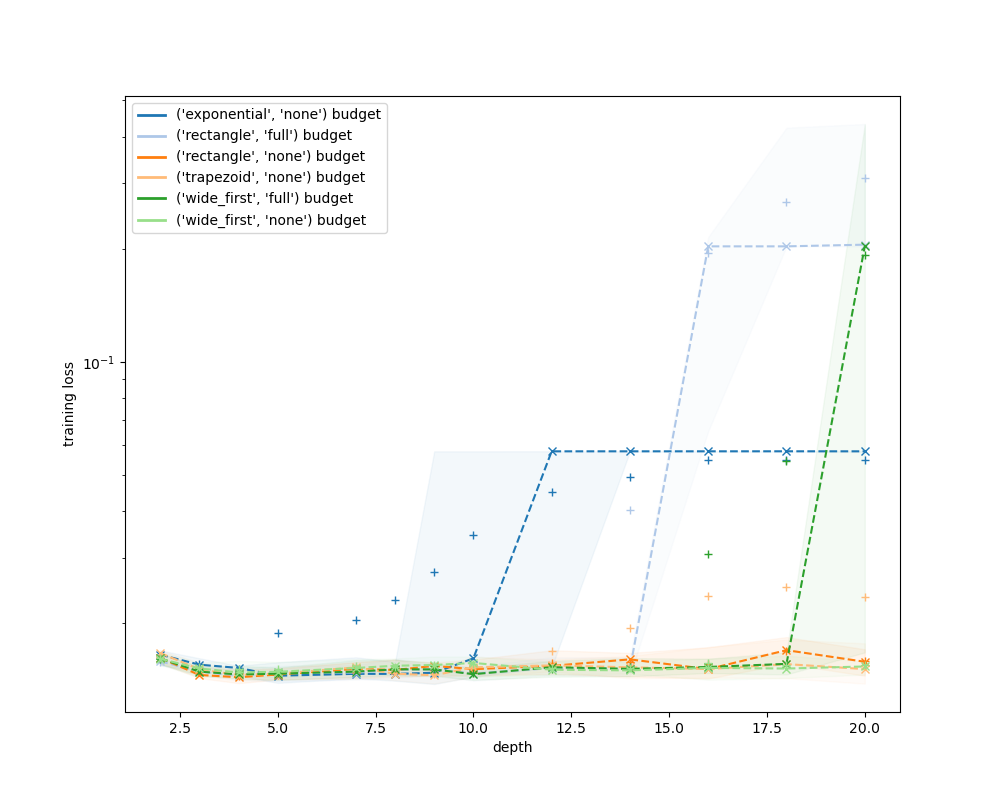

<IPython.core.display.Javascript object>


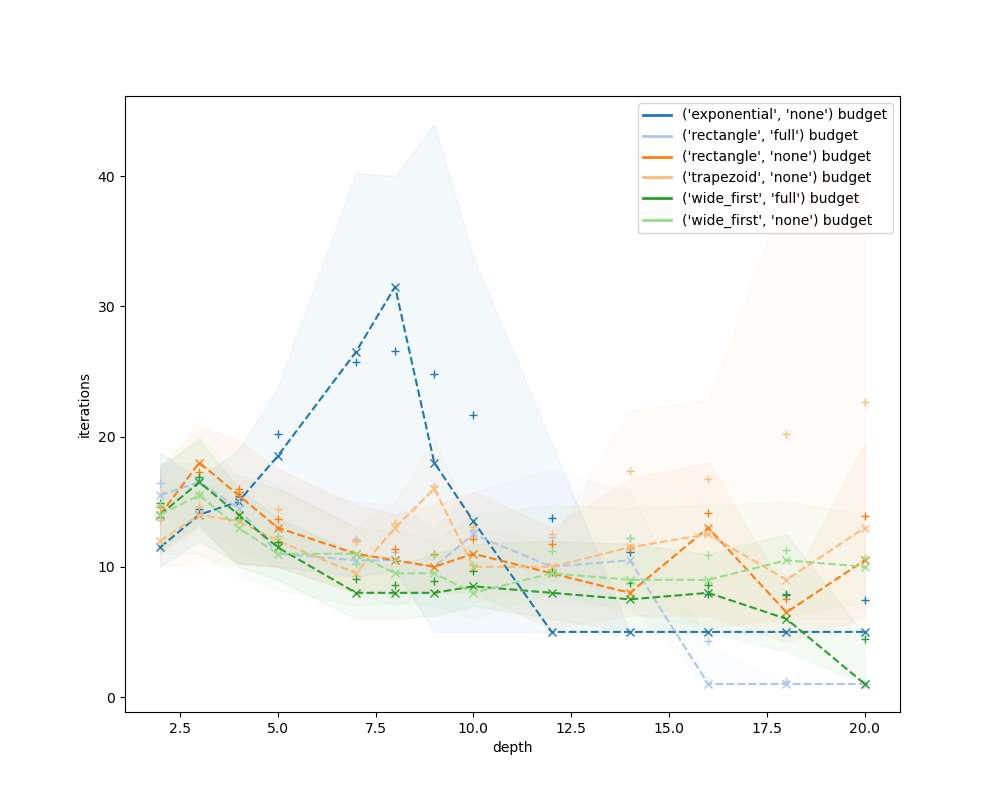

<IPython.core.display.Javascript object>


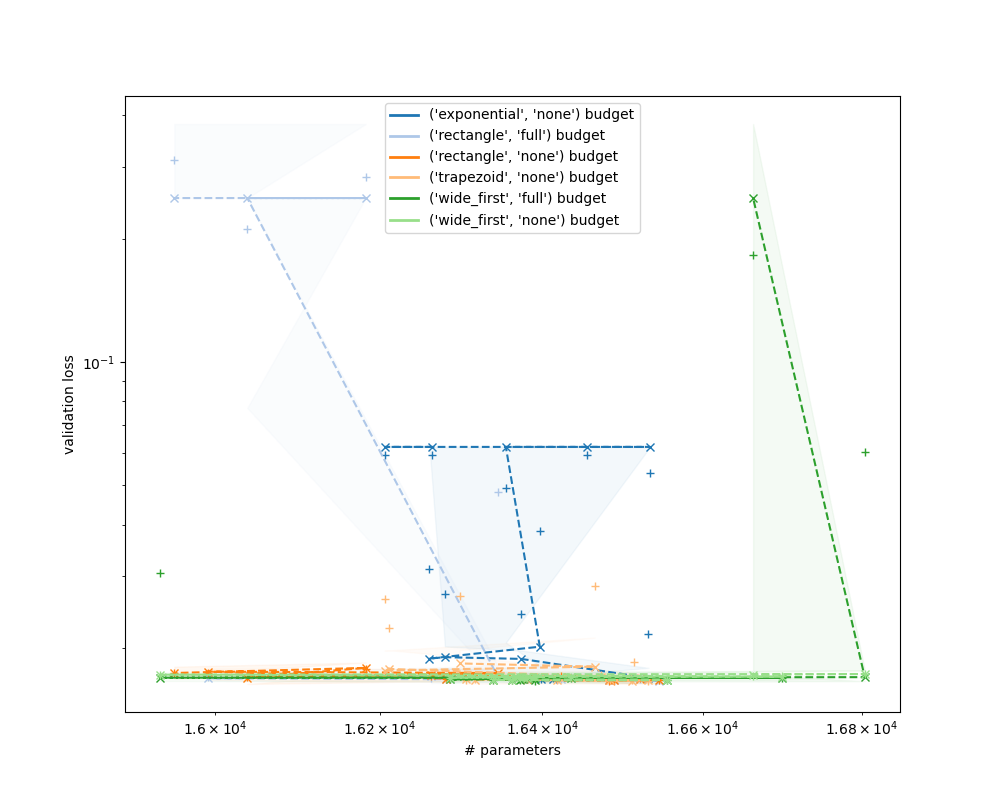

{'config.budget': 32768}


<IPython.core.display.Javascript object>


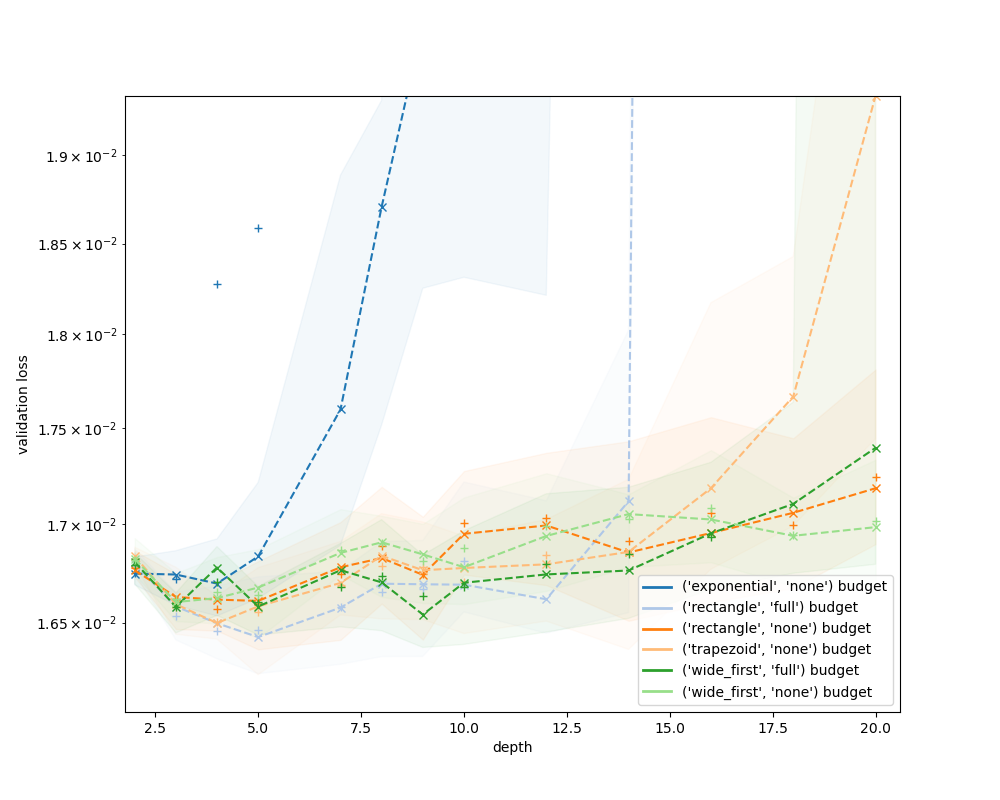

<IPython.core.display.Javascript object>


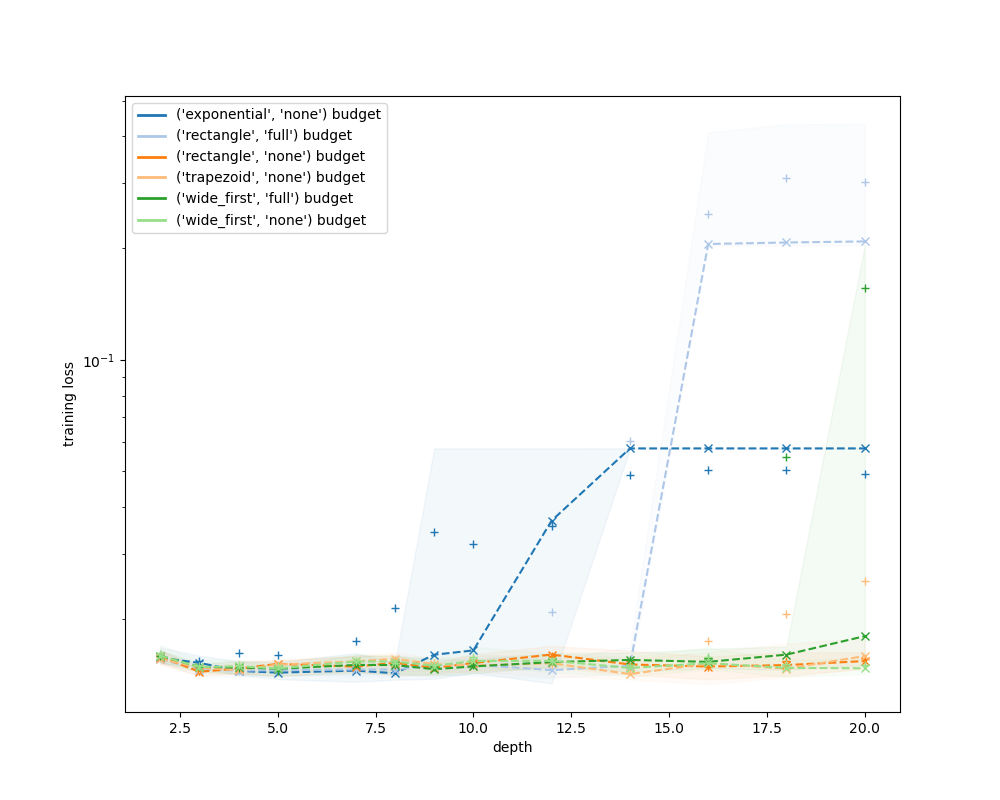

<IPython.core.display.Javascript object>


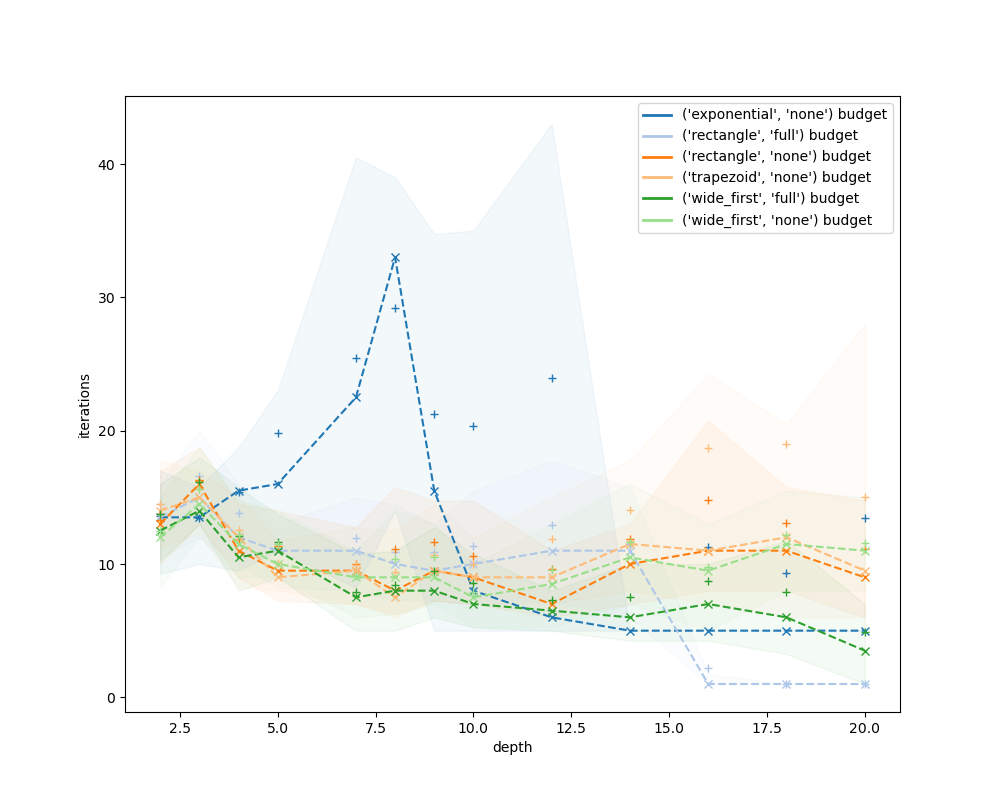

<IPython.core.display.Javascript object>


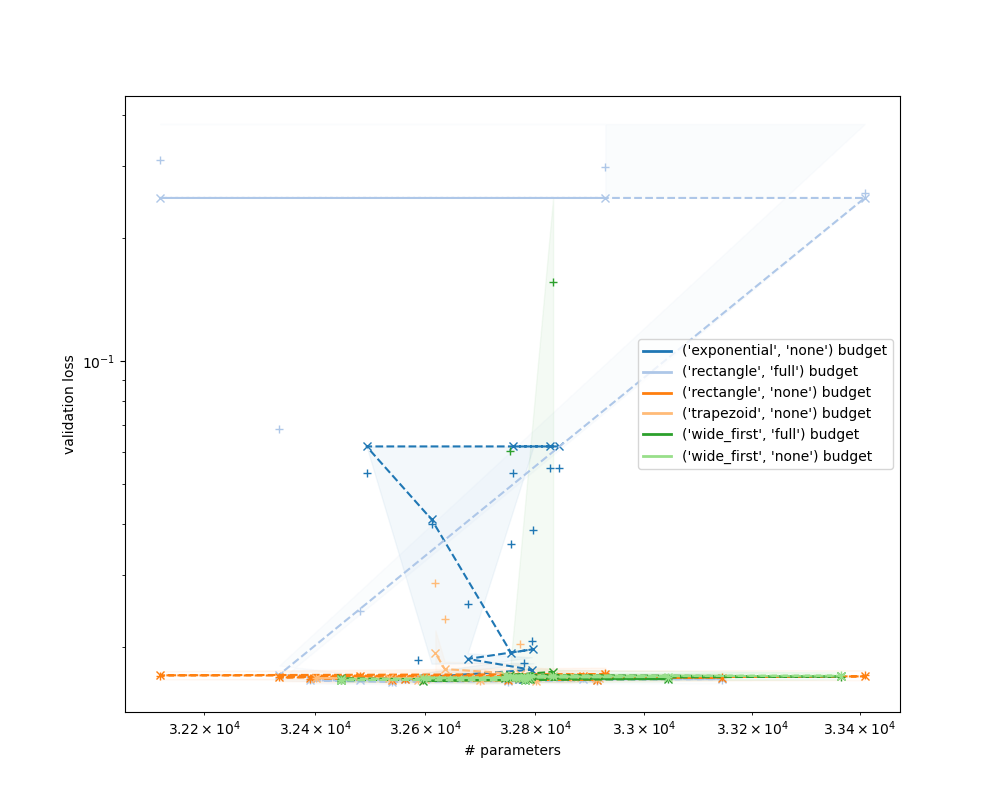

{'config.budget': 65536}


<IPython.core.display.Javascript object>


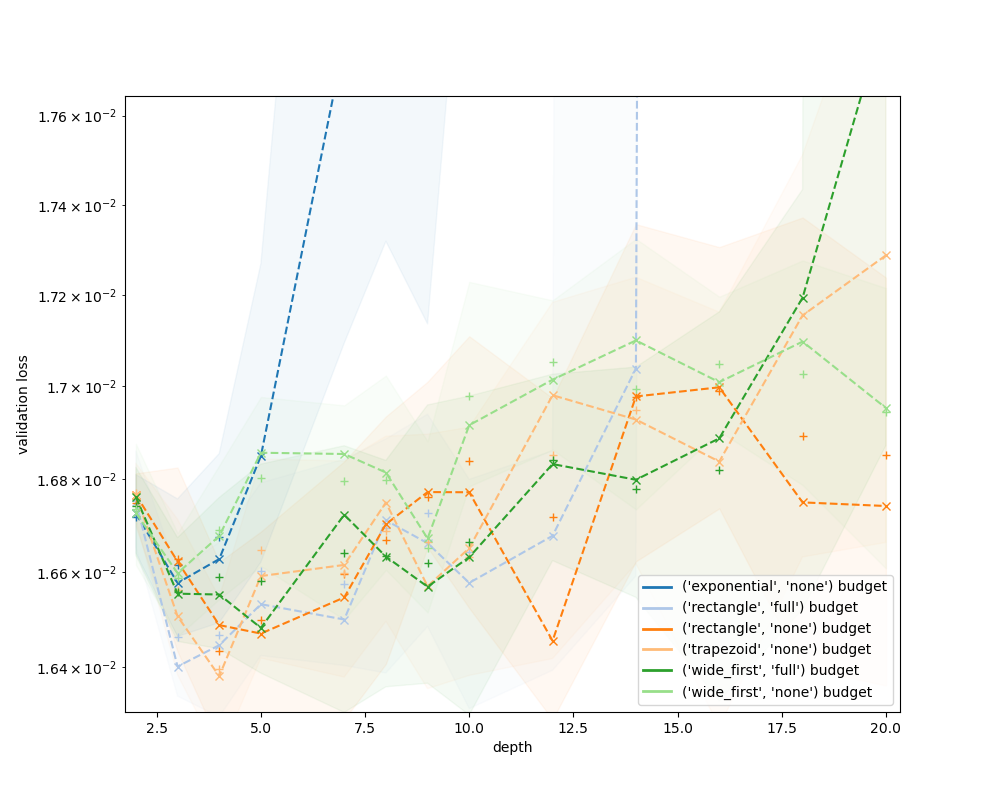

<IPython.core.display.Javascript object>


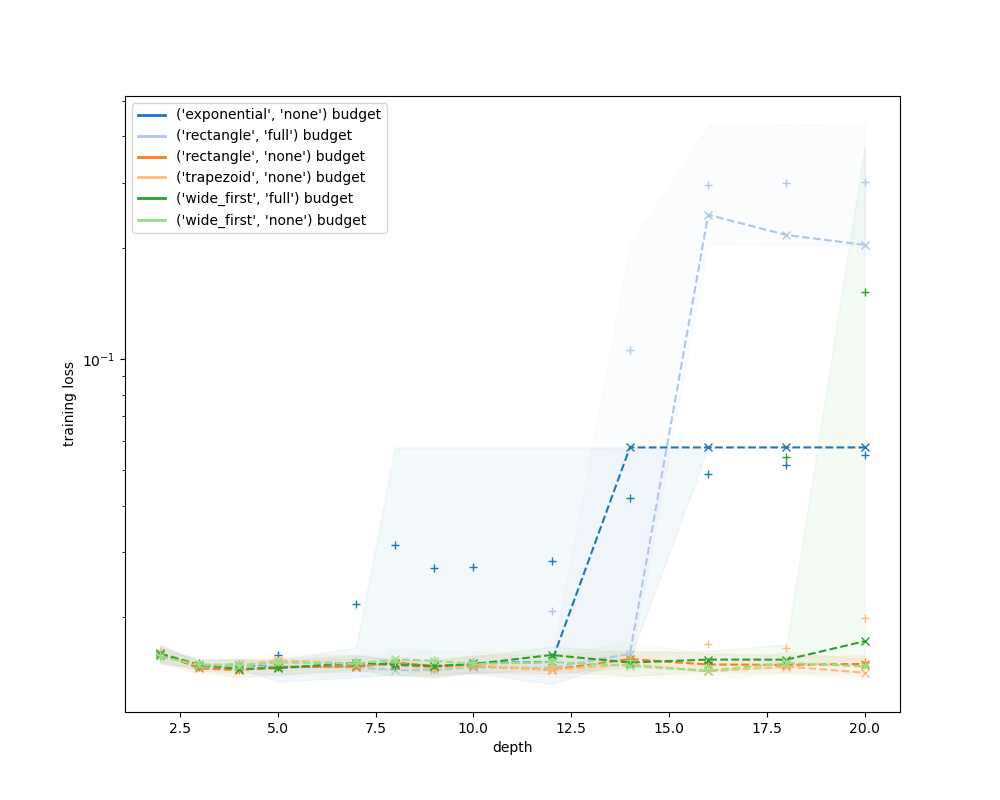

<IPython.core.display.Javascript object>


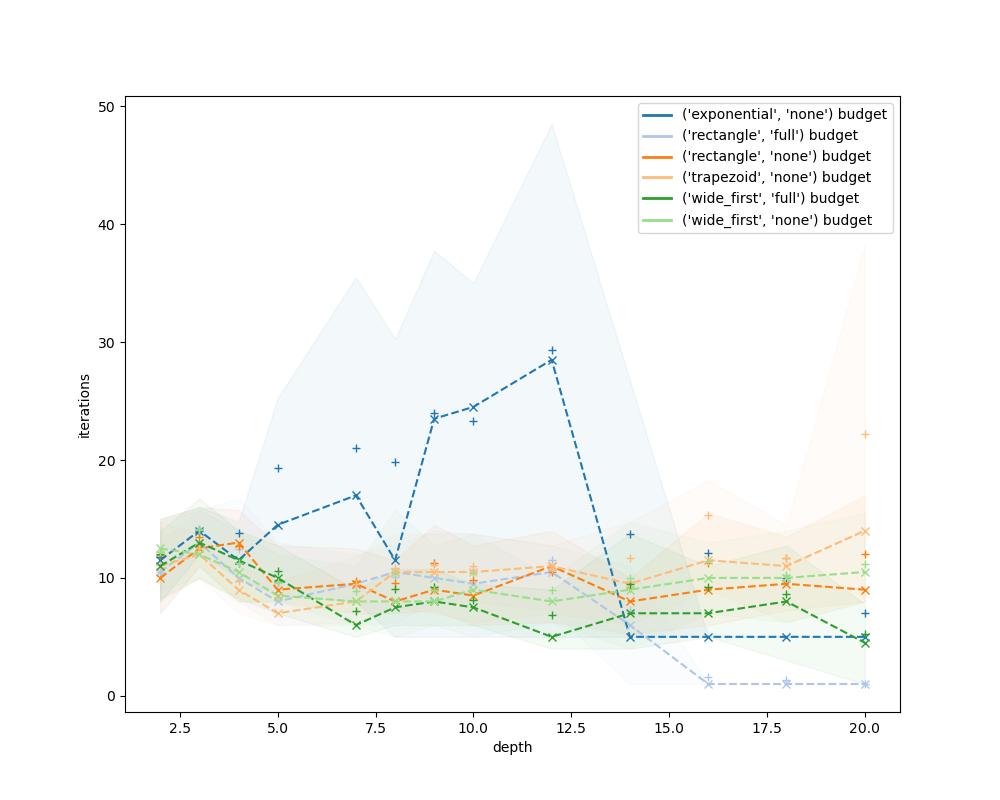

<IPython.core.display.Javascript object>


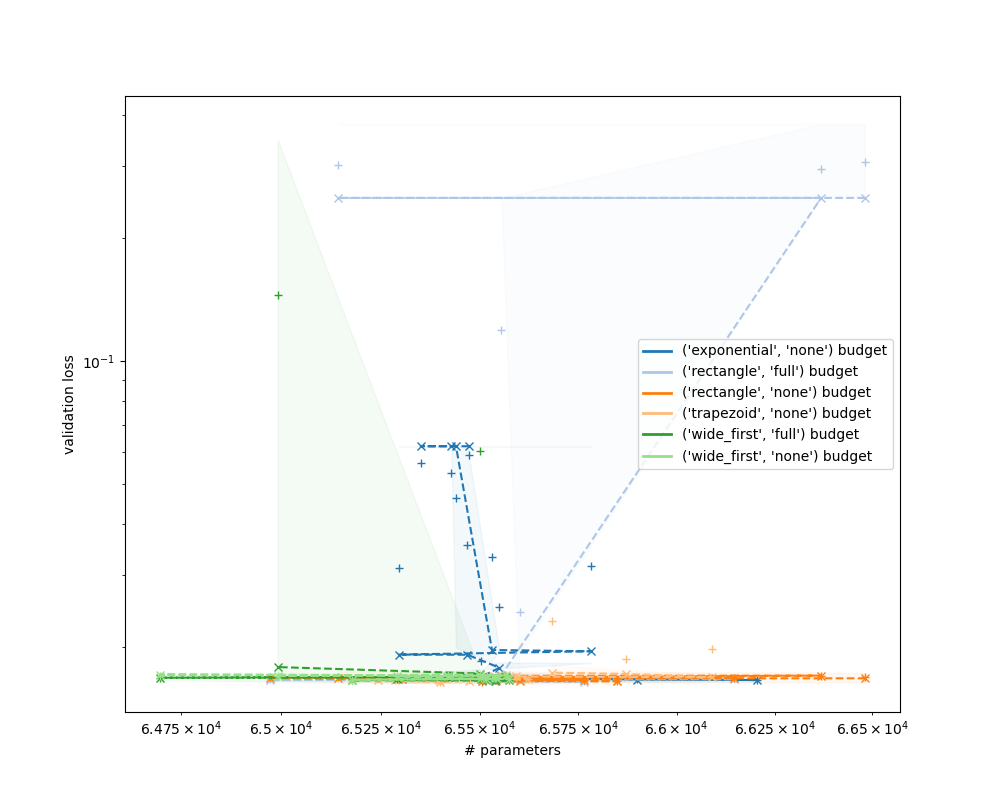

{'config.budget': 131072}


<IPython.core.display.Javascript object>


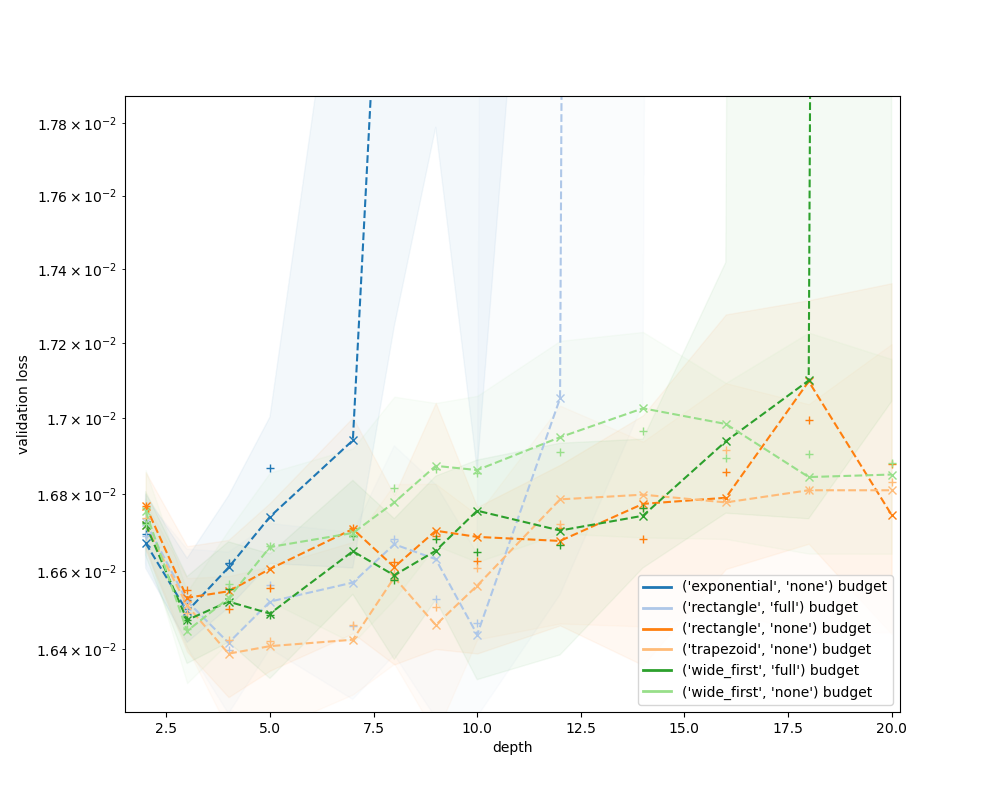

<IPython.core.display.Javascript object>


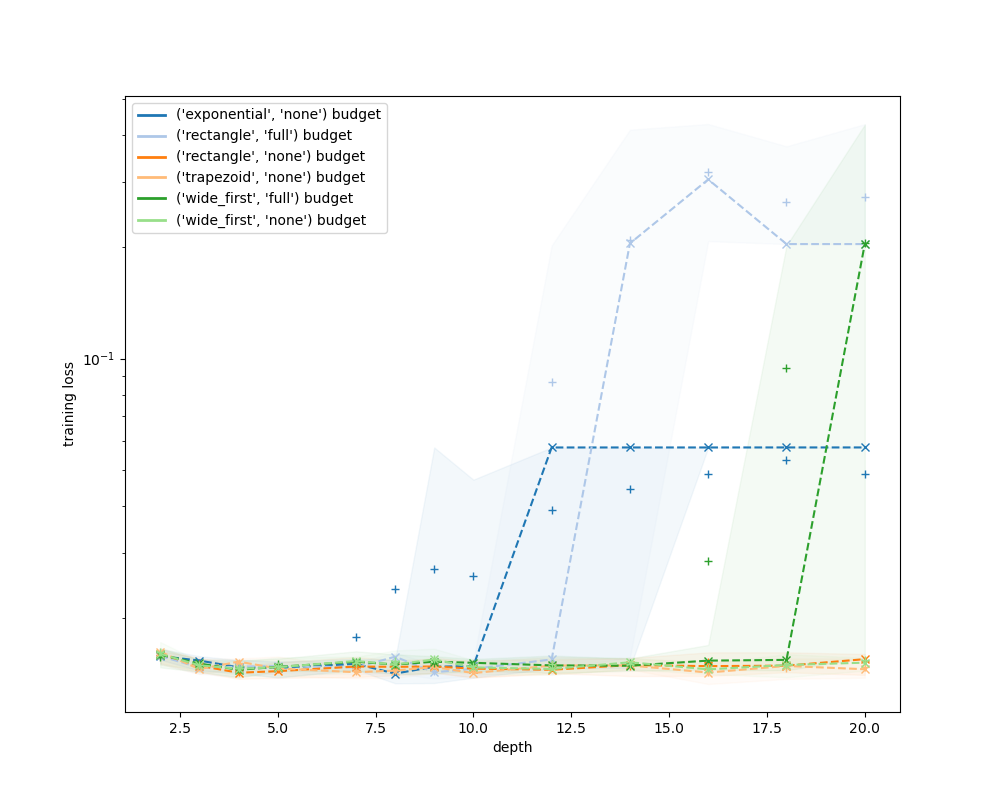

<IPython.core.display.Javascript object>


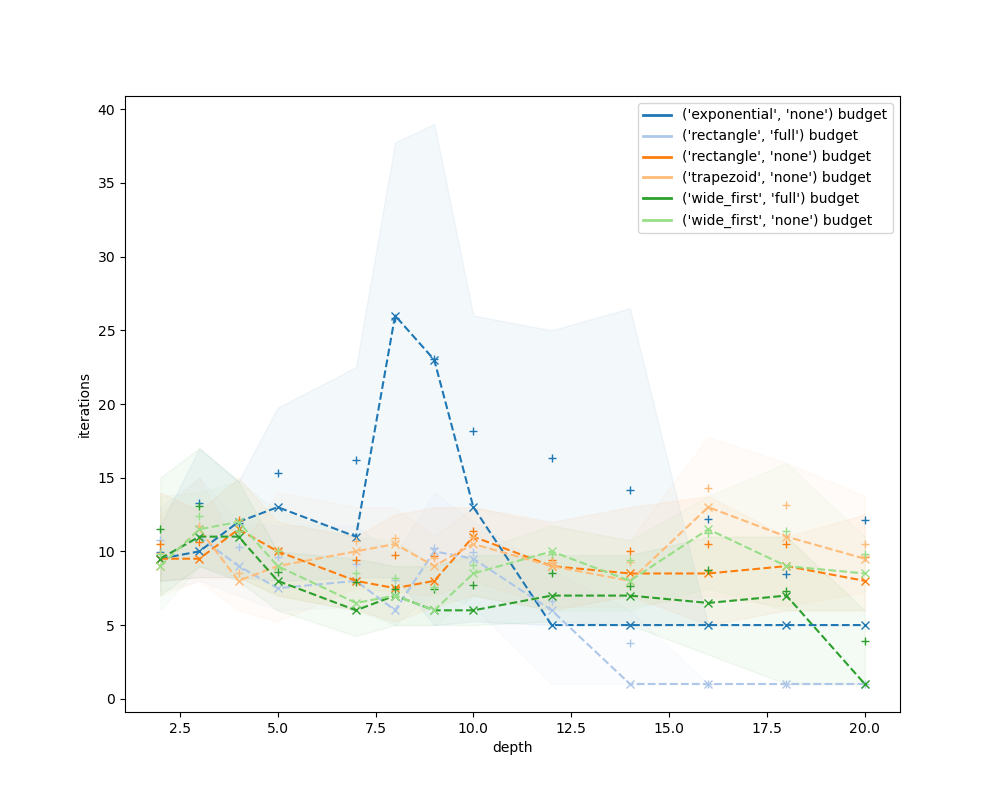

<IPython.core.display.Javascript object>


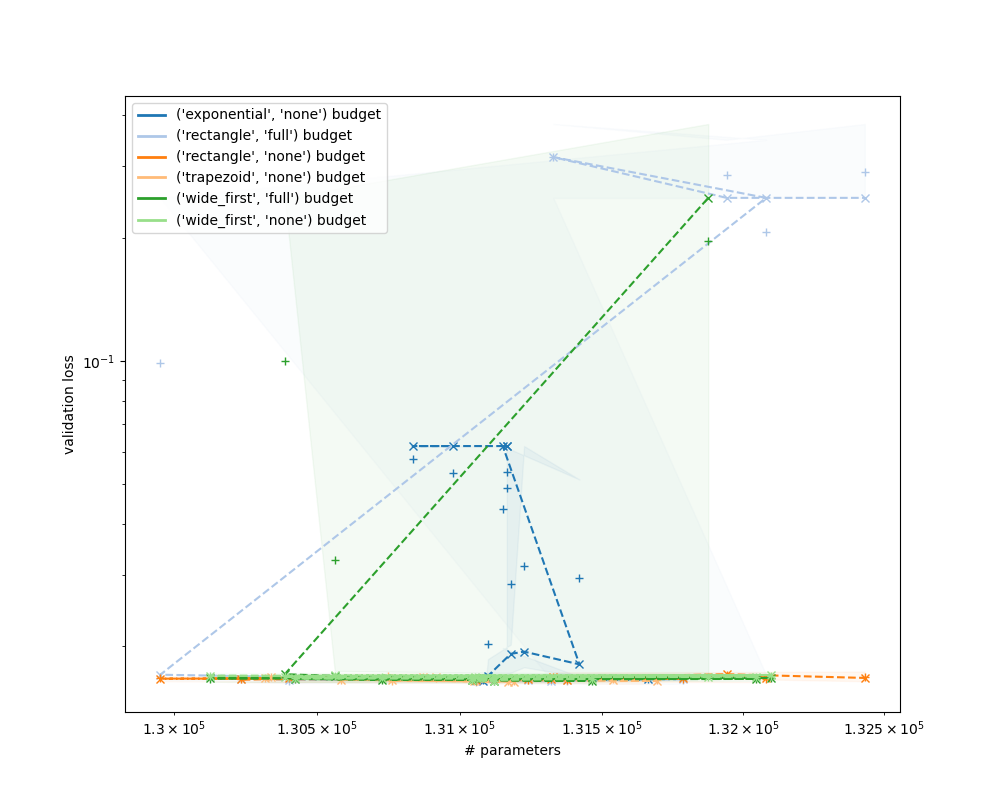

{'config.budget': 262144}


<IPython.core.display.Javascript object>


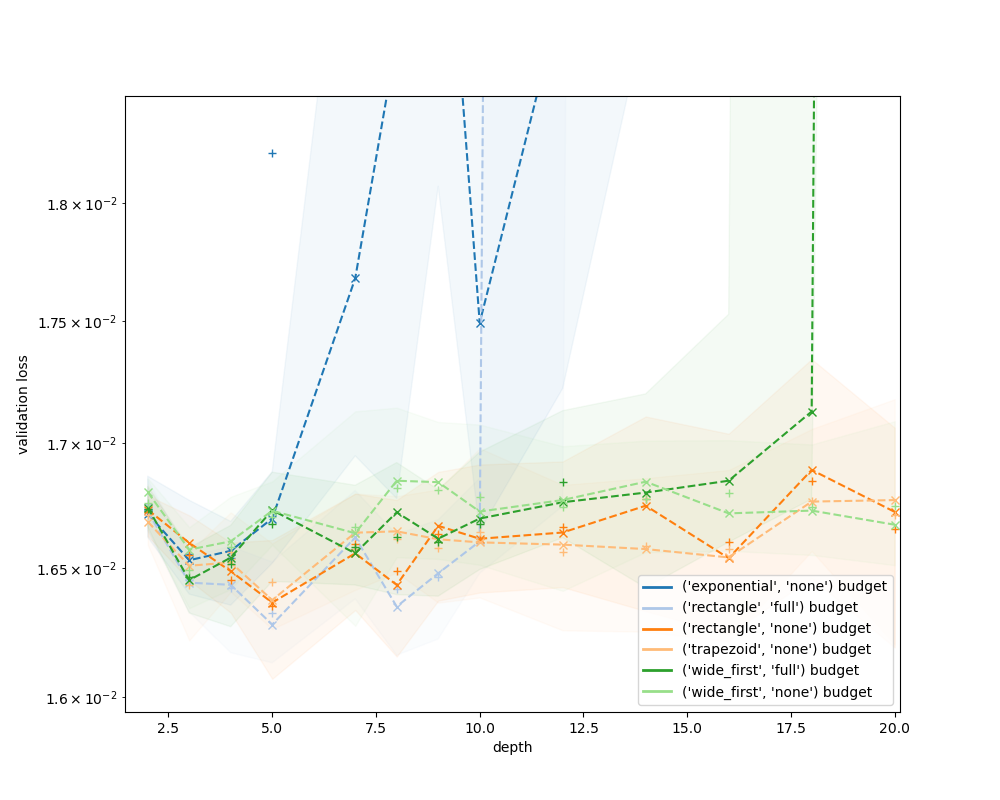

<IPython.core.display.Javascript object>


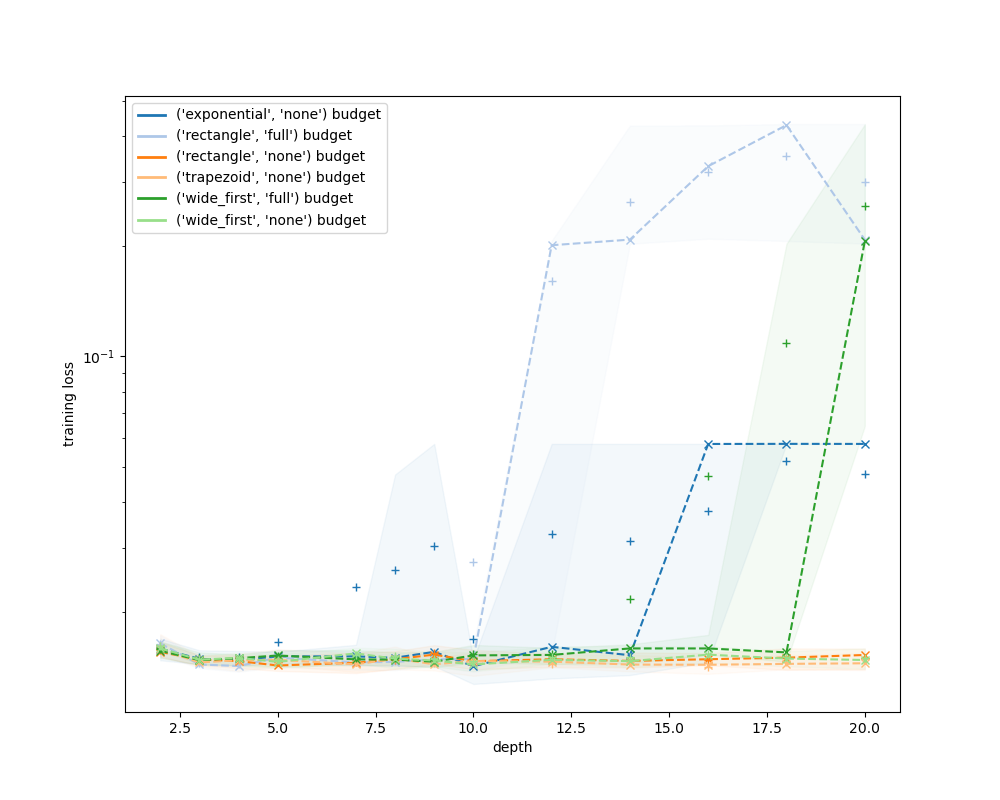

<IPython.core.display.Javascript object>


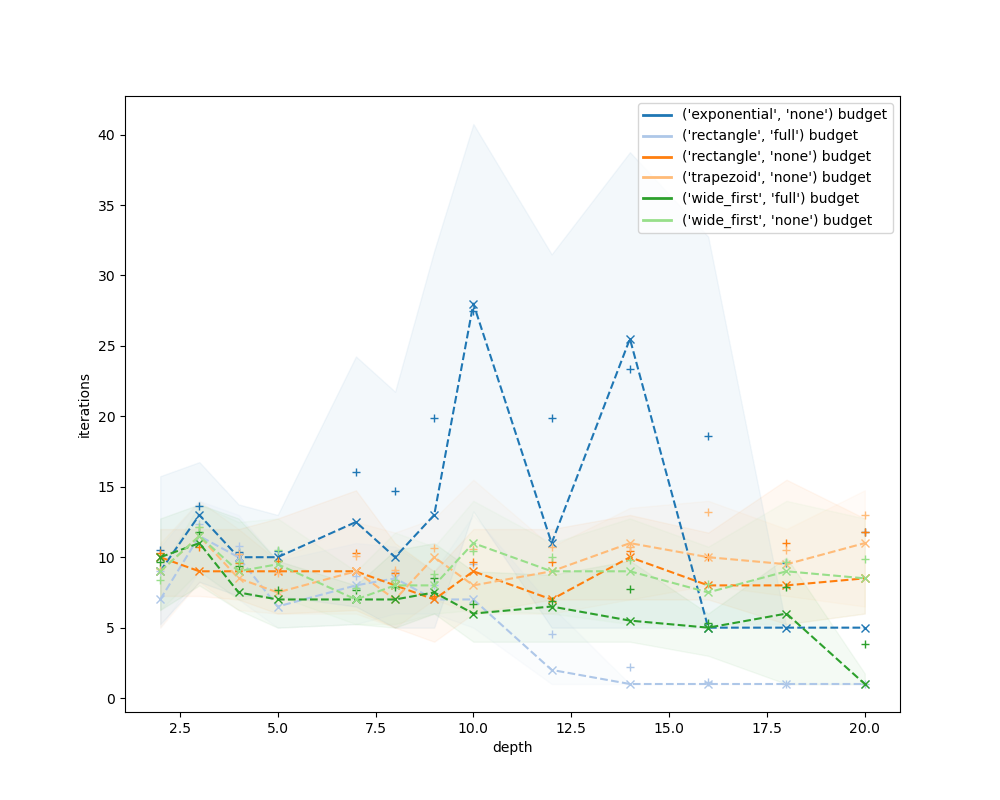

<IPython.core.display.Javascript object>


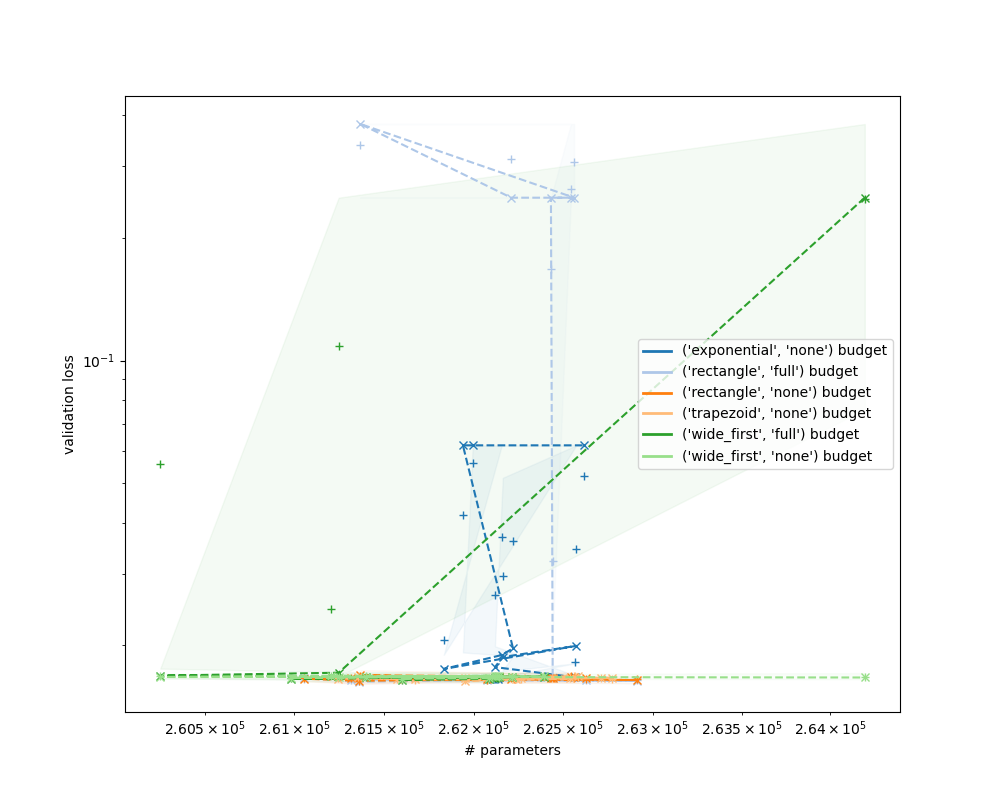

{'config.budget': 524288}


<IPython.core.display.Javascript object>


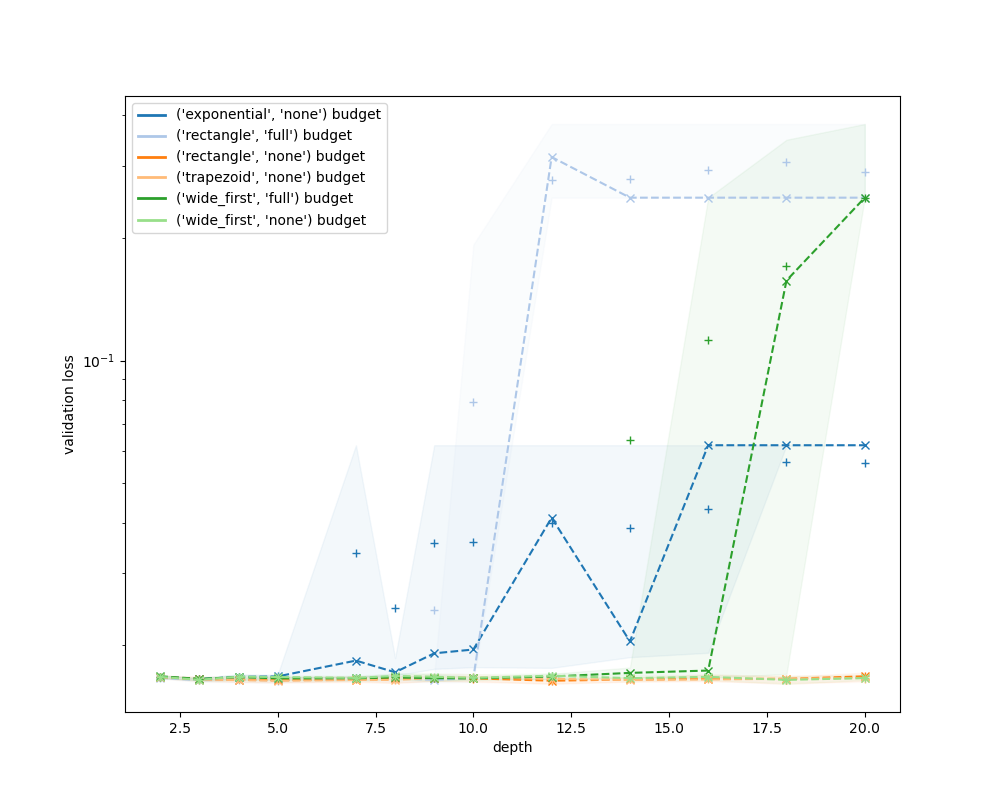

<IPython.core.display.Javascript object>


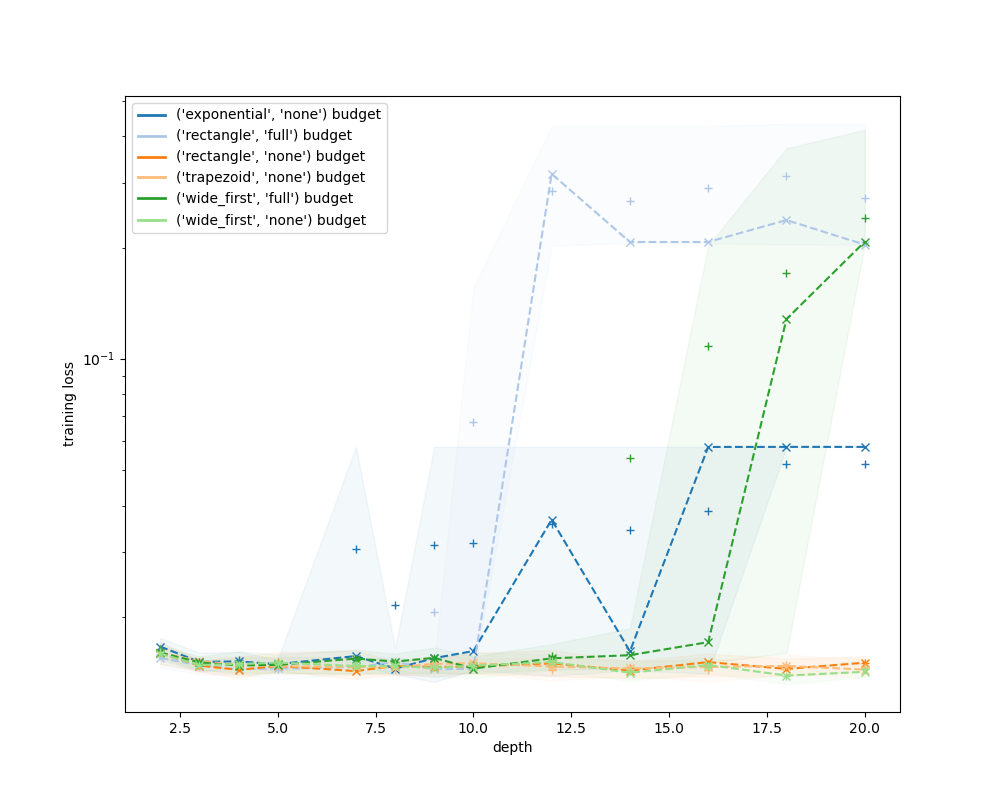

<IPython.core.display.Javascript object>


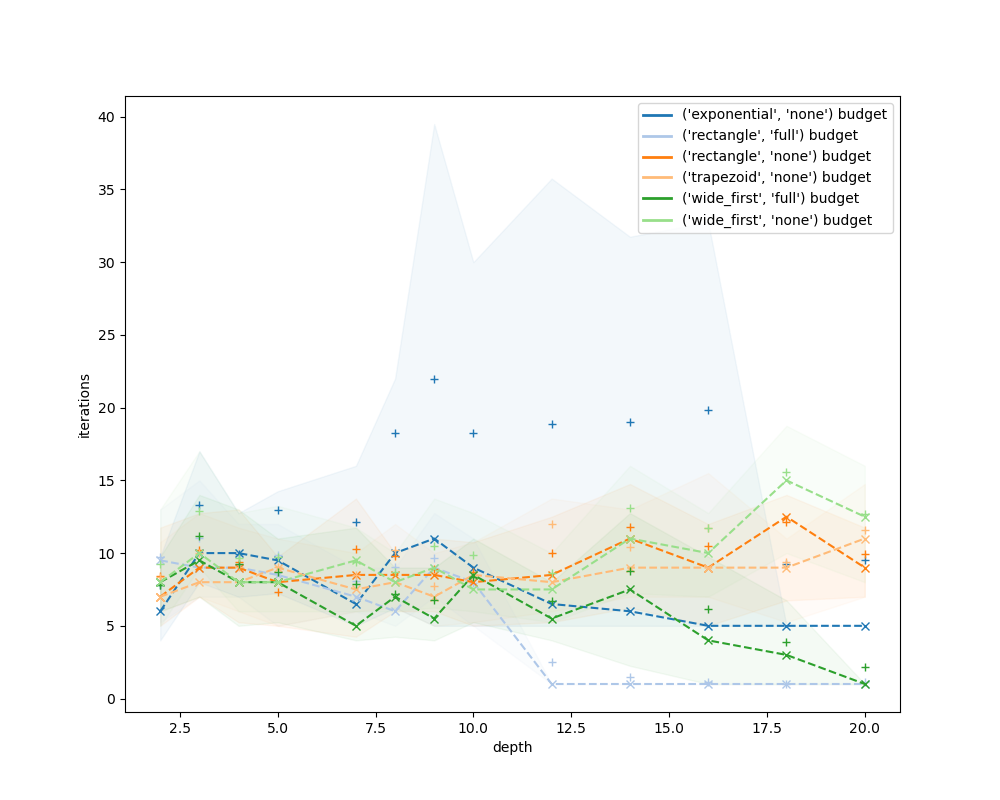

<IPython.core.display.Javascript object>


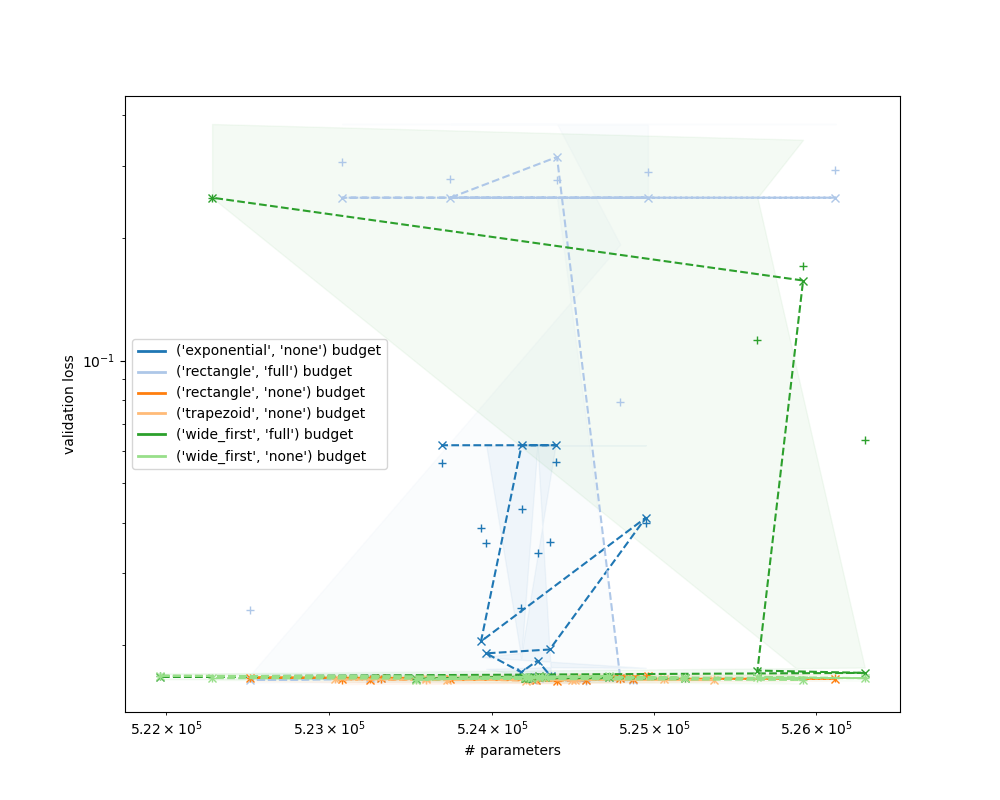

{'config.budget': 1048576}


<IPython.core.display.Javascript object>


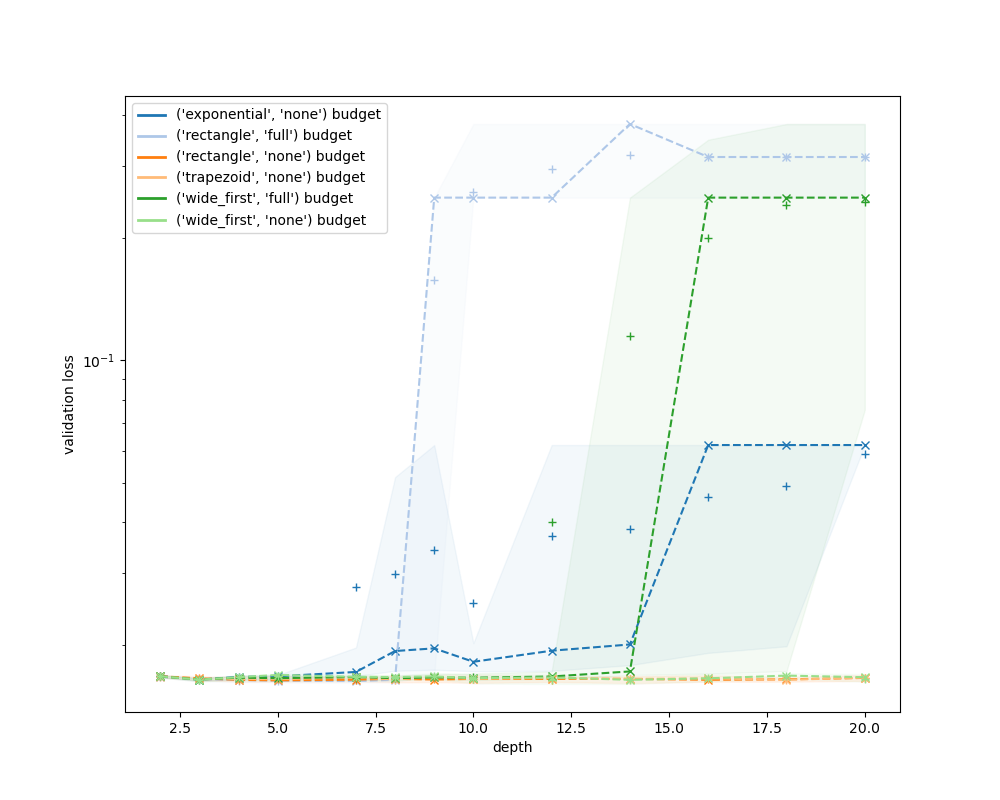

<IPython.core.display.Javascript object>


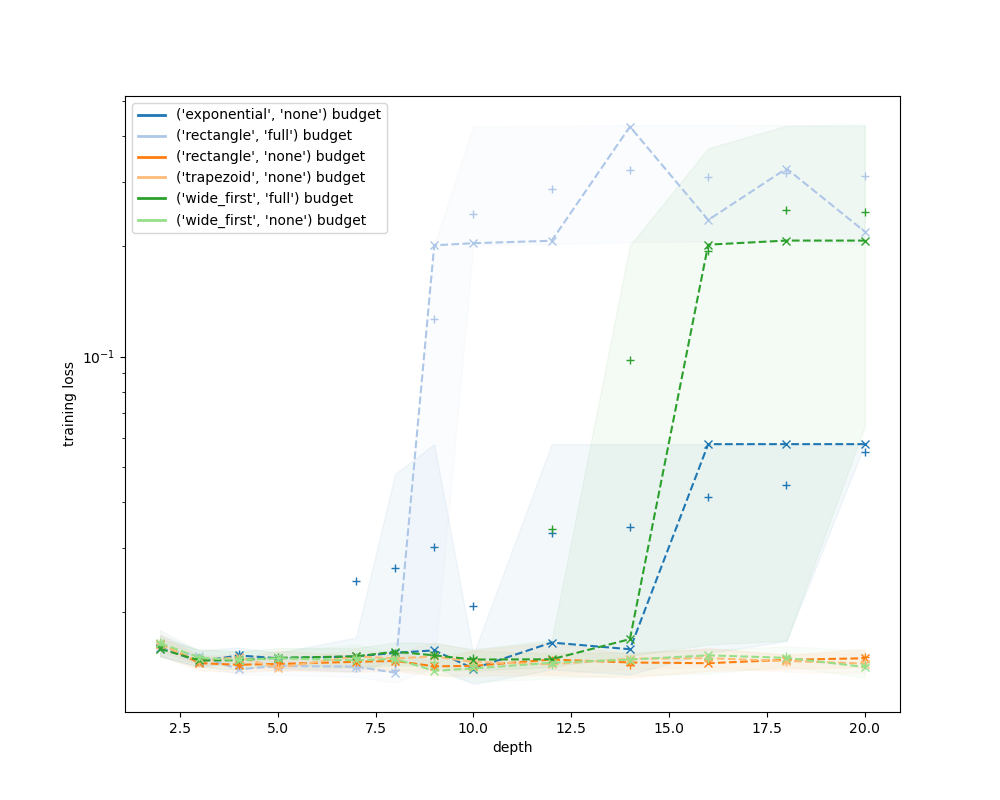

<IPython.core.display.Javascript object>


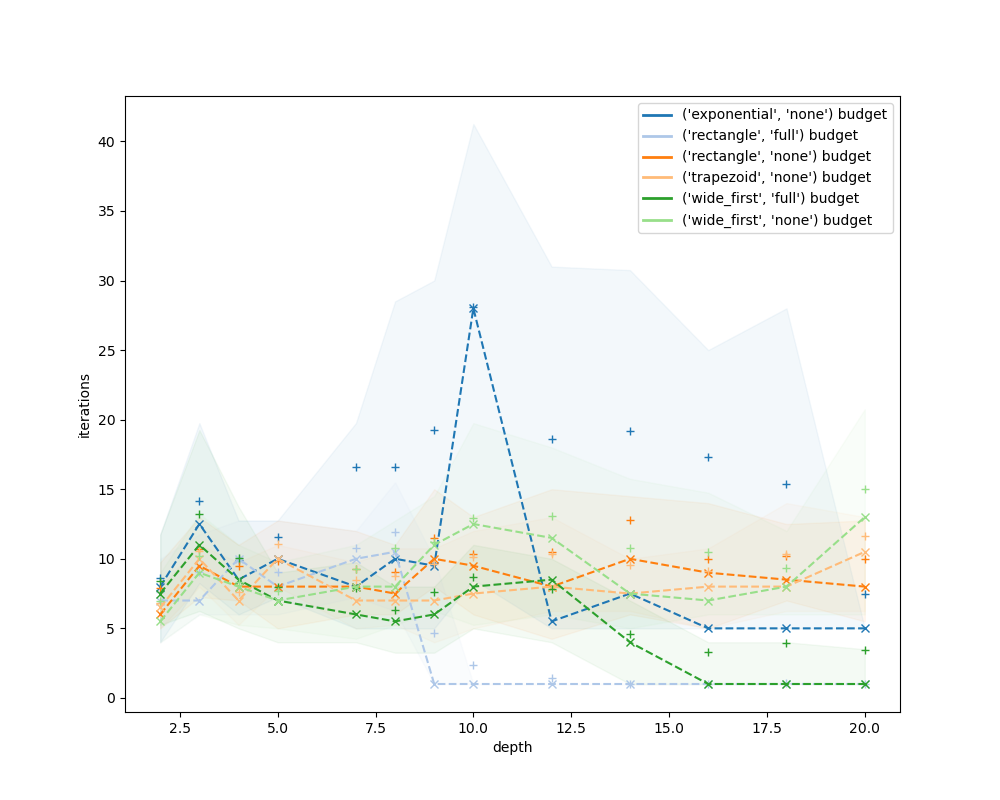

<IPython.core.display.Javascript object>


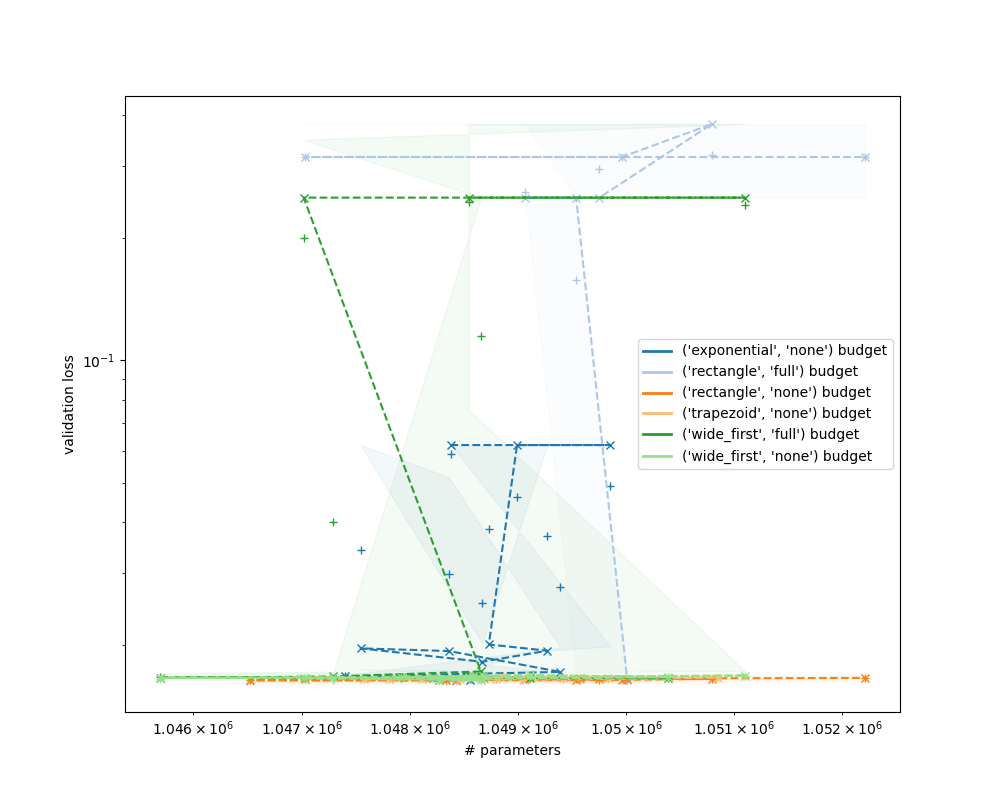

{'config.budget': 2097152}


<IPython.core.display.Javascript object>


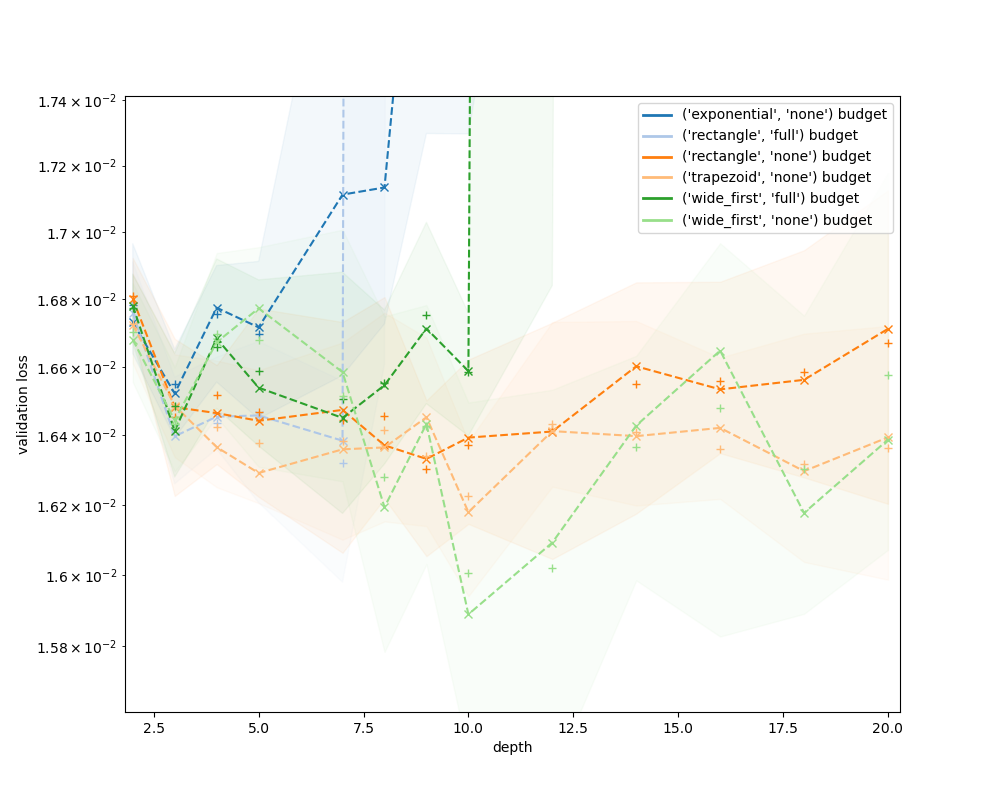

<IPython.core.display.Javascript object>


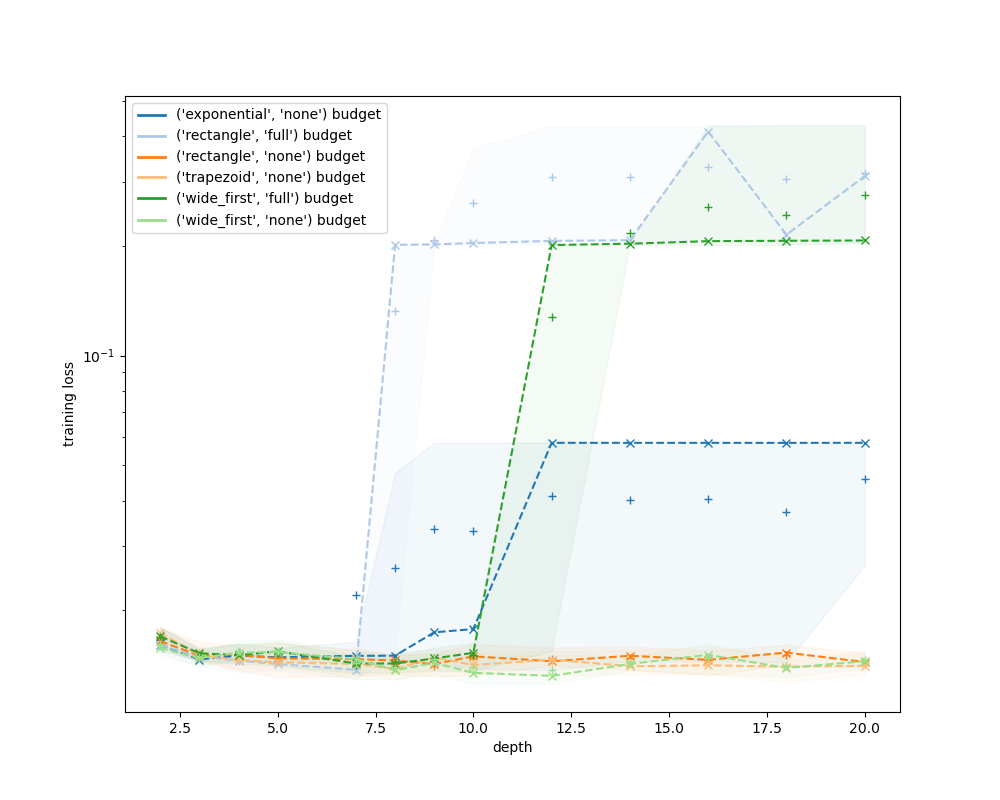

<IPython.core.display.Javascript object>


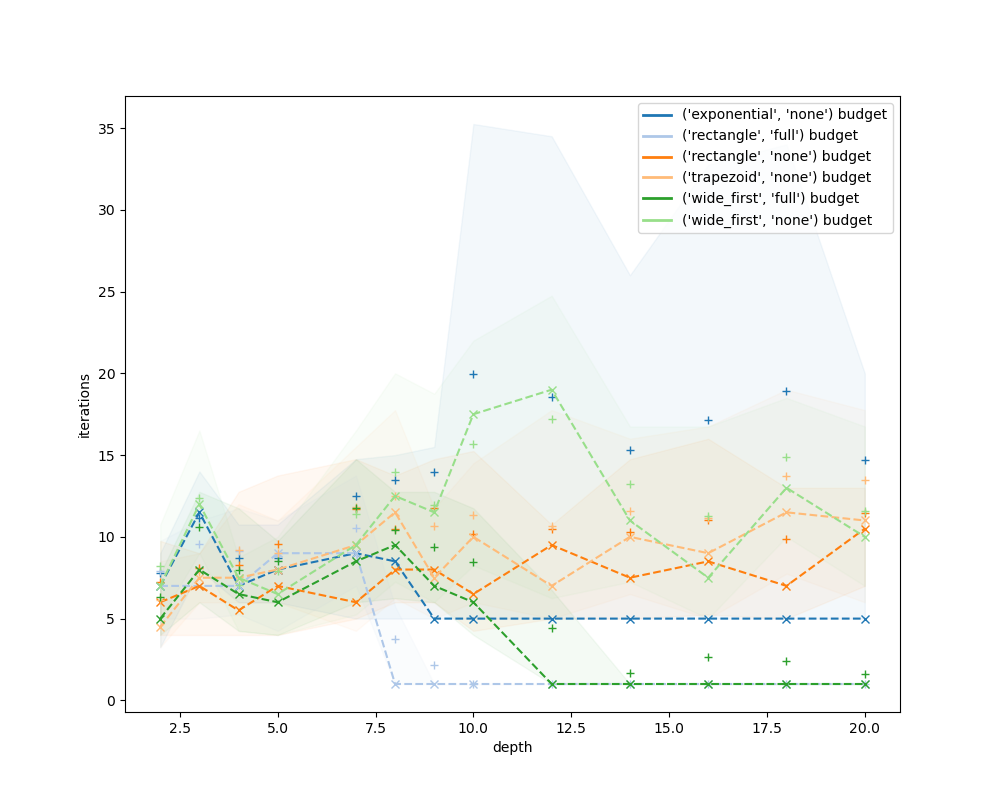

<IPython.core.display.Javascript object>


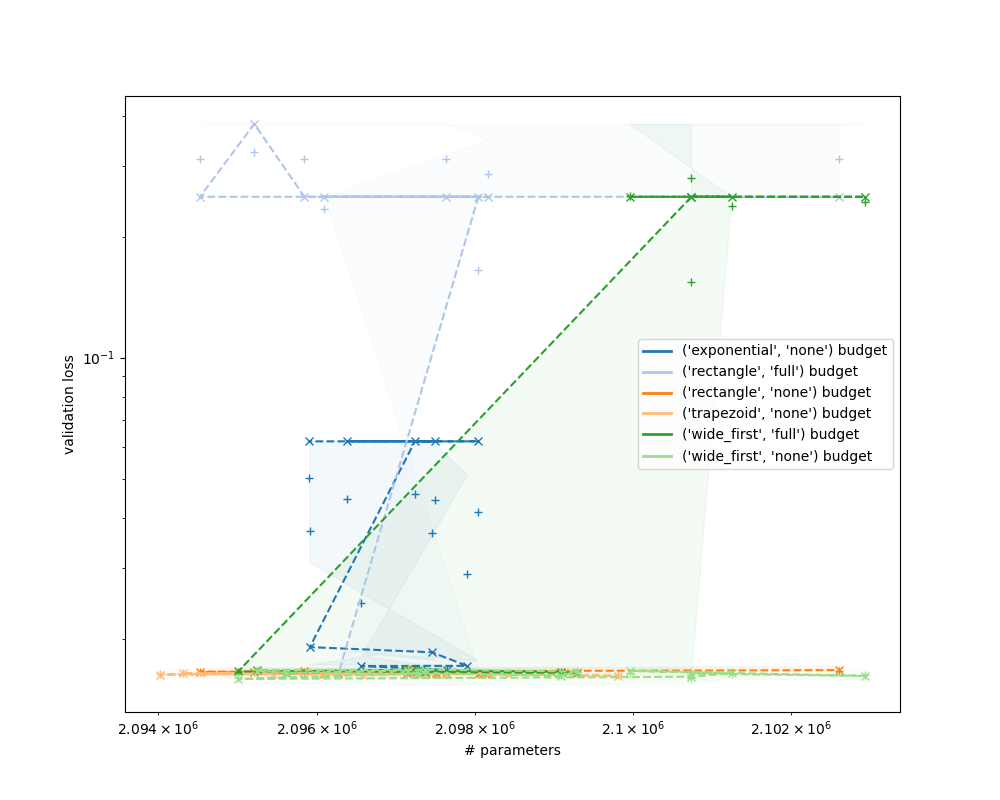

{'config.budget': 4194304}


<IPython.core.display.Javascript object>


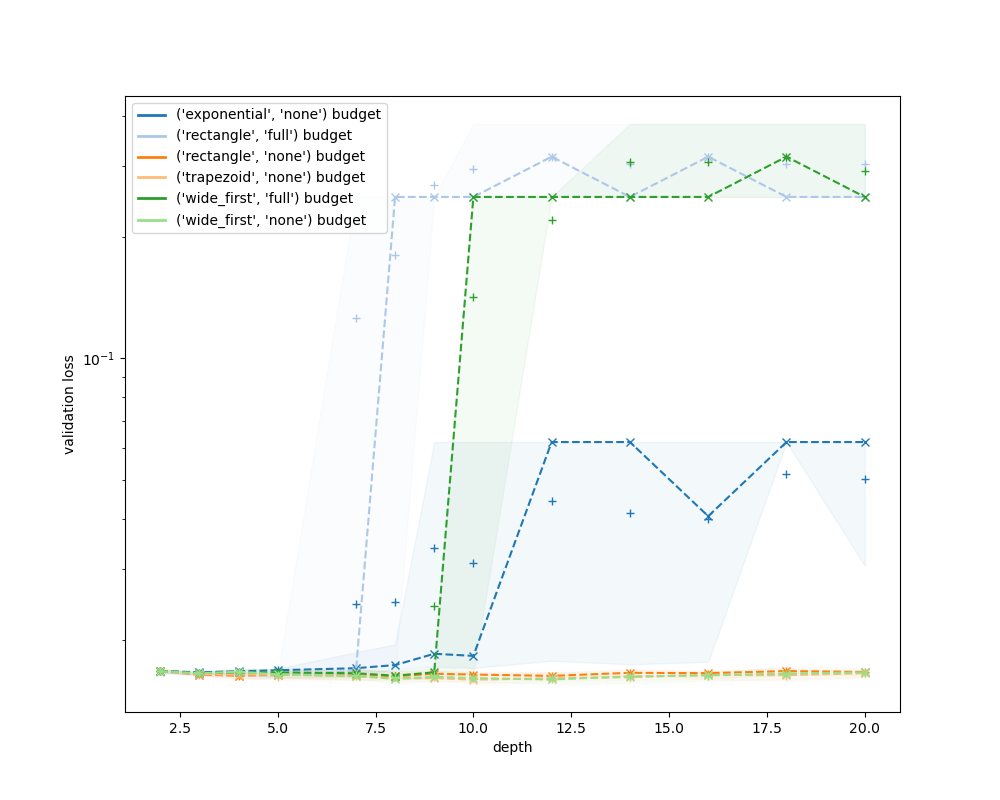

<IPython.core.display.Javascript object>


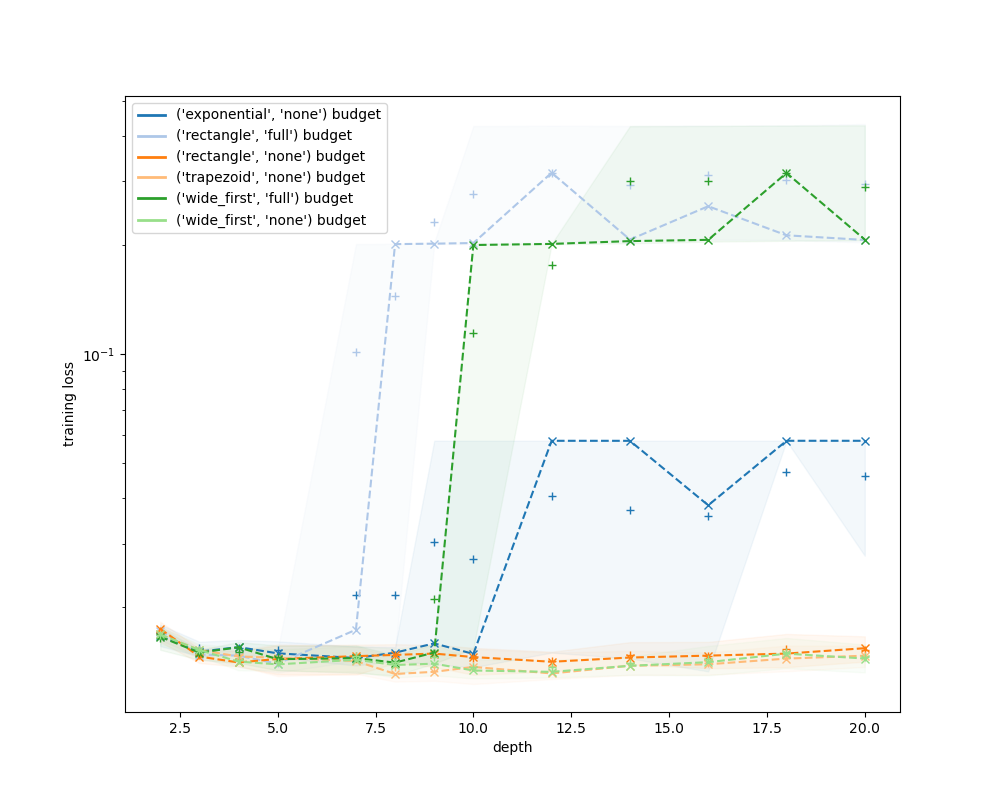

<IPython.core.display.Javascript object>


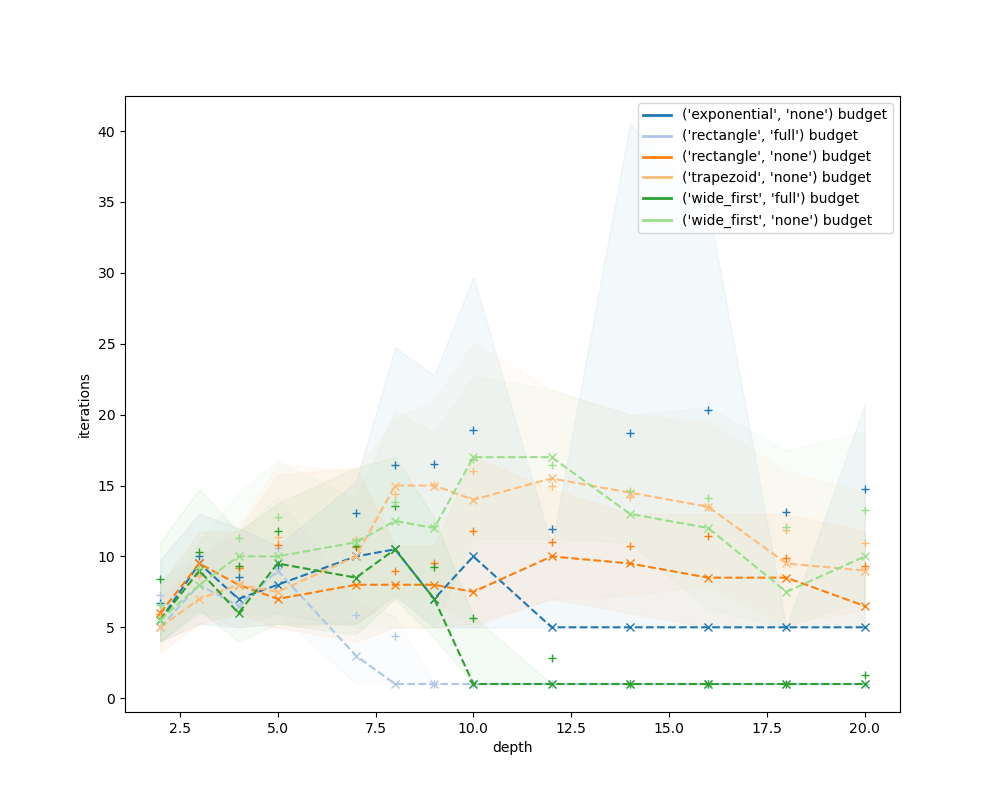

<IPython.core.display.Javascript object>


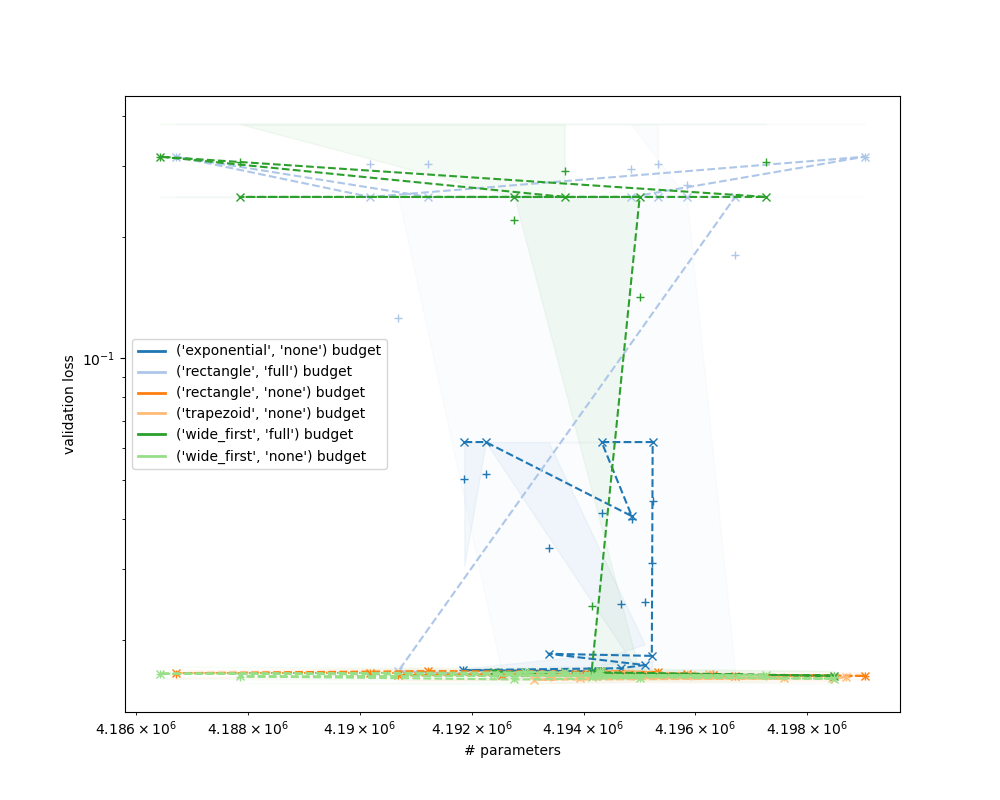

{'config.budget': 8388608}


<IPython.core.display.Javascript object>


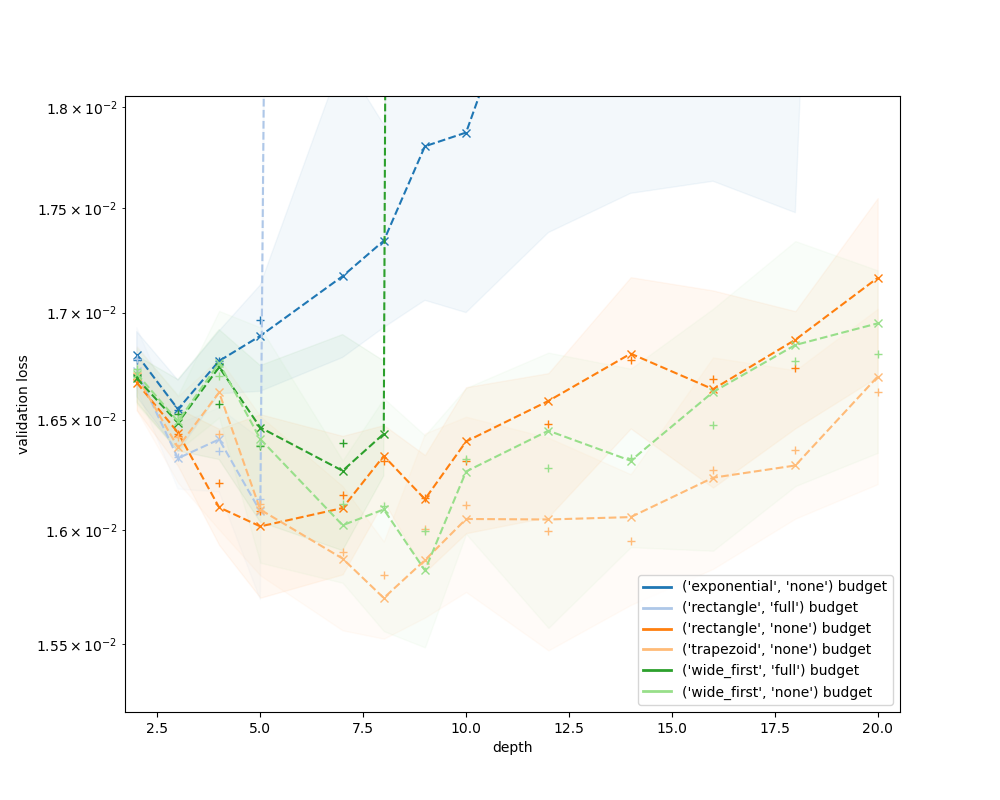

<IPython.core.display.Javascript object>


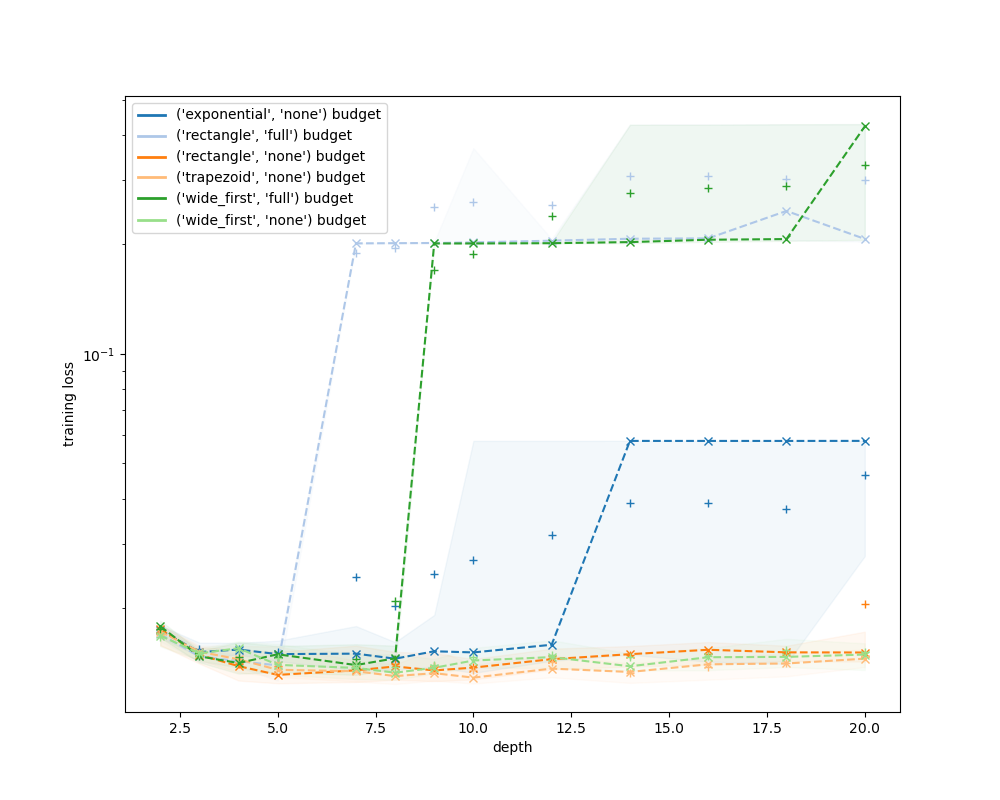

<IPython.core.display.Javascript object>


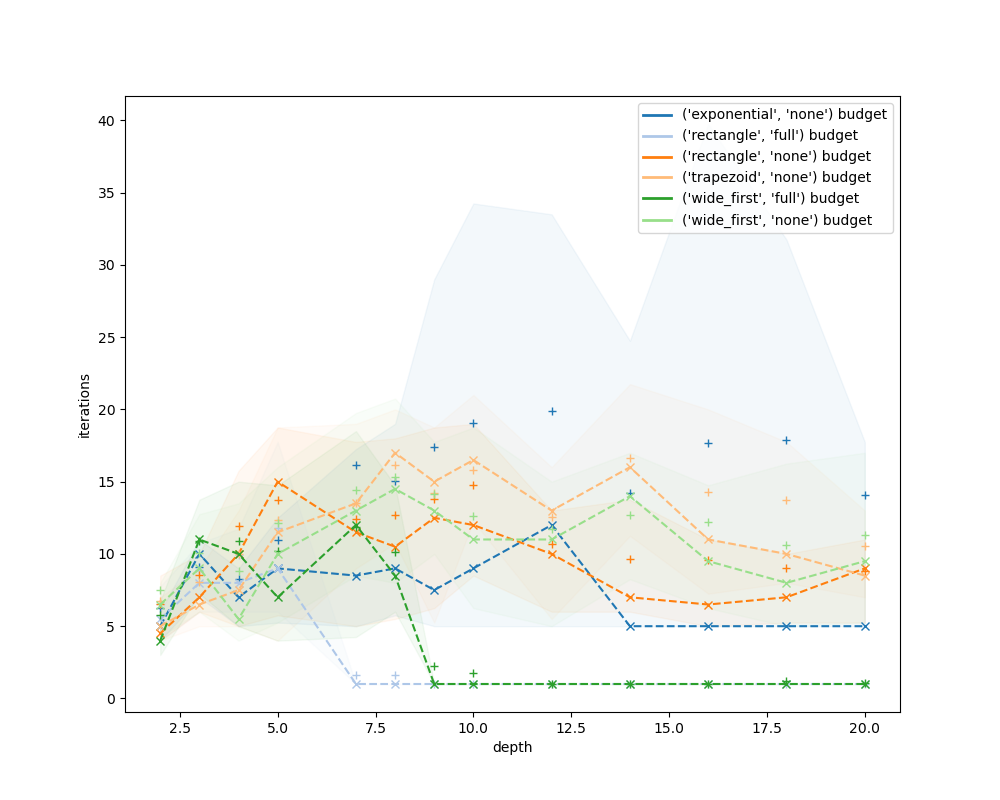

<IPython.core.display.Javascript object>


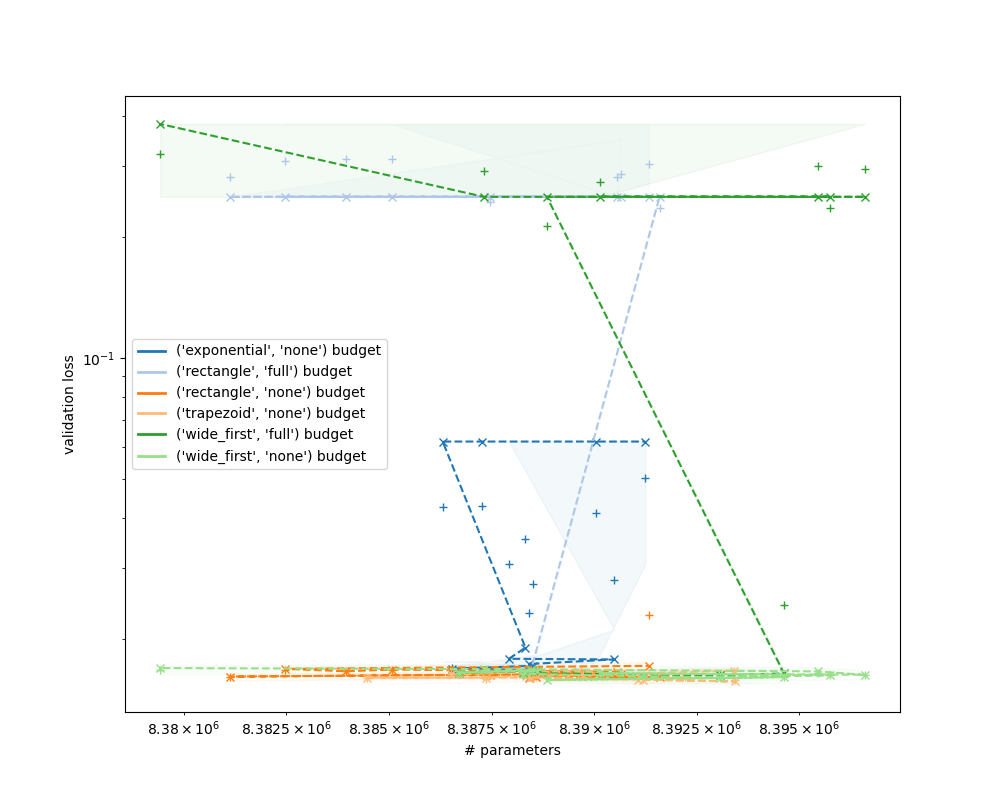

{'config.budget': 16777216}


<IPython.core.display.Javascript object>


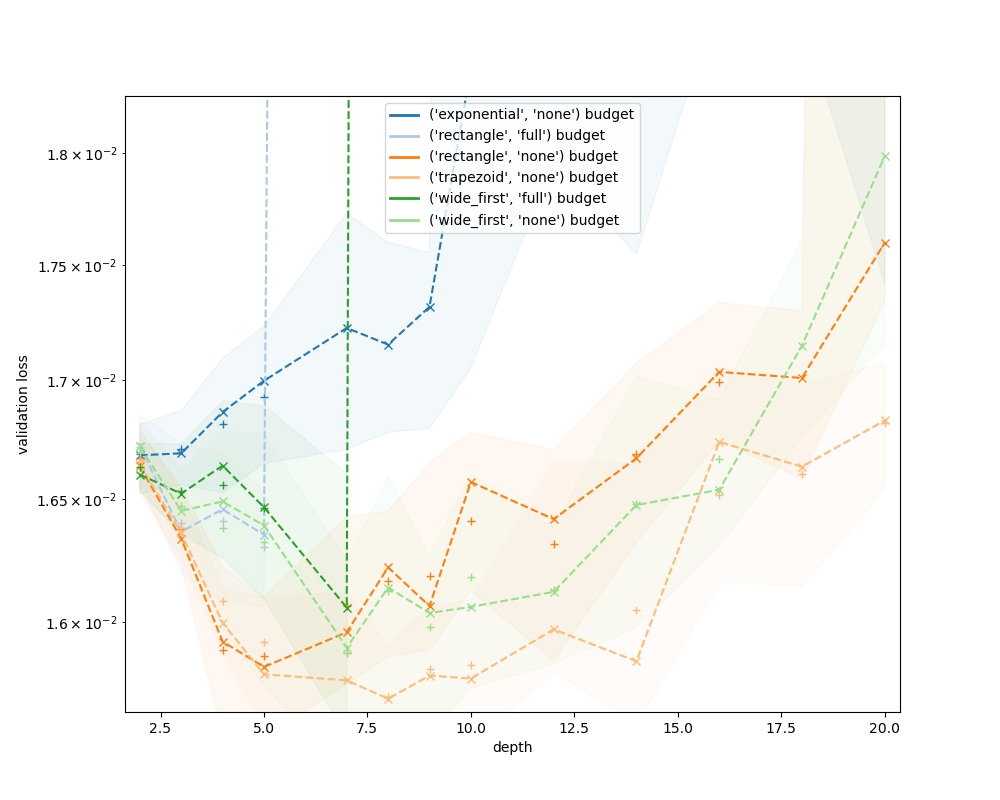

<IPython.core.display.Javascript object>


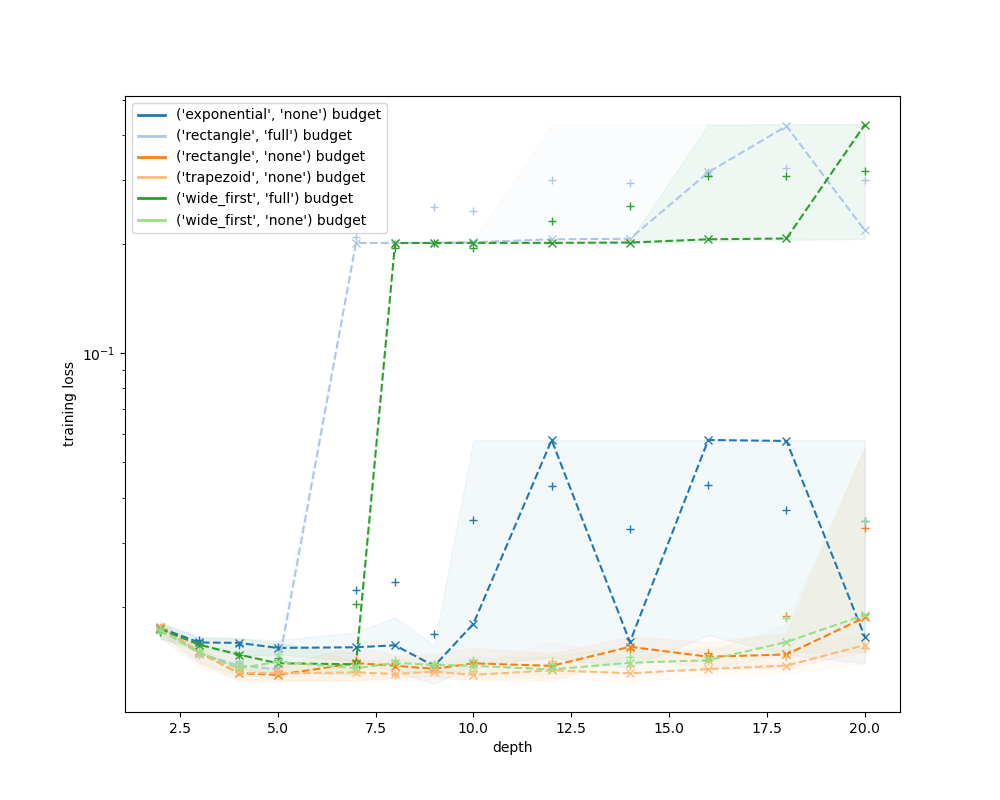

<IPython.core.display.Javascript object>


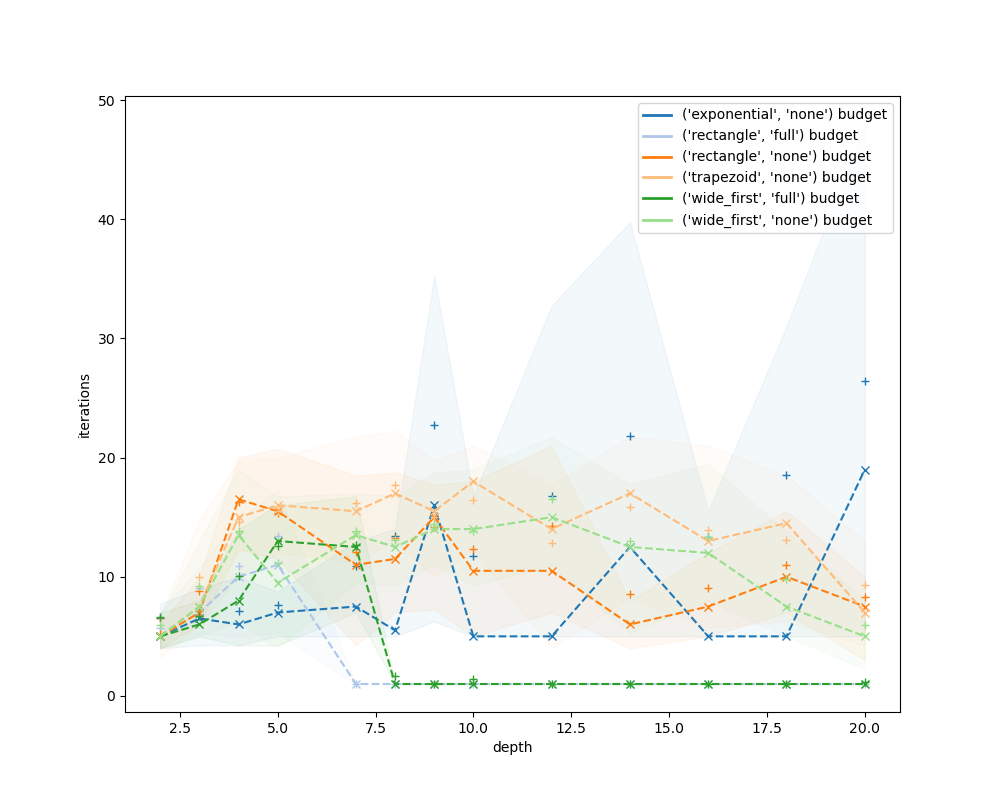

<IPython.core.display.Javascript object>


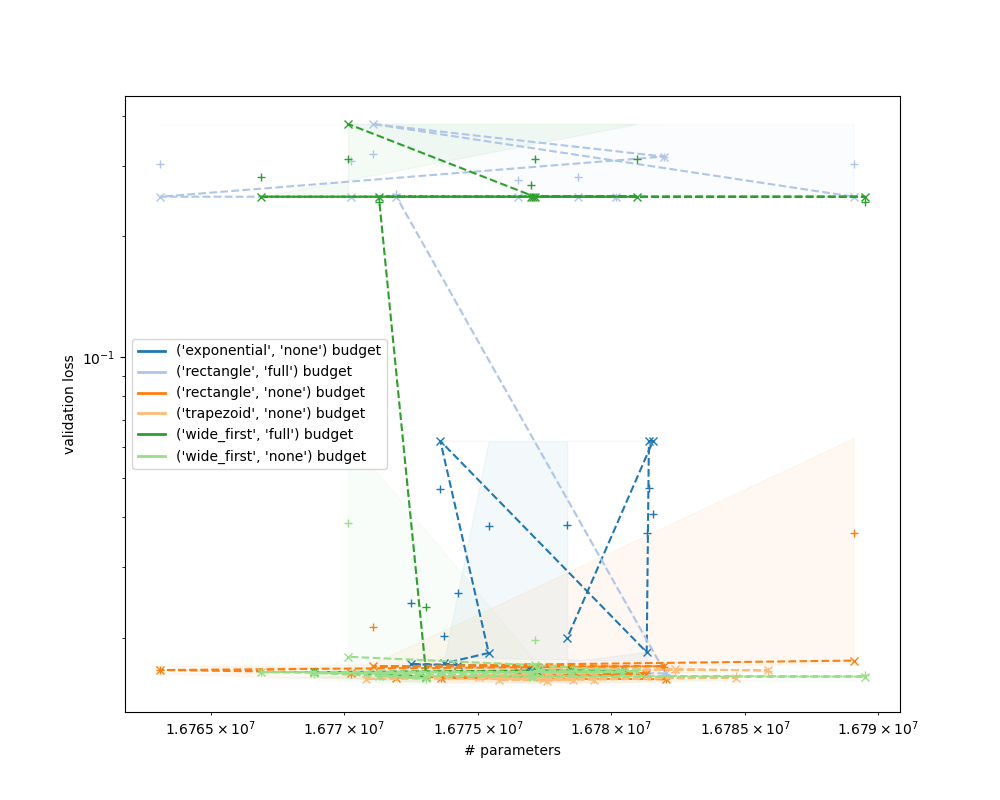

{'config.budget': 33554432}


<IPython.core.display.Javascript object>


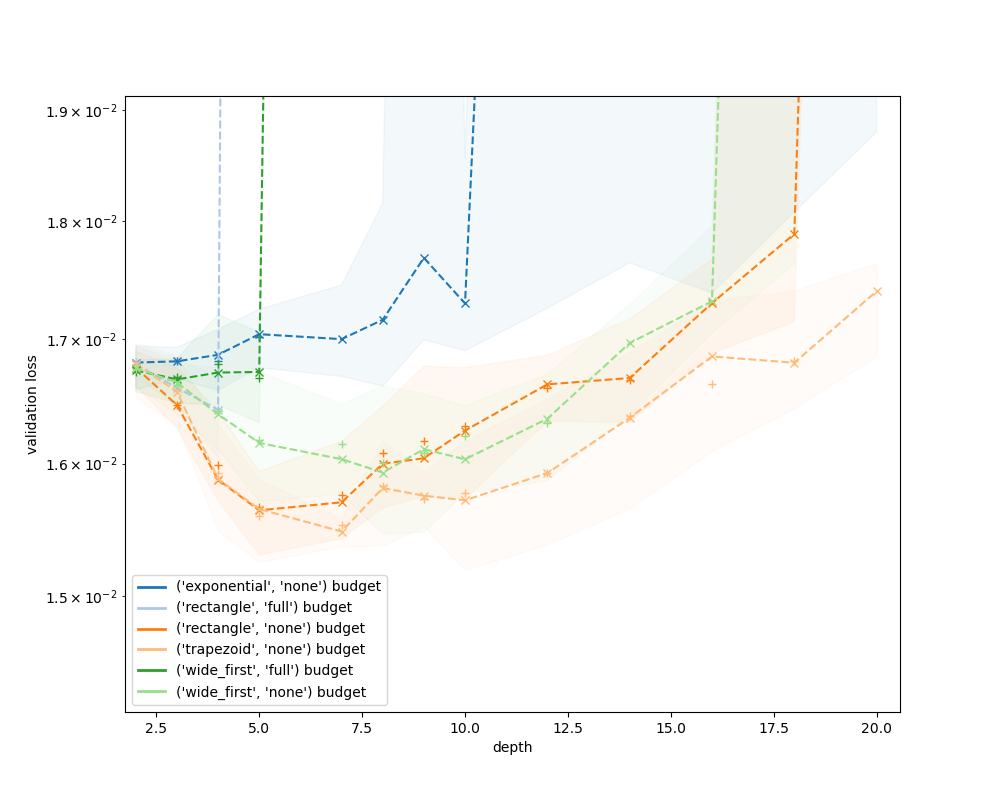

<IPython.core.display.Javascript object>


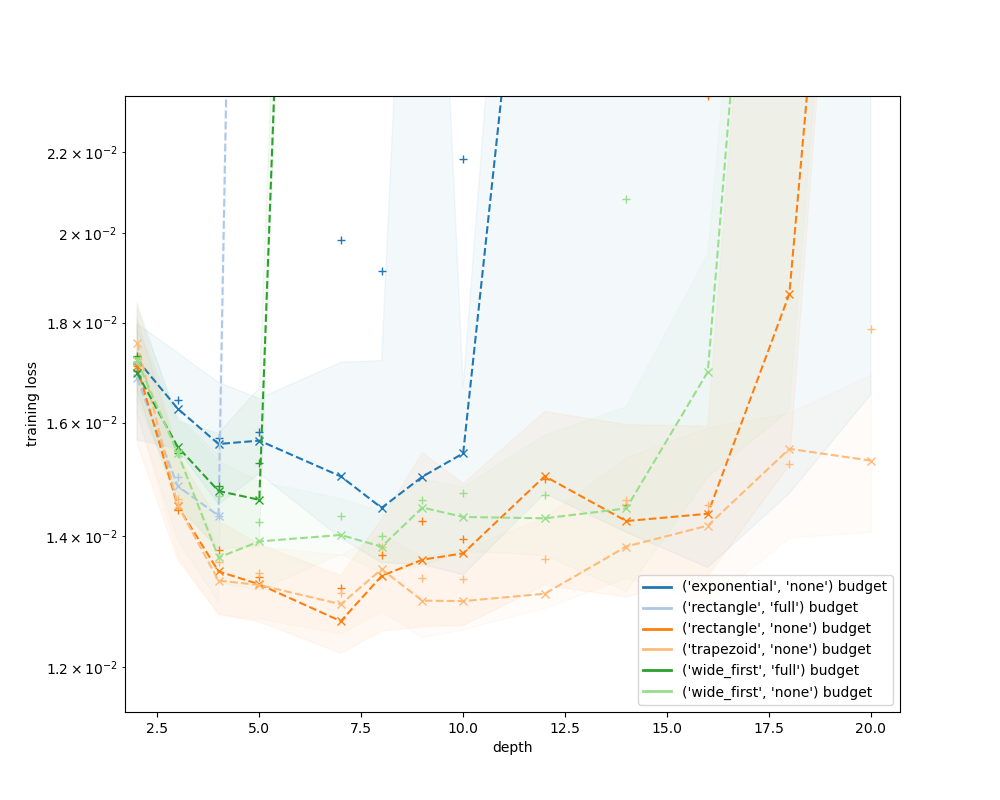

<IPython.core.display.Javascript object>


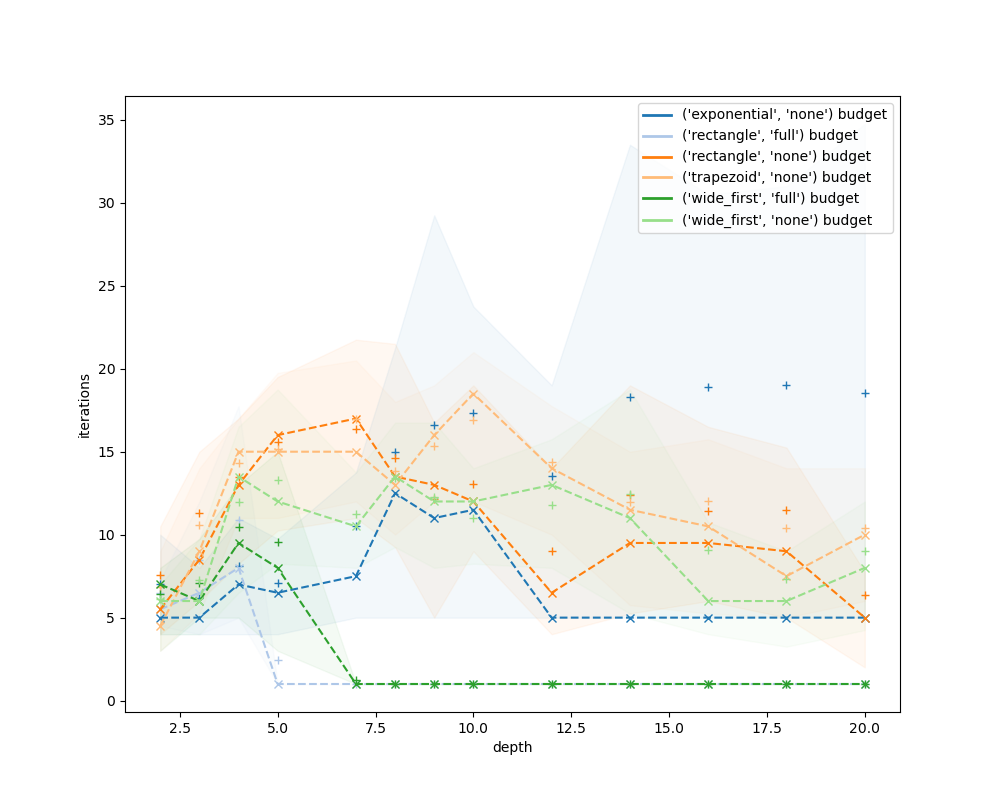

<IPython.core.display.Javascript object>


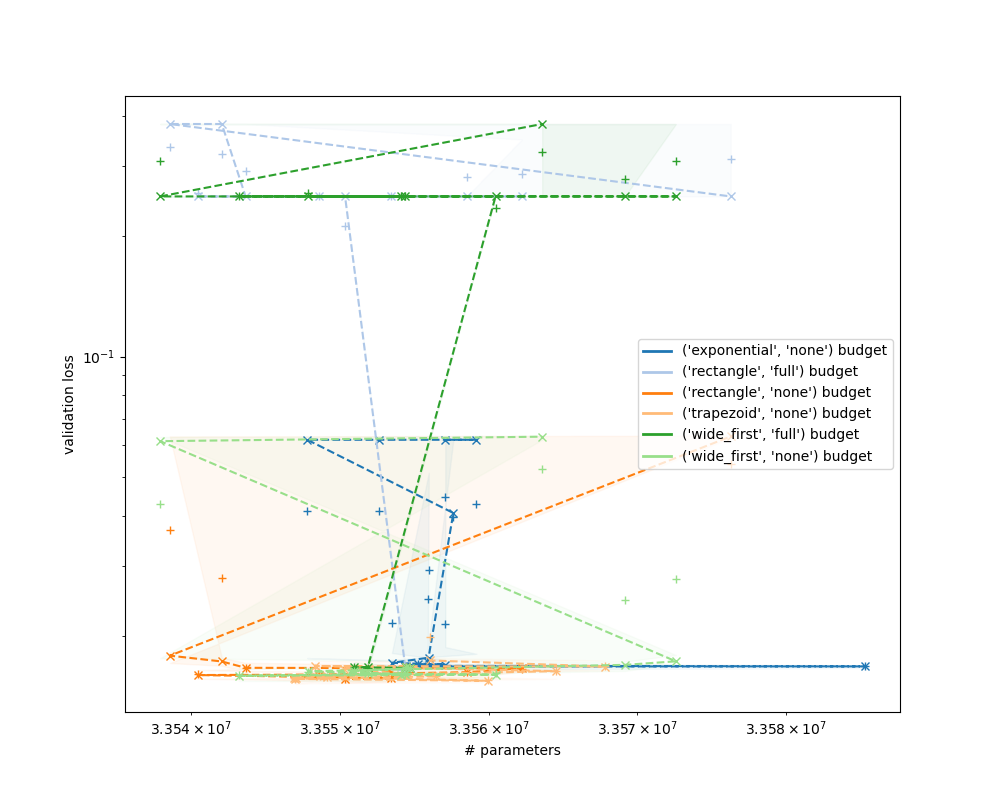

In [124]:
plot_for_each(datasets[datasets['config.dataset'] == '537_houses'], ['config.budget'], ['config.topology', 'config.residual_mode'], {})

In [305]:

def plot_colored_grid(data, xlabel, ylabel, xlabels = None, ylabels = None, color_bounds = None):
#     ax.imshow(gradient, aspect='auto', cmap=plt.get_cmap(name))
    cmap = plt.get_cmap('plasma')
#     norm = colors.Normalize(np.min(data), np.max(data), cmap.N)
    if color_bounds is None:
        color_bounds = lambda data : (np.min(data), np.max(data))
    min_color_bounds, max_color_bounds = color_bounds(data)
    norm = colors.Normalize(min_color_bounds, max_color_bounds, cmap.N)
    print(f'{np.min(data)} {np.max(data)}')
    
    fig, ax = plt.subplots()
    ax.imshow(data, cmap=cmap, norm=norm)

    # draw gridlines
    ax.grid(which='major', axis='both', linestyle='-', color='k', linewidth=2)
    ax.set_xticks(np.arange(-.5, data.shape[1], 1));
    ax.set_yticks(np.arange(-.5, data.shape[0], 1));
    
    if xlabels is not None:
        ax.set_yticklabels([''] + xlabels)
    if ylabels is not None:
        ax.set_xticklabels(ylabels + [''])
        plt.xticks(rotation=45)

    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    
    plt.show()
    return ax


def plot_grid_from_dataset(datasets, val_function, title, x_category, y_category, color_bounds = None):

    # grouped = datasets.groupby([x_category, y_category]) #, as_index=False)
    #     return [grouped.get_group(group) for group in grouped.groups], list(grouped.groups.keys())

    # pd.groupby
    x_values = sorted(pd.unique(datasets[x_category]))
    y_values = sorted(pd.unique(datasets[y_category]))
    print(x_values)
    print(y_values)
    result = np.zeros((len(x_values), len(y_values)))
    for x, x_value in enumerate(sorted(pd.unique(datasets[x_category]))):
        x_subset = datasets[datasets[x_category] == x_value]
        for y, y_value in enumerate(sorted(pd.unique(datasets[y_category]))):
            subset = x_subset[x_subset[y_category] == y_value]
            result[x, y] = val_function(subset)

    ax = plot_colored_grid(result, y_category, x_category, x_values, y_values, color_bounds = color_bounds)
    ax.set_title(title)
    print(result)


In [253]:
print(pd.unique(datasets['config.dataset']))

['wine_quality_white' '201_pol' '529_pollen' '537_houses' 'adult'
 'connect_4' 'mnist' 'nursery' 'sleep']


dataset: 201_pol
['exponential none', 'rectangle full', 'rectangle none', 'trapezoid none', 'wide_first full', 'wide_first none']
[1024, 2048, 4096, 8192, 16384, 32768, 65536, 131072, 262144, 524288, 1048576, 2097152, 4194304, 8388608, 16777216, 33554432]
0.00796779477968812 0.016160953789949417


<IPython.core.display.Javascript object>


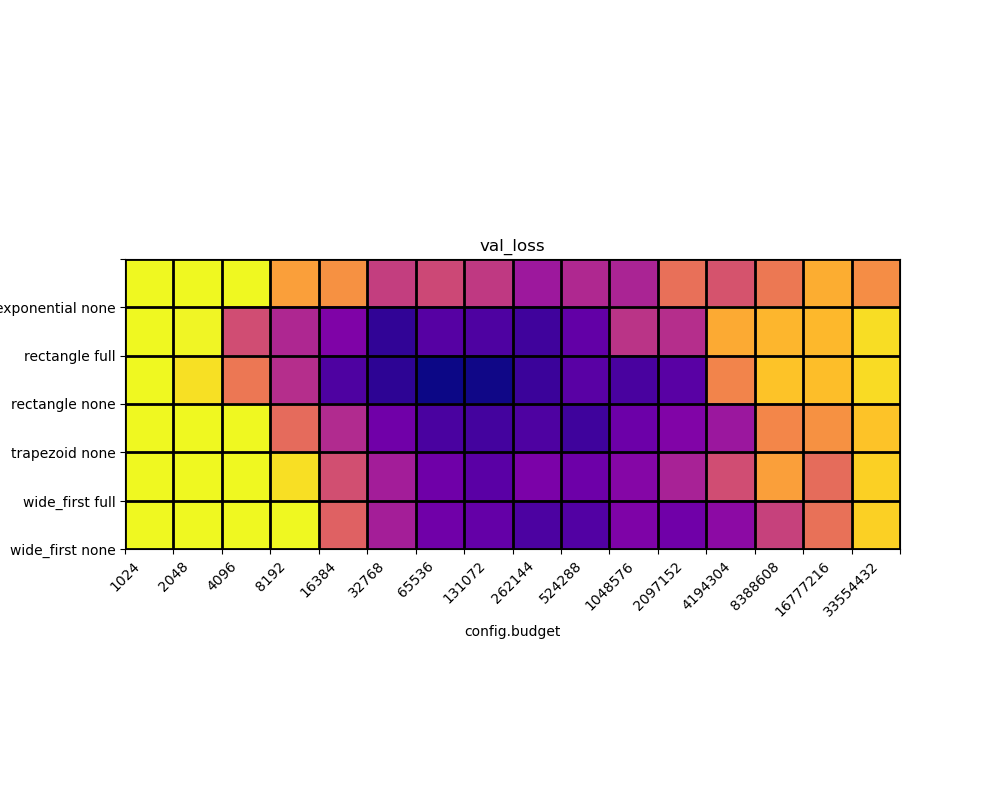

[[0.01175118 0.01094252 0.01012573 0.00951845 0.00943853 0.00890395
  0.00897904 0.00887095 0.0086396  0.00875799 0.00872551 0.00924113
  0.00905585 0.00929605 0.00959715 0.00942203]
 [0.0109155  0.00994186 0.00900866 0.00875046 0.00847569 0.00809656
  0.00826382 0.00822903 0.00816265 0.00832752 0.00883263 0.00879314
  0.00957863 0.00964744 0.00965567 0.00983492]
 [0.01129725 0.00984943 0.00928513 0.0087971  0.00822649 0.00807689
  0.00796779 0.00797606 0.00814501 0.00828295 0.00820134 0.00828002
  0.0093662  0.00970781 0.00968167 0.00982604]
 [0.01129437 0.0103391  0.00997826 0.0092064  0.00877382 0.00839998
  0.00821455 0.00817791 0.00823175 0.00815865 0.00837813 0.00848755
  0.00863573 0.0093794  0.0094434  0.00970859]
 [0.01577617 0.01311515 0.01151908 0.00984217 0.00902261 0.00868089
  0.00839195 0.00829253 0.00845628 0.00838399 0.00850556 0.00871236
  0.0090058  0.00952382 0.00921917 0.00977106]
 [0.01616095 0.01284471 0.01170947 0.0105302  0.00914477 0.00868827
  0.00840304 0.00

<IPython.core.display.Javascript object>


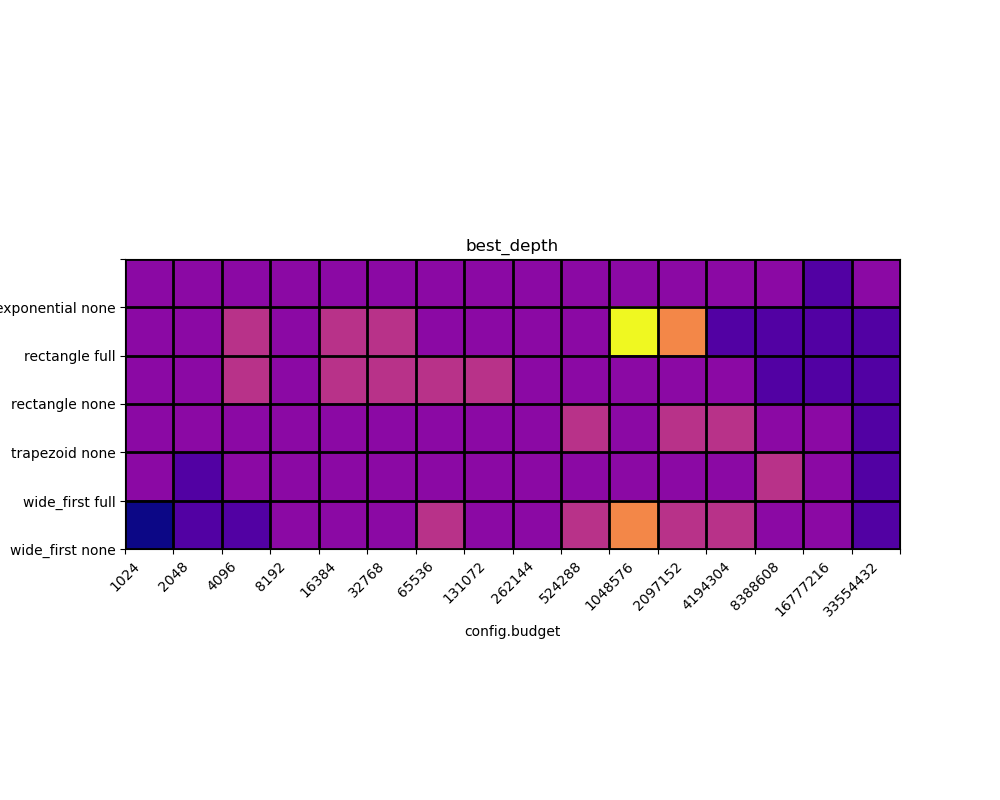

[[4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 3. 4.]
 [4. 4. 5. 4. 5. 5. 4. 4. 4. 4. 9. 7. 3. 3. 3. 3.]
 [4. 4. 5. 4. 5. 5. 5. 5. 4. 4. 4. 4. 4. 3. 3. 3.]
 [4. 4. 4. 4. 4. 4. 4. 4. 4. 5. 4. 5. 5. 4. 4. 3.]
 [4. 3. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 5. 4. 3.]
 [2. 3. 3. 4. 4. 4. 5. 4. 4. 5. 7. 5. 5. 4. 4. 3.]]
dataset: 529_pollen
['exponential none', 'rectangle full', 'rectangle none', 'trapezoid none', 'wide_first full', 'wide_first none']
[1024, 2048, 4096, 8192, 16384, 32768, 65536, 131072, 262144, 524288, 1048576, 2097152, 4194304, 8388608, 16777216, 33554432]
0.004265093710273504 0.0043102228082716465


<IPython.core.display.Javascript object>


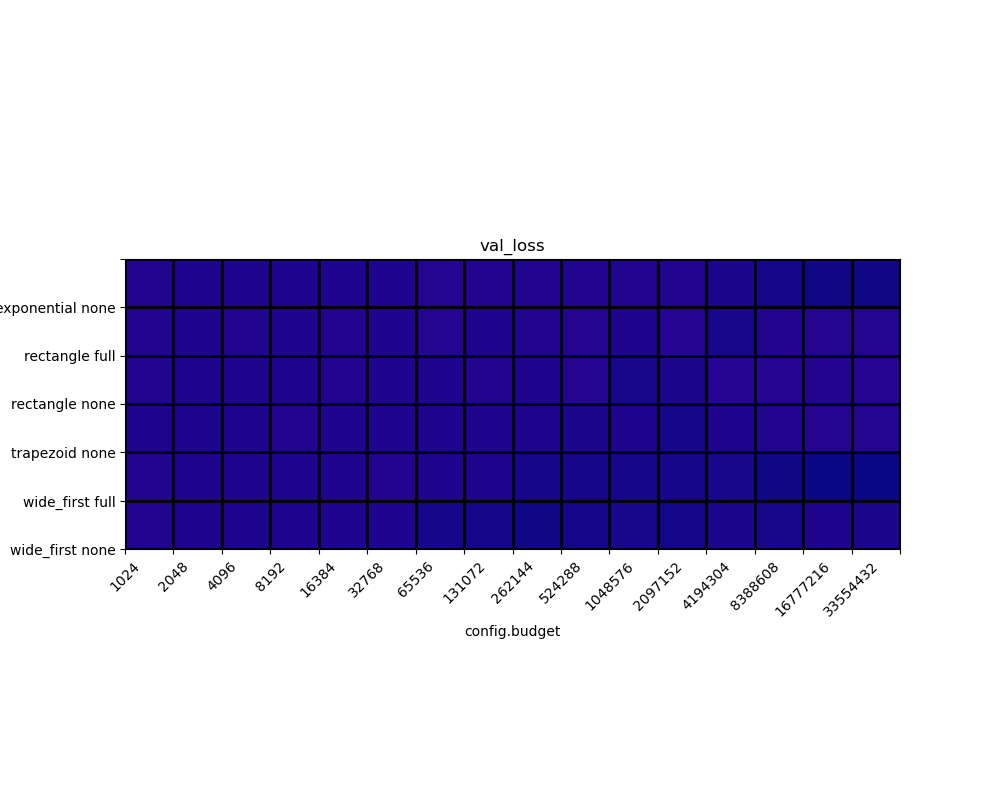

[[0.00430067 0.0042977  0.00429825 0.00429551 0.00429143 0.00429824
  0.00430526 0.0043011  0.00430142 0.00430211 0.00430003 0.00430005
  0.004289   0.00427799 0.00427234 0.00427077]
 [0.00430007 0.0042981  0.00430056 0.00429681 0.0043011  0.0042972
  0.00430527 0.00429704 0.00429963 0.00430277 0.00429223 0.00430783
  0.0042841  0.00429902 0.00430346 0.00430468]
 [0.00430247 0.00429715 0.00429634 0.00429558 0.00430114 0.00429455
  0.00429628 0.00430049 0.00429812 0.00430363 0.00428557 0.00428895
  0.00431022 0.00430684 0.00430135 0.00430761]
 [0.00429791 0.00429348 0.0042956  0.00430102 0.00429686 0.00429819
  0.00429108 0.00429636 0.00429326 0.004286   0.00429009 0.00428129
  0.00429459 0.00430194 0.00430373 0.00430308]
 [0.00430092 0.00429528 0.00429799 0.00429025 0.00429749 0.00429966
  0.00429636 0.00429173 0.0042802  0.00428101 0.00428117 0.00427845
  0.00428586 0.00427326 0.00426509 0.00426792]
 [0.00430136 0.00429613 0.00429152 0.00429553 0.00429238 0.00429104
  0.00428152 0.004

<IPython.core.display.Javascript object>


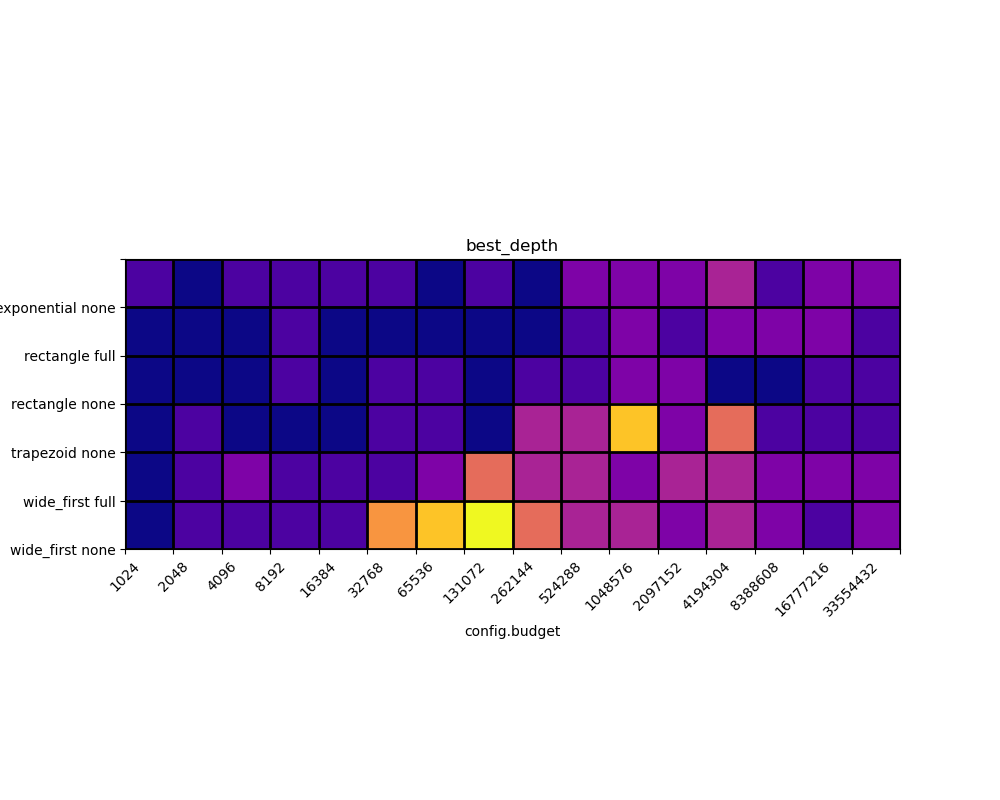

[[ 3.  2.  3.  3.  3.  3.  2.  3.  2.  4.  4.  4.  5.  3.  4.  4.]
 [ 2.  2.  2.  3.  2.  2.  2.  2.  2.  3.  4.  3.  4.  4.  4.  3.]
 [ 2.  2.  2.  3.  2.  3.  3.  2.  3.  3.  4.  4.  2.  2.  3.  3.]
 [ 2.  3.  2.  2.  2.  3.  3.  2.  5.  5.  9.  4.  7.  3.  3.  3.]
 [ 2.  3.  4.  3.  3.  3.  4.  7.  5.  5.  4.  5.  5.  4.  4.  4.]
 [ 2.  3.  3.  3.  3.  8.  9. 10.  7.  5.  5.  4.  5.  4.  3.  4.]]
dataset: 537_houses
['exponential none', 'rectangle full', 'rectangle none', 'trapezoid none', 'wide_first full', 'wide_first none']
[1024, 2048, 4096, 8192, 16384, 32768, 65536, 131072, 262144, 524288, 1048576, 2097152, 4194304, 8388608, 16777216, 33554432]
0.01548013649880886 0.01687824074178934


<IPython.core.display.Javascript object>


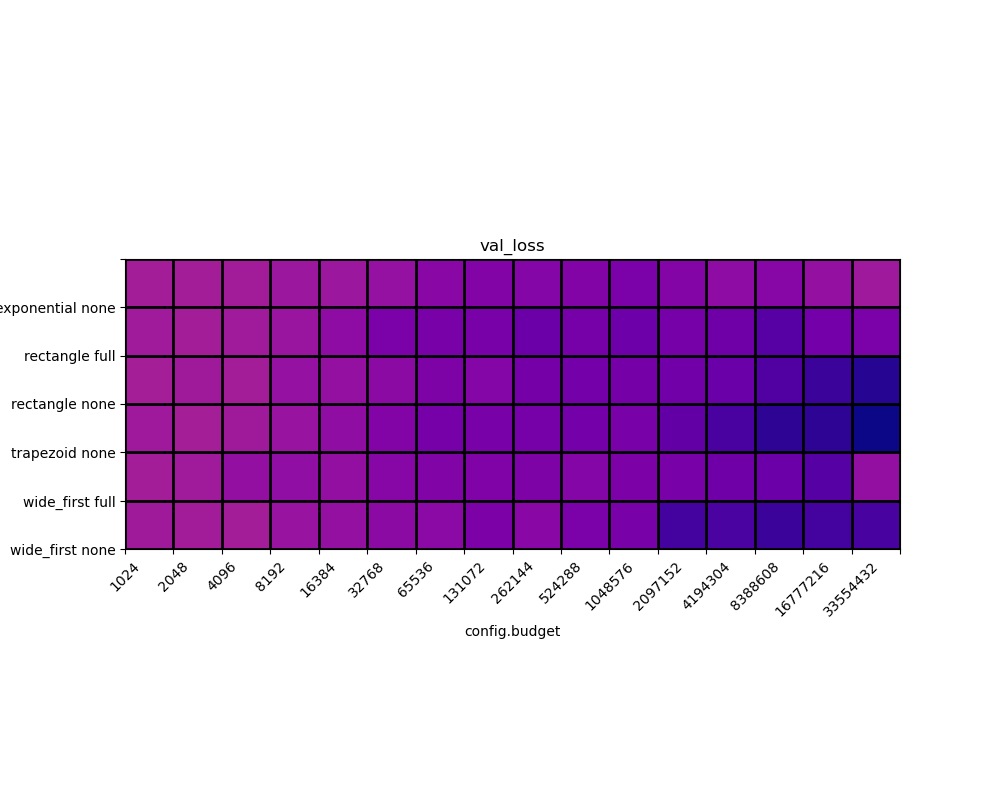

[[0.01686802 0.01686873 0.01684346 0.016774   0.01677777 0.01669594
  0.01657718 0.016497   0.01653038 0.01650194 0.01642608 0.01652193
  0.01662672 0.01654807 0.01668321 0.01680442]
 [0.0168293  0.01685829 0.01683572 0.01673634 0.0166275  0.01642844
  0.01640054 0.01641647 0.01627864 0.01638602 0.01629041 0.01638456
  0.01631046 0.01608363 0.01635358 0.01642405]
 [0.01687661 0.01681446 0.01686426 0.01669591 0.01667875 0.0166089
  0.01645463 0.01653201 0.01636404 0.01635473 0.01635941 0.01633203
  0.0162553  0.01601649 0.01581948 0.01564065]
 [0.01679537 0.01687824 0.01681469 0.01672735 0.01664144 0.01649823
  0.01638043 0.01638882 0.01637396 0.01634943 0.01640553 0.01617917
  0.01594018 0.01570007 0.01569348 0.01548014]
 [0.01686136 0.01682897 0.01666687 0.01665911 0.01666343 0.01654064
  0.01648198 0.01647489 0.01645216 0.016527   0.01643268 0.01641311
  0.01630526 0.0162665  0.01605692 0.01666735]
 [0.01681551 0.01685195 0.01686928 0.01672855 0.01668668 0.01660297
  0.01659796 0.016

<IPython.core.display.Javascript object>


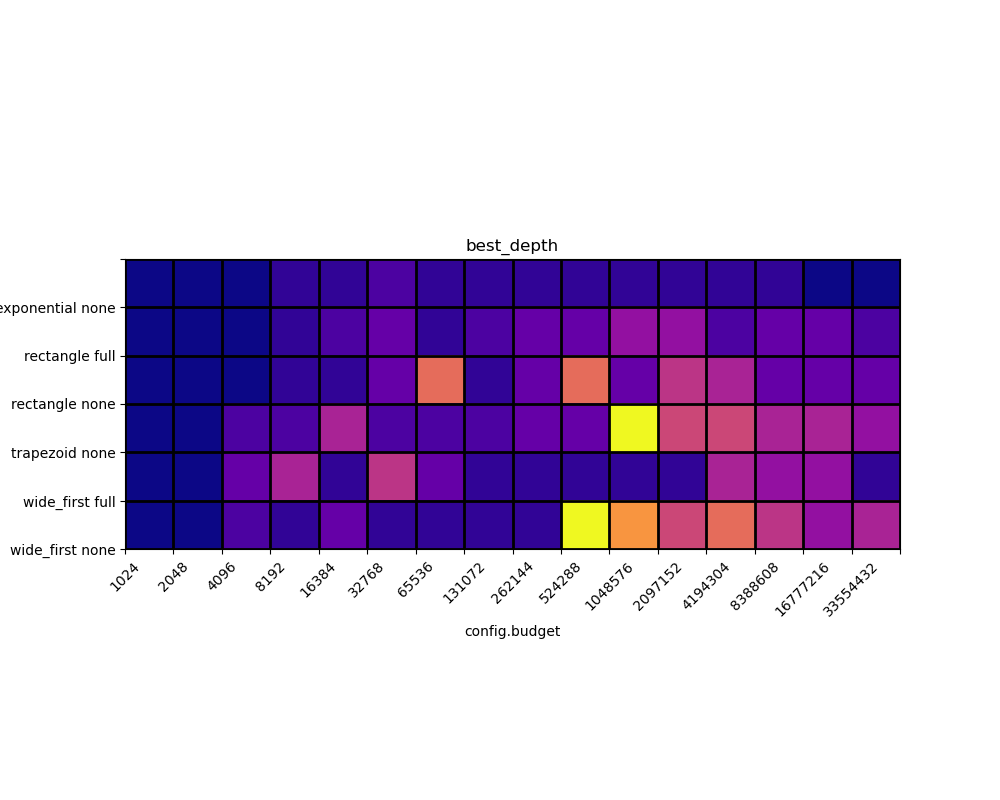

[[ 2.  2.  2.  3.  3.  4.  3.  3.  3.  3.  3.  3.  3.  3.  2.  2.]
 [ 2.  2.  2.  3.  4.  5.  3.  4.  5.  5.  7.  7.  4.  5.  5.  4.]
 [ 2.  2.  2.  3.  3.  5. 12.  3.  5. 12.  5.  9.  8.  5.  5.  5.]
 [ 2.  2.  4.  4.  8.  4.  4.  4.  5.  5. 18. 10. 10.  8.  8.  7.]
 [ 2.  2.  5.  8.  3.  9.  5.  3.  3.  3.  3.  3.  8.  7.  7.  3.]
 [ 2.  2.  4.  3.  5.  3.  3.  3.  3. 18. 14. 10. 12.  9.  7.  8.]]
dataset: adult
['exponential none', 'rectangle full', 'rectangle none', 'trapezoid none', 'wide_first full', 'wide_first none']
[1024, 2048, 4096, 8192, 16384, 32768, 65536, 131072, 262144, 524288, 1048576, 2097152, 4194304, 8388608, 16777216, 33554432]
3.60430908203125 3.60430908203125


<IPython.core.display.Javascript object>


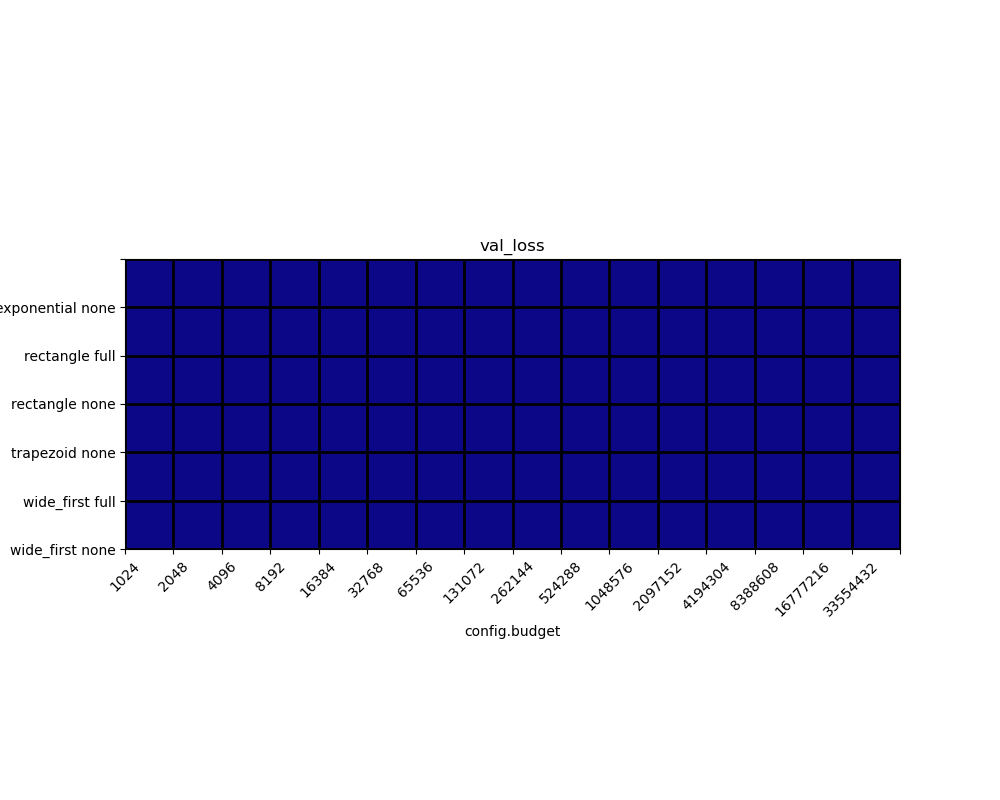

[[3.60430908 3.60430908 3.60430908 3.60430908 3.60430908 3.60430908
  3.60430908 3.60430908 3.60430908 3.60430908 3.60430908 3.60430908
  3.60430908 3.60430908 3.60430908 3.60430908]
 [3.60430908 3.60430908 3.60430908 3.60430908 3.60430908 3.60430908
  3.60430908 3.60430908 3.60430908 3.60430908 3.60430908 3.60430908
  3.60430908 3.60430908 3.60430908 3.60430908]
 [3.60430908 3.60430908 3.60430908 3.60430908 3.60430908 3.60430908
  3.60430908 3.60430908 3.60430908 3.60430908 3.60430908 3.60430908
  3.60430908 3.60430908 3.60430908 3.60430908]
 [3.60430908 3.60430908 3.60430908 3.60430908 3.60430908 3.60430908
  3.60430908 3.60430908 3.60430908 3.60430908 3.60430908 3.60430908
  3.60430908 3.60430908 3.60430908 3.60430908]
 [3.60430908 3.60430908 3.60430908 3.60430908 3.60430908 3.60430908
  3.60430908 3.60430908 3.60430908 3.60430908 3.60430908 3.60430908
  3.60430908 3.60430908 3.60430908 3.60430908]
 [3.60430908 3.60430908 3.60430908 3.60430908 3.60430908 3.60430908
  3.60430908 3.60

<IPython.core.display.Javascript object>


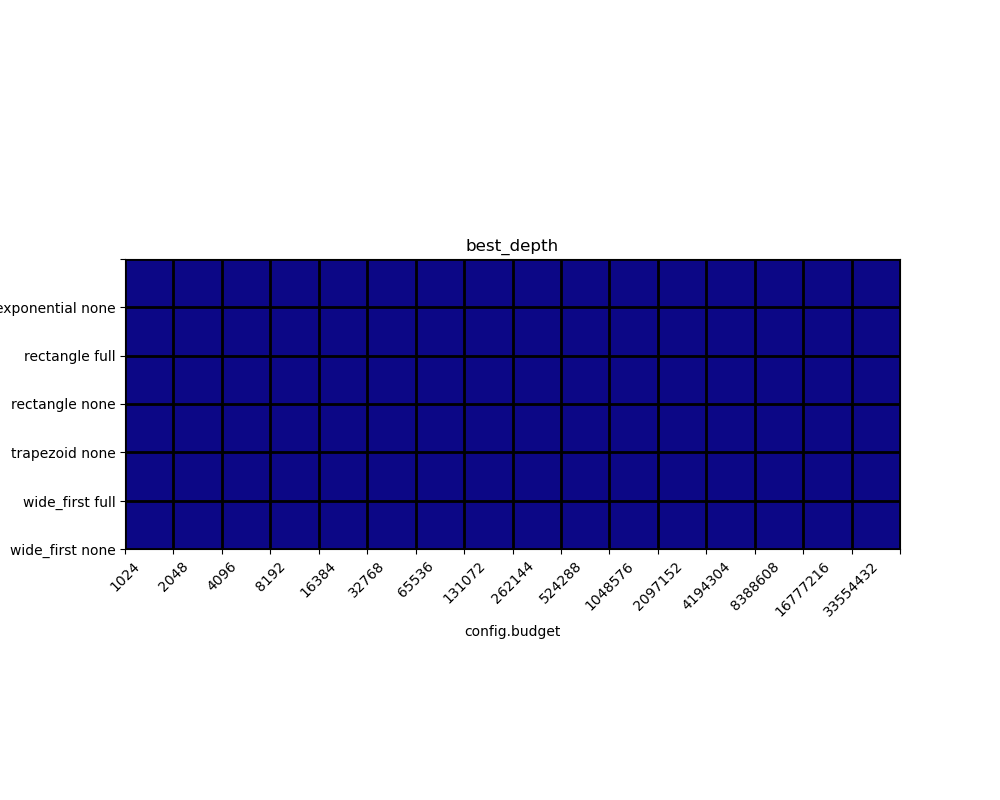

[[2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2.]
 [2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2.]
 [2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2.]
 [2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2.]
 [2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2.]
 [2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2.]]
dataset: connect_4
['exponential none', 'rectangle full', 'rectangle none', 'trapezoid none', 'wide_first full', 'wide_first none']
[1024, 2048, 4096, 8192, 16384, 32768, 65536, 131072, 262144, 524288, 1048576, 2097152, 4194304, 8388608, 16777216, 33554432]
0.6566939353942871 0.7625961899757385


<IPython.core.display.Javascript object>


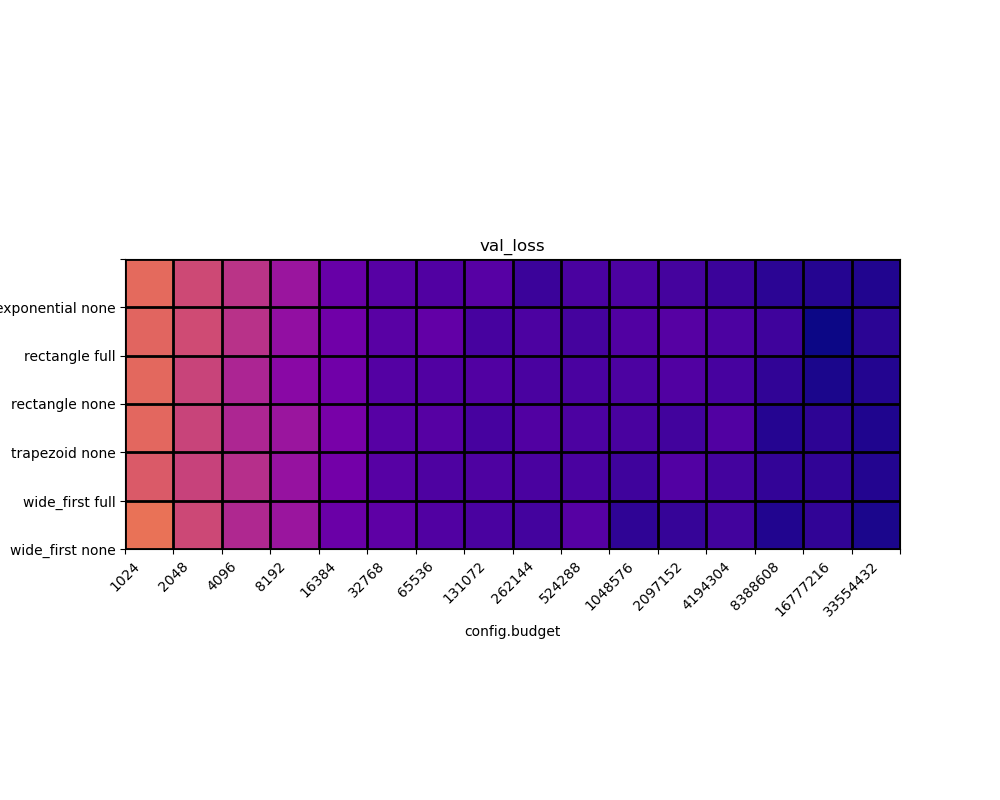

[[0.75840655 0.74012011 0.72818592 0.7105706  0.68870419 0.68203598
  0.67937696 0.68184075 0.67080596 0.67703101 0.67731956 0.67493862
  0.67091683 0.66539657 0.66356295 0.66216606]
 [0.75547117 0.74187934 0.72700483 0.70673335 0.69259414 0.68235788
  0.68640658 0.6755625  0.67748639 0.67481938 0.67967403 0.68119705
  0.67755032 0.6722618  0.65669394 0.66512981]
 [0.7574251  0.73706356 0.71961167 0.7031357  0.69253597 0.6805321
  0.67948756 0.6793029  0.67665327 0.67712706 0.67772958 0.67972824
  0.67545509 0.66729662 0.66013029 0.66255906]
 [0.756749   0.73687196 0.72042632 0.7110427  0.69523048 0.68201441
  0.68151045 0.67588255 0.67956531 0.67751801 0.67612129 0.67351604
  0.67923835 0.66371763 0.66611239 0.66140023]
 [0.74970618 0.73626849 0.72580212 0.70867291 0.69379461 0.68217635
  0.67790073 0.67815459 0.67659876 0.67701203 0.67267555 0.68031698
  0.67426705 0.66766223 0.66759351 0.66300368]
 [0.76259619 0.73982242 0.72183397 0.71067262 0.68948603 0.6844041
  0.67969787 0.6768

<IPython.core.display.Javascript object>


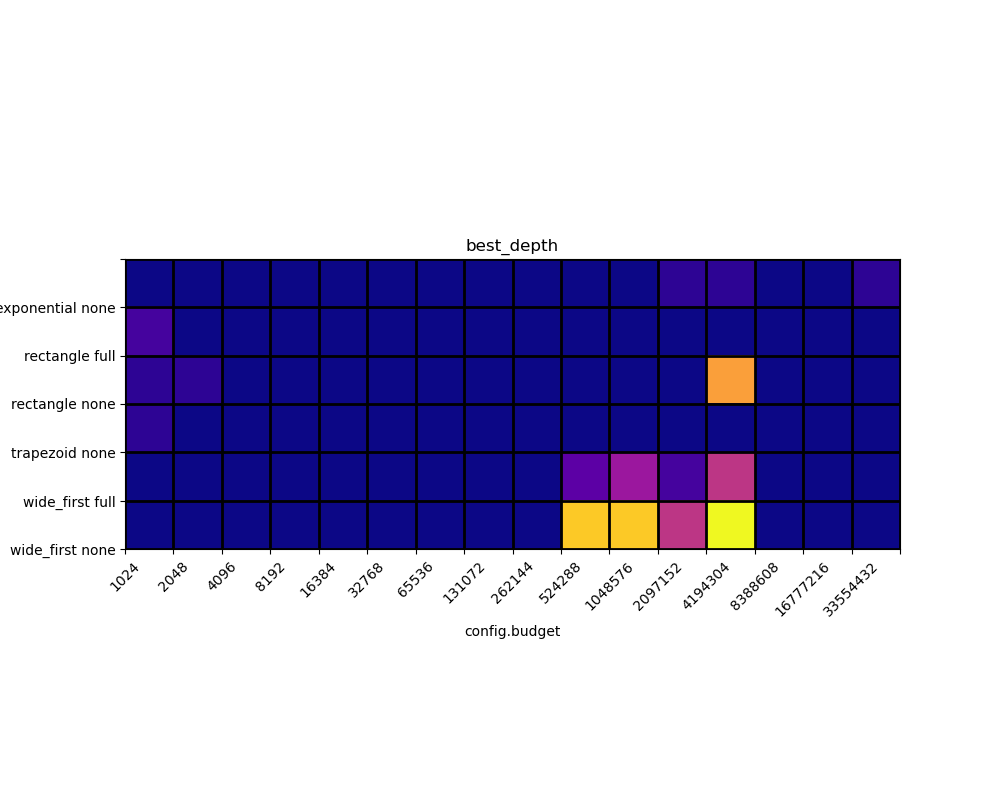

[[ 2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  3.  3.  2.  2.  3.]
 [ 4.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.]
 [ 3.  3.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2. 16.  2.  2.  2.]
 [ 3.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.]
 [ 2.  2.  2.  2.  2.  2.  2.  2.  2.  5.  8.  4. 10.  2.  2.  2.]
 [ 2.  2.  2.  2.  2.  2.  2.  2.  2. 18. 18. 10. 20.  2.  2.  2.]]
dataset: mnist
['exponential none', 'rectangle full', 'rectangle none', 'trapezoid none', 'wide_first full', 'wide_first none']
[1024, 2048, 4096, 8192, 16384, 32768, 65536, 131072, 262144, 524288, 1048576, 2097152, 4194304, 8388608, 16777216, 33554432]
0.07163850218057632 1.5172368288040161


<IPython.core.display.Javascript object>


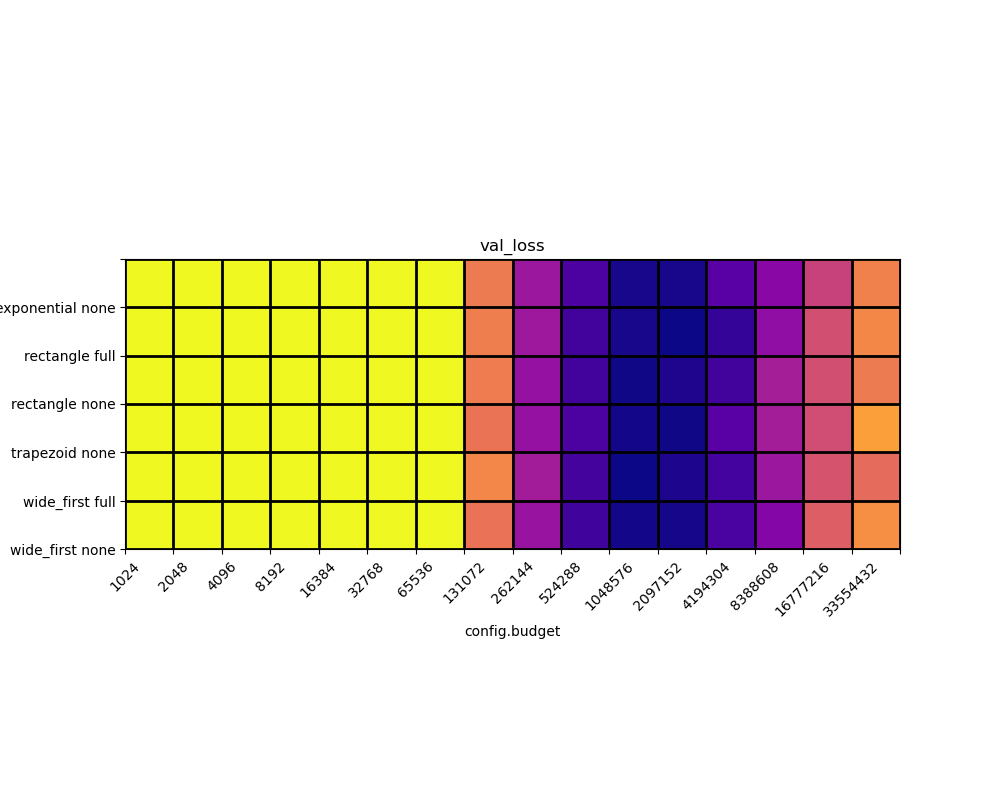

[[1.46671408 0.60810679 0.33066918 0.21630444 0.15294258 0.11683104
  0.09473199 0.08371965 0.07764493 0.07393001 0.07197413 0.07196026
  0.07449384 0.07672351 0.08037698 0.08408819]
 [1.5039379  0.60614499 0.34146191 0.21253119 0.14915168 0.11448741
  0.09441939 0.08392647 0.0777062  0.07352472 0.07197128 0.0716385
  0.07291701 0.07708596 0.08113227 0.08439739]
 [1.50368643 0.60701773 0.34366319 0.21591534 0.15171032 0.11722568
  0.09475316 0.08377159 0.07726334 0.07346823 0.07172268 0.07217783
  0.07347978 0.07807979 0.08108398 0.08370169]
 [1.35225606 0.61706421 0.32529904 0.21541957 0.15375008 0.11743066
  0.0946409  0.08330415 0.07726071 0.07388632 0.07178602 0.07175284
  0.07445589 0.0780728  0.08094475 0.08560776]
 [1.51723683 0.6065315  0.34753795 0.22781291 0.15305571 0.11603655
  0.09509818 0.08434247 0.07798524 0.07364291 0.07164803 0.07211771
  0.07358048 0.0776197  0.0813756  0.08277965]
 [1.50341243 0.60398743 0.34766231 0.2316412  0.15148537 0.11636305
  0.09458742 0.083

<IPython.core.display.Javascript object>


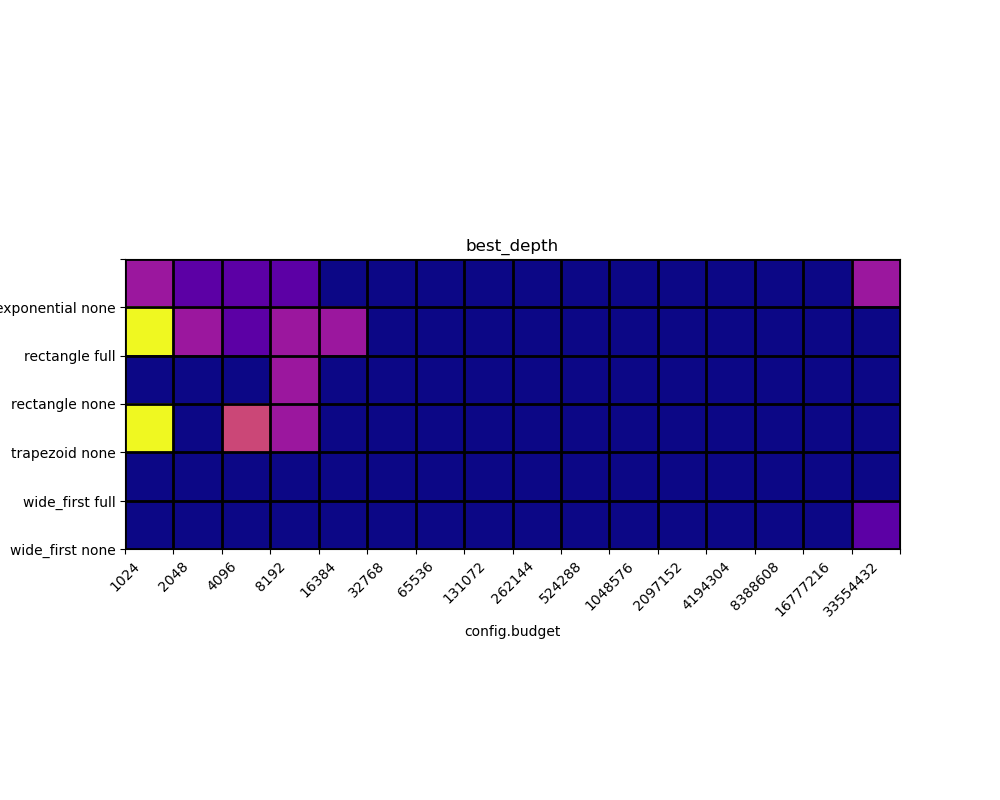

[[4. 3. 3. 3. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 4.]
 [8. 4. 3. 4. 4. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2.]
 [2. 2. 2. 4. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2.]
 [8. 2. 5. 4. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2.]
 [2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2.]
 [2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 3.]]
dataset: nursery
['exponential none', 'rectangle full', 'rectangle none', 'trapezoid none', 'wide_first none']
[1024, 2048, 4096, 8192, 16384, 32768, 65536, 131072, 262144, 524288, 1048576, 2097152, 4194304, 8388608, 16777216, 33554432]
nan nan


<IPython.core.display.Javascript object>


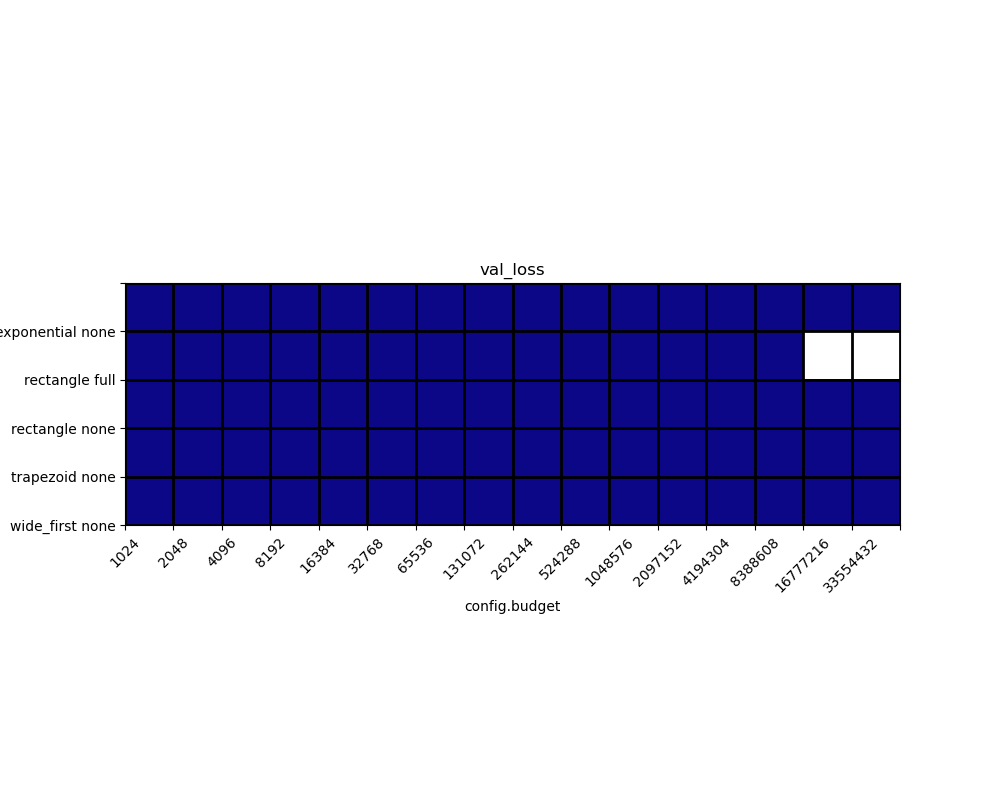

[[2.62839270e-08 1.26015851e-08 1.08079345e-08 8.60035865e-09
  8.11745204e-09 7.35859684e-09 6.59974164e-09 6.50775900e-09
  5.51894797e-09 5.31198707e-09 5.28899169e-09 4.80608375e-09
  3.97824174e-09 3.47233797e-09 2.62150013e-09 2.71348277e-09]
 [3.49530893e-08 1.69937504e-08 1.48091535e-08 1.44642418e-08
  1.34294389e-08 1.25096054e-08 1.05089919e-08 1.05319886e-08
  9.70414682e-09 1.07619407e-08 9.61216529e-09 8.87630591e-09
  9.31322042e-09 8.85331009e-09            nan            nan]
 [2.76866663e-08 1.55220317e-08 1.43032701e-08 1.35214213e-08
  1.38433602e-08 1.32684526e-08 1.25326056e-08 1.18197421e-08
  1.29695223e-08 1.03710200e-08 9.65815694e-09 6.41575881e-09
  4.66810679e-09 4.34616831e-09 2.39153847e-09 2.27656372e-09]
 [1.23256392e-08 1.71777126e-08 1.42802721e-08 1.09918985e-08
  1.12678453e-08 1.08309313e-08 1.06699627e-08 1.05549858e-08
  8.60035865e-09 9.01428043e-09 9.10626152e-09 6.82968704e-09
  3.84025511e-09 3.79426468e-09 1.74766579e-09 1.54070545e-09]
 [1.

<IPython.core.display.Javascript object>


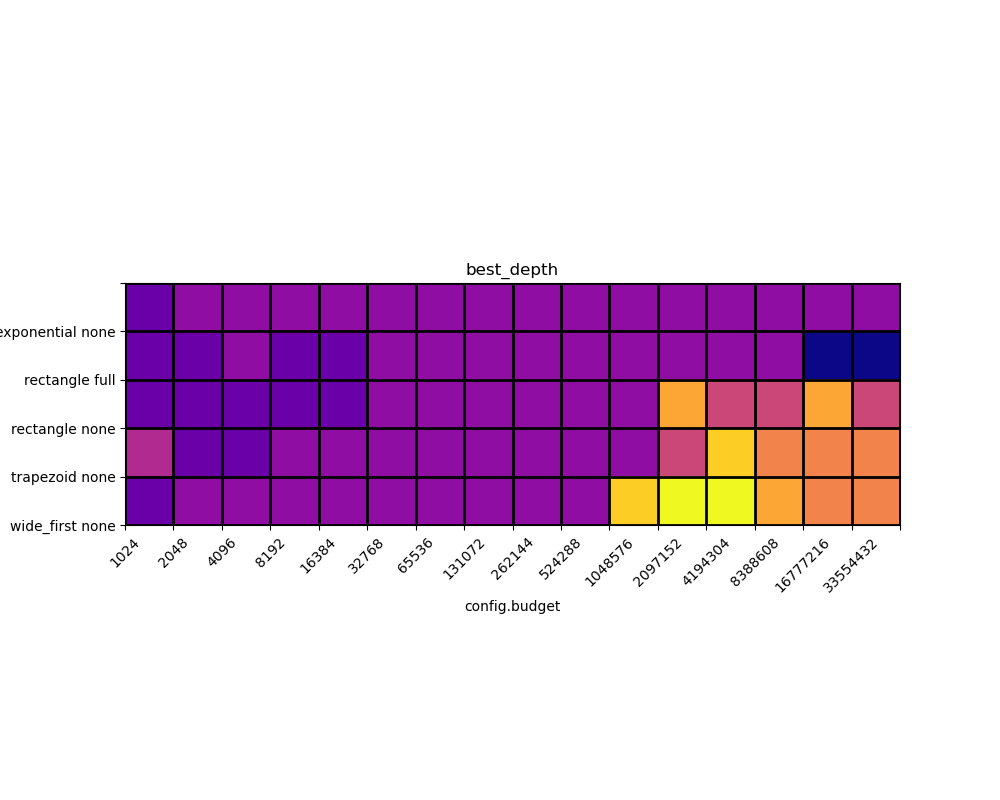

[[ 2.  3.  3.  3.  3.  3.  3.  3.  3.  3.  3.  3.  3.  3.  3.  3.]
 [ 2.  2.  3.  2.  2.  3.  3.  3.  3.  3.  3.  3.  3.  3.  0.  0.]
 [ 2.  2.  2.  2.  2.  3.  3.  3.  3.  3.  3.  8.  5.  5.  8.  5.]
 [ 4.  2.  2.  3.  3.  3.  3.  3.  3.  3.  3.  5.  9.  7.  7.  7.]
 [ 2.  3.  3.  3.  3.  3.  3.  3.  3.  3.  9. 10. 10.  8.  7.  7.]]
dataset: sleep
['exponential none', 'rectangle none', 'trapezoid none', 'wide_first none']
[1024, 2048, 4096, 8192, 16384, 32768, 65536, 131072, 262144, 524288, 1048576, 2097152, 4194304, 8388608, 16777216, 33554432]
0.6316048800945282 0.6694596111774445


<IPython.core.display.Javascript object>


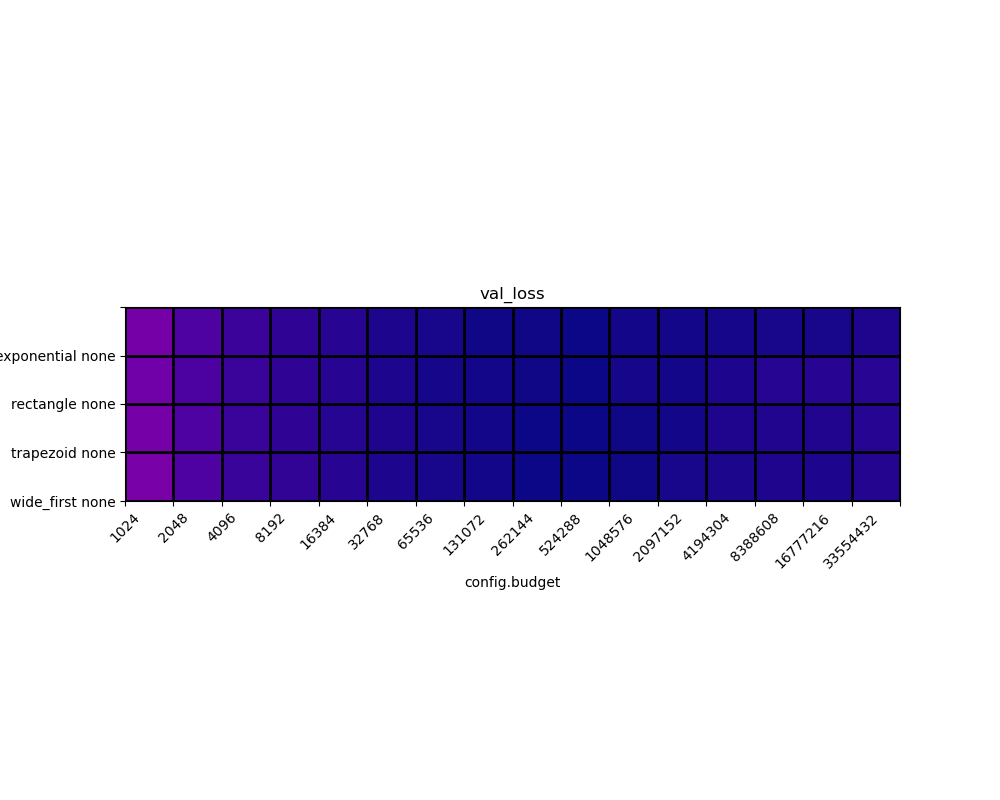

[[0.66788685 0.65245691 0.64521521 0.64110801 0.63848838 0.63578784
  0.63410079 0.63269293 0.63257456 0.63183993 0.63300228 0.63327399
  0.63390124 0.63461775 0.63432309 0.63612705]
 [0.6658349  0.65144804 0.64479333 0.64121002 0.63891852 0.63590053
  0.63394752 0.63320854 0.63235623 0.63169035 0.63364354 0.63304156
  0.6355792  0.63796669 0.63846216 0.63901794]
 [0.66744715 0.65278128 0.64459485 0.64140093 0.63815123 0.63611913
  0.634606   0.63289741 0.6321902  0.63160488 0.63226846 0.63300404
  0.636123   0.6367937  0.63684672 0.63834339]
 [0.66945961 0.65263698 0.64450386 0.6416989  0.63850632 0.6357156
  0.63446566 0.6328747  0.63199937 0.63201824 0.63234511 0.63407722
  0.63493213 0.63592449 0.63575414 0.63732308]]
['exponential none', 'rectangle none', 'trapezoid none', 'wide_first none']
[1024, 2048, 4096, 8192, 16384, 32768, 65536, 131072, 262144, 524288, 1048576, 2097152, 4194304, 8388608, 16777216, 33554432]
2.0 4.0


<IPython.core.display.Javascript object>


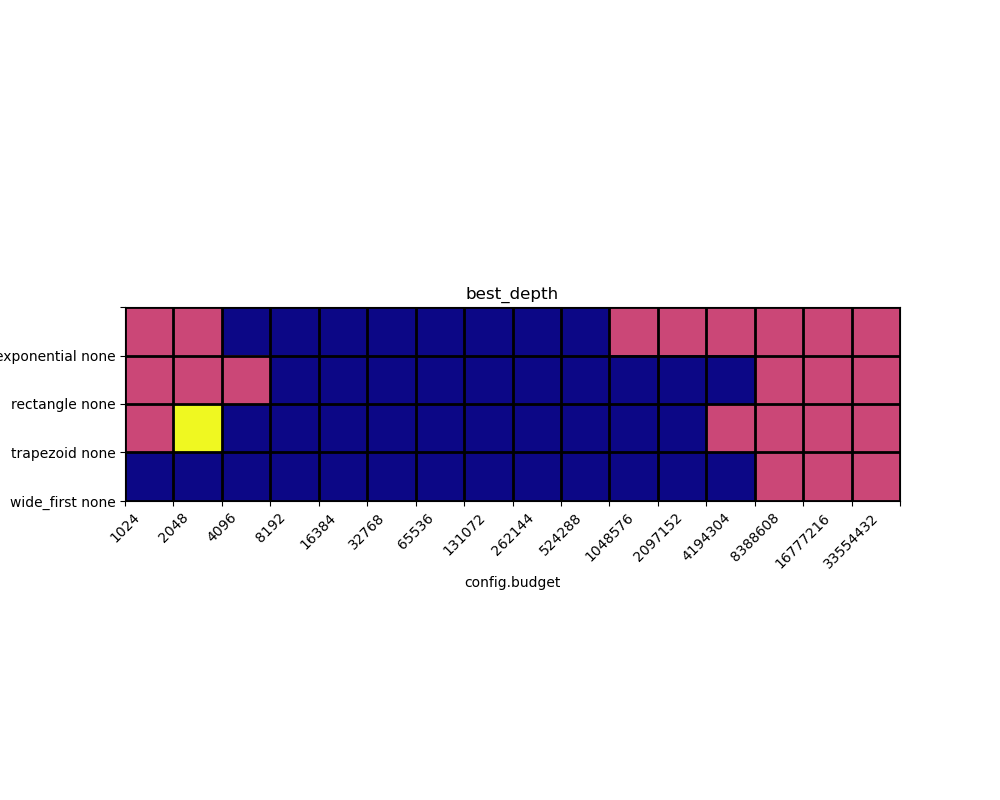

[[3. 3. 2. 2. 2. 2. 2. 2. 2. 2. 3. 3. 3. 3. 3. 3.]
 [3. 3. 3. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 3. 3. 3.]
 [3. 4. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 3. 3. 3. 3.]
 [2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 3. 3. 3.]]
dataset: wine_quality_white
['exponential none', 'rectangle none', 'trapezoid none', 'wide_first none']
[1024, 2048, 4096, 8192, 16384, 32768, 65536, 131072, 262144, 524288, 1048576, 2097152, 4194304, 8388608, 16777216, 33554432]
0.903162032365799 1.0336039066314697


<IPython.core.display.Javascript object>


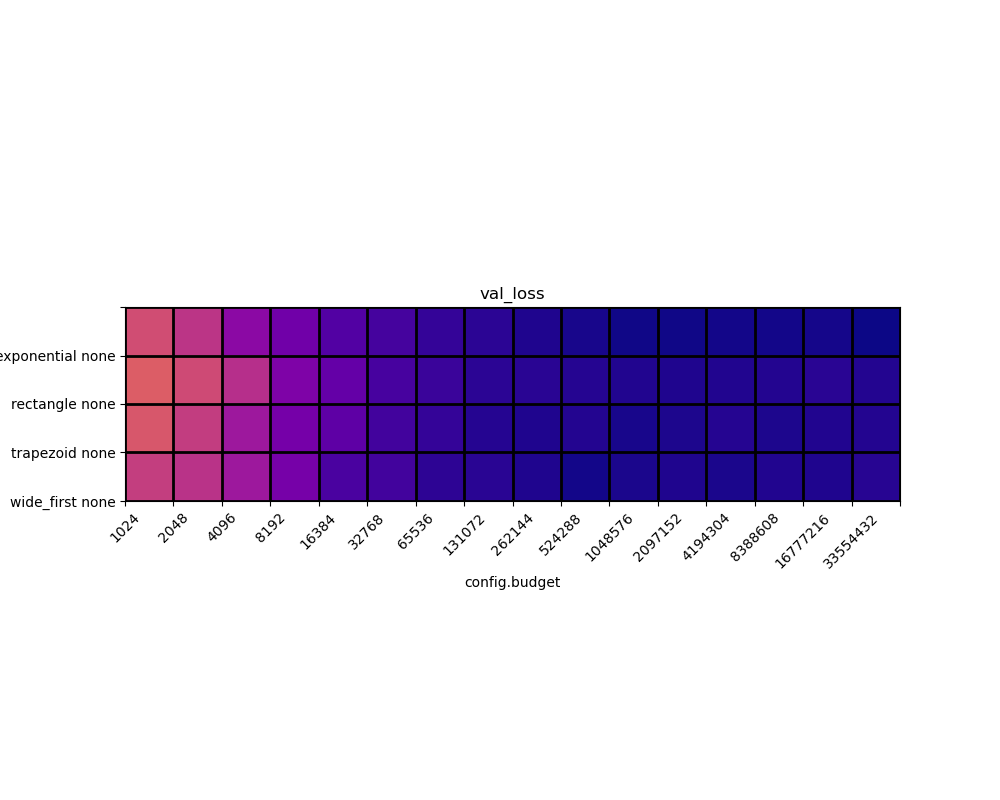

[[1.02087766 1.00245899 0.96829239 0.95198503 0.93541673 0.92858285
  0.91921005 0.91467729 0.9097684  0.90747324 0.9048101  0.90474656
  0.90557182 0.90507334 0.90636453 0.90316203]
 [1.03360391 1.01887262 0.99828494 0.95993862 0.94525361 0.92954901
  0.9218702  0.91492346 0.91402572 0.91210559 0.91109651 0.91014403
  0.91049105 0.91119304 0.91449076 0.91159672]
 [1.02918673 1.00837231 0.97940049 0.95445439 0.94194344 0.92664266
  0.91965905 0.91278434 0.91010472 0.91152281 0.90756199 0.90900505
  0.91243201 0.90902835 0.91066456 0.91171375]
 [1.00916284 1.00079775 0.97941253 0.95544371 0.93085286 0.92648575
  0.91564733 0.91449705 0.90981129 0.90575537 0.90802404 0.91013184
  0.90826035 0.91079548 0.90956956 0.91290545]]
['exponential none', 'rectangle none', 'trapezoid none', 'wide_first none']
[1024, 2048, 4096, 8192, 16384, 32768, 65536, 131072, 262144, 524288, 1048576, 2097152, 4194304, 8388608, 16777216, 33554432]
3.0 16.0


<IPython.core.display.Javascript object>


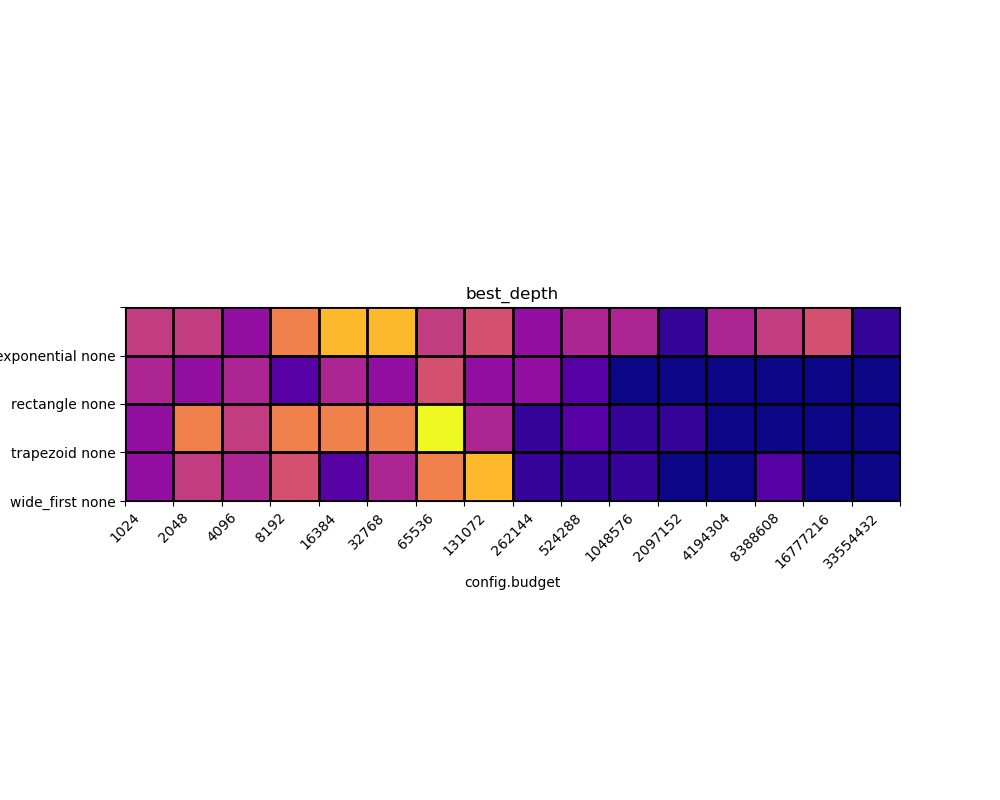

[[ 9.  9.  7. 12. 14. 14.  9. 10.  7.  8.  8.  4.  8.  9. 10.  4.]
 [ 8.  7.  8.  5.  8.  7. 10.  7.  7.  5.  3.  3.  3.  3.  3.  3.]
 [ 7. 12.  9. 12. 12. 12. 16.  8.  4.  5.  4.  4.  3.  3.  3.  3.]
 [ 7.  9.  8. 10.  5.  8. 12. 14.  4.  4.  4.  3.  3.  5.  3.  3.]]


In [308]:

# subset = datasets[(datasets['config.budget'] == 33554432)]
subset = datasets

for dataset in sorted(pd.unique(datasets['config.dataset'])):
    s = subset[(subset['config.dataset'] == dataset)]
    print(f'dataset: {dataset}')
    
    def get_min_loss(dataset):
        groups = dataset.groupby('config.depth')
        meds = groups['val_loss'].median()
        mins = meds.min()
        if not(isinstance(mins, float) or isinstance(mins, int)):
            mins = mins.min()
        return mins
    
    plot_grid_from_dataset(
        s,
        get_min_loss,
        'val_loss',
        'topology',
        'config.budget',
        color_bounds = lambda data : (np.min(data), 1.25 * np.min(data))
        )
    
    
    def get_min_loss_depth(dataset):
        groups = dataset.groupby('config.depth')
        meds = groups['val_loss'].median()
        if len(meds) == 0:
            return 0
        return meds.idxmin()
    
    plot_grid_from_dataset(
        s,
        get_min_loss_depth,
        'best_depth',
        'topology',
        'config.budget',
        )
